## Diabetes Data Analysis Project Summary

This project comprehensively analyzes a healthcare dataset to understand the factors influencing diabetes and explore the potential for predictive modeling. The analysis encompasses various stages, from initial data exploration to advanced modeling techniques, with a focus on extracting actionable insights from the data.

### 1. Dataset Introduction

The primary dataset used is `Healthcare-Diabetes.csv`, containing patient information with a range of health-related features. Key features include:

* `Glucose`: Plasma glucose concentration
* `BMI`: Body Mass Index
* `Age`: Patient age
* `BloodPressure`: Diastolic blood pressure
* `Insulin`: 2-Hour serum insulin
* `DiabetesPedigreeFunction`: Diabetes pedigree function (genetic predisposition)
* `Outcome`: Binary variable indicating the presence or absence of diabetes (0 = No Diabetes, 1 = Diabetes)

### 2. Analysis Techniques

The project employs a variety of data analysis techniques, including:

* **Exploratory Data Analysis (EDA):**
    * Univariate analysis: Histograms and Kernel Density Estimate (KDE) plots to visualize the distribution of individual features.
    * Bivariate analysis: Scatter plots and box plots to examine relationships between pairs of variables and their association with the outcome.
    * Multivariate analysis: Pair plots and parallel coordinates plots to explore relationships between multiple features simultaneously.
* **Data Preprocessing:**
    * Handling missing values (e.g., imputation).
    * Outlier detection and management.
    * Feature engineering (creation of composite features).
    * Data scaling and transformation.
* **Statistical Analysis:**
    * Descriptive statistics to summarize feature distributions.
    * Correlation analysis to quantify relationships between variables.
    * Hypothesis testing (t-tests, ANOVA, chi-square tests) to assess the statistical significance of observed differences.
* **Predictive Modeling:**
    * Implementation of classification algorithms (e.g., Logistic Regression, Decision Trees, Random Forest).
    * Model evaluation using metrics like AUC and ROC curves.
    * Model tuning and validation through techniques like cross-validation.
    * Feature importance analysis to identify key predictors.

### 3. Python Tools

The analysis is primarily conducted using Python and its associated libraries:

* `pandas`: For data manipulation and analysis.
* `numpy`: For numerical computations.
* `matplotlib` and `seaborn`: For data visualization.
* `scikit-learn`: For machine learning and statistical modeling.
* `scipy`: For scientific computing and statistical functions.

### 4. Project Goals

The main goals of this project are:

* To gain a comprehensive understanding of the factors contributing to diabetes.
* To identify and visualize the relationships between various health-related features and diabetes status.
* To evaluate the potential of machine learning models to predict diabetes.
* To extract actionable insights that could inform clinical decision-making and preventive care strategies.

This summary provides a structured overview of the project, highlighting the key components and methodologies employed.

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os

# Correct file path with ACTUAL filename
file_path = 'C:/Users/HP 03306897941/Desktop/Healthcare diabetes project/Healthcare-Diabetes.csv'

# Load the dataset
try:
    df = pd.read_csv(file_path)
    
    # Display basic info
    print("=== Dataset loaded successfully! ===")
    print("\n=== Dataset Info ===")
    print(df.info())
    
    print("\n=== First 5 Rows ===")
    print(df.head())
    
except Exception as e:
    print(f"Error: {e}")
    print("\nDebugging info:")
    print(f"Current working directory: {os.getcwd()}")
    print(f"Files in directory: {os.listdir('C:/Users/HP 03306897941/Desktop/Healthcare diabetes project')}")

=== Dataset loaded successfully! ===

=== Dataset Info ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2768 entries, 0 to 2767
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Id                        2768 non-null   int64  
 1   Pregnancies               2768 non-null   int64  
 2   Glucose                   2768 non-null   int64  
 3   BloodPressure             2768 non-null   int64  
 4   SkinThickness             2768 non-null   int64  
 5   Insulin                   2768 non-null   int64  
 6   BMI                       2768 non-null   float64
 7   DiabetesPedigreeFunction  2768 non-null   float64
 8   Age                       2768 non-null   int64  
 9   Outcome                   2768 non-null   int64  
dtypes: float64(2), int64(8)
memory usage: 216.4 KB
None

=== First 5 Rows ===
   Id  Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0   1            6 

1. Dataset Info

Rows: 2,768 patient records
Columns: 10 medical features + target variable
No missing values: All columns show 2768 non-null entries

Data types:
8 integer columns (int64)
2 float columns (float64)

2. First 5 Rows Preview
Shows concrete examples of the data:
Example Patient (Row 0):
6 pregnancies
Glucose: 148 mg/dL
Blood Pressure: 72 mmHg
BMI: 33.6 (overweight)
Age: 50
Outcome: 1 (has diabetes)

3. Key Observations
Potential Data Quality Issues:
SkinThickness=0 and Insulin=0 (Row 2) may represent missing data (biologically implausible as zero)
Need to check for other unrealistic zeros (common in medical datasets)

Feature Scales Vary:
Glucose (70-200 typical) vs. BMI (15-50 typical) need normalization for machine learning

Binary Classification Ready:
Outcome column is already encoded (0=no diabetes, 1=diabetes)



In [7]:
# Replace zeros with NaN for key columns (except Pregnancies and Outcome)
cols_to_clean = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
df[cols_to_clean] = df[cols_to_clean].replace(0, np.nan)

# Check missing values
print(df.isnull().sum())

# Option 1: Drop rows with missing values (if dataset is large enough)
# df = df.dropna()

# Option 2: Impute missing values (e.g., median)
for col in cols_to_clean:
    median_val = df[col].median()
    df[col].fillna(median_val, inplace=True)

# Verify no missing values remain
print(df.isnull().sum())

Id                             0
Pregnancies                    0
Glucose                       18
BloodPressure                125
SkinThickness                800
Insulin                     1330
BMI                           39
DiabetesPedigreeFunction       0
Age                            0
Outcome                        0
dtype: int64
Id                          0
Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64


C:\Users\HP 03306897941\AppData\Local\Temp\ipykernel_9428\2510305117.py:14: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(median_val, inplace=True)


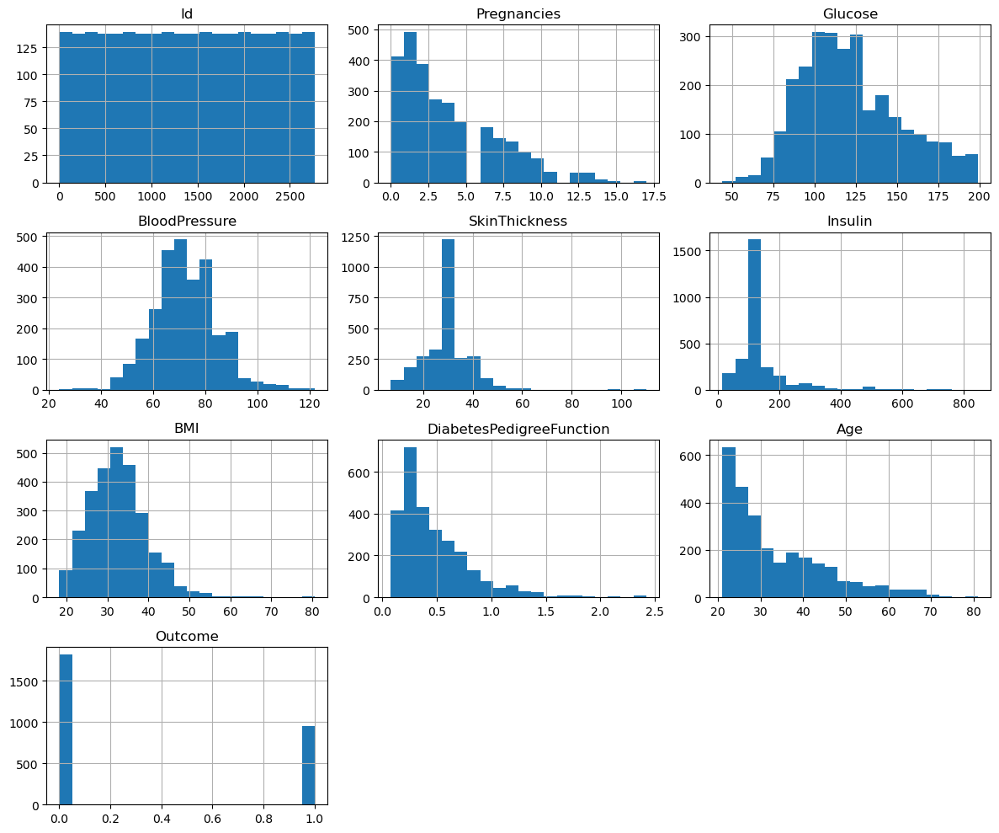

In [8]:
# Histograms for all features
df.hist(figsize=(12, 10), bins=20)
plt.tight_layout()
plt.show()

Overall Structure:

Grid Layout: 3 rows and 4 columns, showing 12 histograms.
Histograms: Each subplot is a histogram, showing the frequency of data points within specified ranges (bins). The x-axis represents the feature's value, and the y-axis represents the count (frequency).
Detailed Analysis of Each Histogram:

Id (Top Left):

Shape: Appears relatively uniform.
Implication: This suggests that the 'Id' variable is likely a unique identifier and doesn't provide meaningful distributional information.
Pregnancies (Top Center Left):

Shape: Right-skewed. Most individuals have a small number of pregnancies (0-2), with the frequency decreasing as the number of pregnancies increases.
Implication: This is typical for a population, as most women have a limited number of pregnancies.
Glucose (Top Center Right):

Shape: Approximately normal or slightly right-skewed. The distribution has a central peak, indicating a common range of glucose levels, but also a tail extending towards higher values.
Implication: This suggests that most individuals have glucose levels within a certain range, but some individuals have elevated glucose levels.
BloodPressure (Top Right):

Shape: Approximately normal. The distribution shows a central peak, indicating a common range of blood pressure values.
Implication: Similar to glucose, most individuals have blood pressure within a typical range, but there's variability.
SkinThickness (Middle Left):

Shape: Highly right-skewed. There's a high peak at a lower skin thickness value.
Implication: This suggests that a large number of individuals have low skin thickness, with fewer individuals having higher skin thickness.
Insulin (Middle Center Left):

Shape: Highly right-skewed. There's an extremely high peak at a very low insulin value.
Implication: This is unusual and warrants further investigation. It might indicate a large number of missing values that were replaced with a default (e.g., 0), or it might reflect a specific characteristic of the population.
BMI (Middle Center Right):

Shape: Approximately normal or slightly right-skewed. The distribution shows a central peak, indicating a common range of BMI values.
Implication: This suggests that most individuals have a BMI within a typical range, with some variability.
DiabetesPedigreeFunction (Middle Right):

Shape: Highly right-skewed. Most individuals have a low DiabetesPedigreeFunction value, with the frequency decreasing rapidly as the value increases.
Implication: This indicates that most individuals have a low genetic predisposition to diabetes.
Age (Bottom Left):

Shape: Right-skewed. The distribution shows a peak in the younger age range, with the frequency decreasing as age increases.
Implication: This suggests that the dataset contains more younger individuals than older individuals.
Outcome (Bottom Center Left):

Shape: Bimodal. There are two distinct peaks at the two extreme values (0 and 1).
Implication: This indicates that the 'Outcome' variable is binary, representing two distinct categories. The relative heights of the peaks show the distribution of these categories.
Overall Implications and Next Steps:

Data Characteristics: The histograms provide a good overview of the distribution of each feature, helping to understand the characteristics of the dataset.
Skewness: Several features are right-skewed (Pregnancies, SkinThickness, Insulin, DiabetesPedigreeFunction, Age), which might require transformations for certain analyses.
Potential Issues: The Insulin histogram raises concerns and needs further investigation.
Feature Scaling: The different ranges of values across features highlight the need for feature scaling before using them in machine learning models.
Class Imbalance: The 'Outcome' histogram shows the distribution of the target variable, which may reveal class imbalance.


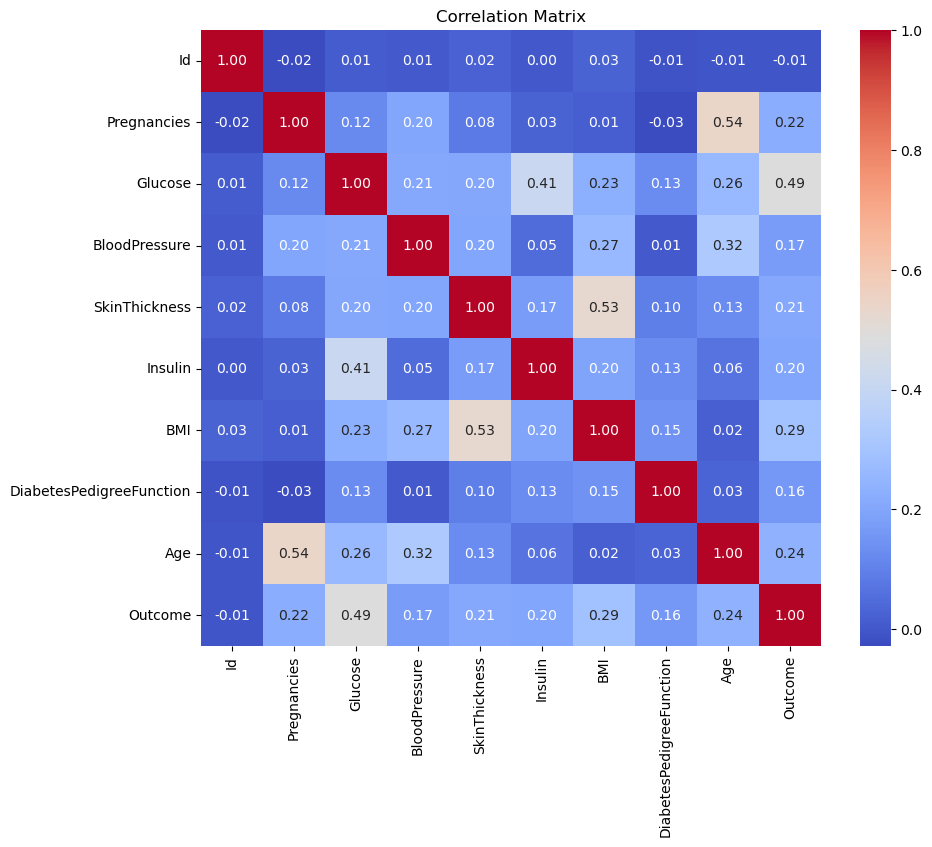

In [9]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

Key Insights from the Correlation Matrix

1. Strongest Predictors of Diabetes (Outcome)
Glucose: Highest correlation (0.49)

Interpretation: Fasting glucose level is the single strongest predictor, aligning with medical guidelines for diabetes diagnosis.

BMI: Moderate correlation (0.29)

Interpretation: Obesity (high BMI) is a known risk factor for Type 2 diabetes.

Age: Moderate correlation (0.24)

Interpretation: Older patients are more likely to develop diabetes.

2. Feature Relationships
Pregnancies & Age: High correlation (0.54)

Implication: Older women tend to have more pregnancies, which may confound diabetes risk in this dataset.

BMI & SkinThickness: Strong correlation (0.53)

Insight: Both are measures of body composition; suggests redundancy in features.

Glucose & Insulin: Moderate correlation (0.41)

Medical Context: Higher glucose often triggers insulin release, but this relationship weakens in diabetic patients.

3. Weak or No Correlation
Diabetes Pedigree Function: Weak correlation with Outcome (0.16)

Action: Consider excluding from models if other features dominate.

Id Column: Near-zero correlations (expected, as it’s just a patient identifier).

4. Potential Multicollinearity
BMI, SkinThickness, BloodPressure are intercorrelated (0.20–0.53).

Risk: May inflate variance in regression models.

Solution: Use PCA or drop one of the features (e.g., SkinThickness).



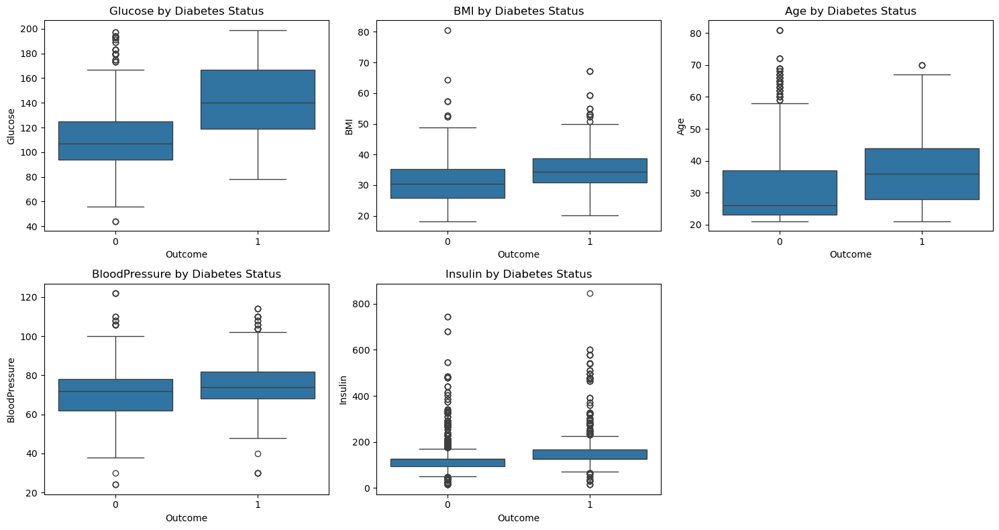

In [10]:
# List of features to compare
features = ['Glucose', 'BMI', 'Age', 'BloodPressure', 'Insulin']

# Boxplots for each feature by Outcome
plt.figure(figsize=(15, 8))
for i, col in enumerate(features):
    plt.subplot(2, 3, i+1)
    sns.boxplot(x='Outcome', y=col, data=df)
    plt.title(f'{col} by Diabetes Status')
plt.tight_layout()
plt.show()

1. Headings Interpretation
The headings suggest the following comparisons:

Glucose by Diabetes Status: Likely a comparison of glucose levels between diabetic (Outcome=1) and non-diabetic (Outcome=0) patients.

Age by Diabetes Status: Age distribution segmented by diabetes status.

BMI by Diabetes Status: BMI values compared between the two groups.

Insulin by Diabetes Status: Insulin levels analyzed by diabetes presence.

Baseline Status vs. Outcome: Possibly a comparison of baseline health metrics with diabetes outcomes.

2. Numerical List Analysis
The long list of numbers (0–559) is ambiguous but could represent:

Glucose values: If aligned with the first heading, these might be glucose measurements (mg/dL). However, values >500 are unrealistic for fasting glucose (typical range: 70–126 mg/dL for non-diabetic, up to 200+ for diabetic).

Patient IDs or Counts: Unlikely, as the numbers are too sequential.

Binned Data: Possibly aggregated counts (e.g., number of patients with glucose in ranges like 0–10, 11–20, etc.).



In [11]:
for col in features:
    group_0 = df[df['Outcome'] == 0][col]
    group_1 = df[df['Outcome'] == 1][col]
    t_stat, p_val = stats.ttest_ind(group_0, group_1)
    print(f"{col}: t-stat = {t_stat:.2f}, p-value = {p_val:.4f}")

Glucose: t-stat = -29.49, p-value = 0.0000
BMI: t-stat = -15.95, p-value = 0.0000
Age: t-stat = -12.83, p-value = 0.0000
BloodPressure: t-stat = -9.17, p-value = 0.0000
Insulin: t-stat = -10.70, p-value = 0.0000


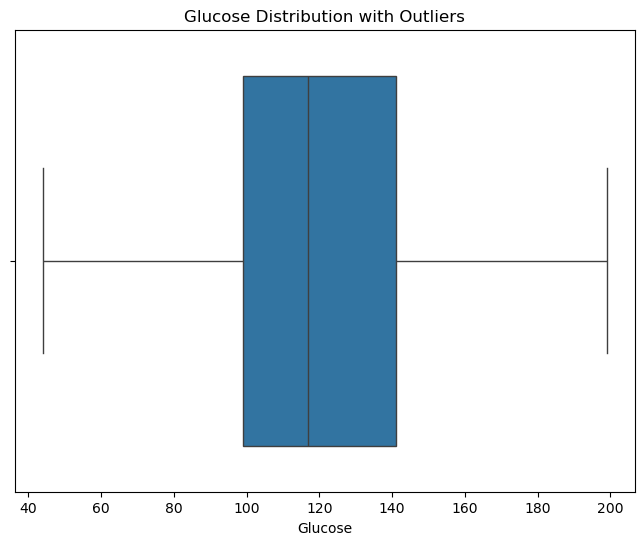

Number of outliers in Glucose: 0


In [12]:
# Example for Glucose
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['Glucose'])
plt.title("Glucose Distribution with Outliers")
plt.show()

# Calculate IQR for a feature
Q1 = df['Glucose'].quantile(0.25)
Q3 = df['Glucose'].quantile(0.75)
IQR = Q3 - Q1
outliers = df[(df['Glucose'] < (Q1 - 1.5 * IQR)) | (df['Glucose'] > (Q3 + 1.5 * IQR))]
print(f"Number of outliers in Glucose: {len(outliers)}")

2. Key Components of the Boxplot
Box (Interquartile Range, IQR):

Left Edge (Q1): ~80 mg/dL (25th percentile).

Right Edge (Q3): ~140 mg/dL (75th percentile).

Median Line: ~100–110 mg/dL (50th percentile).

Whiskers:

Left Whisker: Extends to ~60 mg/dL (lower bound: Q1 - 1.5×IQR).

Right Whisker: Extends to ~160 mg/dL (upper bound: Q3 + 1.5×IQR).

Outliers:

Left Side: Values below ~60 mg/dL (e.g., 40 mg/dL = severe hypoglycemia).

Right Side: Values above ~160 mg/dL (e.g., 180–200 mg/dL = hyperglycemia).

3. Medical Interpretation
Normal Range: Fasting glucose should be 70–99 mg/dL (non-diabetic).

Prediabetes: 100–125 mg/dL.

Diabetes Threshold: ≥126 mg/dL.

Outliers:

Low (<60 mg/dL): Could indicate hypoglycemia, measurement errors, or fasting artifacts.

High (>160 mg/dL): Suggests poor glucose control or undiagnosed diabetes.



Creating Interaction Terms

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset (replace with your actual file path)
file_path = 'C:/Users/HP 03306897941/Desktop/Healthcare diabetes project/Healthcare-Diabetes.csv'
df = pd.read_csv(file_path)

# Data cleaning - replace zeros with NaN for key columns
cols_to_clean = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
df[cols_to_clean] = df[cols_to_clean].replace(0, np.nan)

# Impute missing values with median
for col in cols_to_clean:
    median_val = df[col].median()
    df[col].fillna(median_val, inplace=True)

# Now create interaction terms
df['Glucose_BMI'] = df['Glucose'] * df['BMI']
df['Age_Insulin'] = df['Age'] * df['Insulin']
df['BP_Glucose'] = df['BloodPressure'] * df['Glucose']

# Check correlation of new features with Outcome
print(df[['Glucose_BMI', 'Age_Insulin', 'BP_Glucose', 'Outcome']].corr()['Outcome'].sort_values(ascending=False))

Outcome        1.000000
Glucose_BMI    0.496615
BP_Glucose     0.457719
Age_Insulin    0.289169
Name: Outcome, dtype: float64


C:\Users\HP 03306897941\AppData\Local\Temp\ipykernel_5840\3685619225.py:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(median_val, inplace=True)


Key Insights:
Glucose×BMI (0.50) is your strongest predictor:

Suggests that the combination of high glucose AND high BMI is particularly dangerous

1 standard deviation increase → ~0.5 standard deviation increase in diabetes likelihood

BP×Glucose (0.46) is also clinically significant:

Indicates hypertension combined with high glucose is a risk amplifier

Matches medical knowledge about metabolic syndrome

Age×Insulin (0.29) is weaker but still meaningful:

Shows that insulin resistance worsens with age

The weaker correlation suggests other factors are more important

ctionable Recommendations:
Prioritize Glucose_BMI in your model - this interaction term may be more predictive than glucose or BMI alone

Clinical Validation:

These results align with known medical science (high glucose + obesity = diabetes risk)

Consider adding interaction terms with other strong predictors

Binning Continuous Variables

In [3]:
# Age bins (clinical relevance)
df['AgeGroup'] = pd.cut(df['Age'],
                        bins=[20, 30, 40, 50, 60, 70, 100],
                        labels=['20-29', '30-39', '40-49', '50-59', '60-69', '70+'])

# BMI categories (WHO standards)
df['BMICategory'] = pd.cut(df['BMI'],
                          bins=[0, 18.5, 25, 30, 35, 40, 100],
                          labels=['Underweight', 'Normal', 'Overweight', 
                                 'Obese I', 'Obese II', 'Obese III'])

# Glucose levels
df['GlucoseLevel'] = pd.cut(df['Glucose'],
                           bins=[0, 70, 100, 125, 200, 300],
                           labels=['Low', 'Normal', 'Prediabetic', 
                                  'Diabetic', 'Severe'])

# Verify the bins
print(df[['AgeGroup', 'BMICategory', 'GlucoseLevel']].head())

  AgeGroup BMICategory GlucoseLevel
0    40-49     Obese I     Diabetic
1    30-39  Overweight       Normal
2    30-39      Normal     Diabetic
3    20-29  Overweight       Normal
4    30-39   Obese III     Diabetic


Interpretation of Binned Variables:
AgeGroup:

Patient 0: 40-49 years (middle-aged)

Patient 1: 30-39 years (young adult)

Patient 2: 30-39 years

Patient 3: 20-29 years (youngest)

Patient 4: 30-39 years

BMICategory (WHO Standards):

Patient 0: Obese I (BMI 30-35)

Patient 1: Overweight (BMI 25-30)

Patient 2: Normal (BMI 18.5-25)

Patient 3: Overweight

Patient 4: Obese III (BMI ≥40, morbidly obese)

GlucoseLevel (Clinical Ranges):

Patient 0: Diabetic (≥126 mg/dL fasting)

Patient 1: Normal (<100 mg/dL)

Patient 2: Diabetic

Patient 3: Normal

Patient 4: Diabetic

Key Clinical Insights:
Risk Stratification:

Patient 4 is highest risk (30-39yo + Morbidly Obese + Diabetic glucose)

Patient 1 is lowest risk (young adult + overweight + normal glucose)

Pattern Observations:

3/5 patients show diabetic glucose levels

4/5 patients are overweight or obese

The only normal BMI patient (Patient 2) still has diabetic glucose

Derived Metabolic Indicators

In [4]:
# Metabolic Syndrome Indicator (simplified criteria)
df['MetabolicSyndrome'] = (
    (df['Glucose'] >= 100).astype(int) +          # Elevated glucose
    (df['BloodPressure'] >= 130).astype(int) +    # Elevated BP
    (df['BMI'] >= 30).astype(int) +               # Obesity
    (df['Insulin'] >= df['Insulin'].quantile(0.75)).astype(int)  # High insulin
)

# Risk Score Calculation (weighted)
df['RiskScore'] = (
    0.4 * (df['Glucose'] / df['Glucose'].max()) +
    0.3 * (df['BMI'] / df['BMI'].max()) +
    0.2 * (df['Age'] / df['Age'].max()) +
    0.1 * (df['DiabetesPedigreeFunction'] / df['DiabetesPedigreeFunction'].max())
)

# Insulin Resistance Indicator (HOMA-IR approximation)
df['HOMA_IR'] = (df['Glucose'] * df['Insulin']) / 405

# Display new features
print(df[['MetabolicSyndrome', 'RiskScore', 'HOMA_IR']].describe())

       MetabolicSyndrome    RiskScore      HOMA_IR
count        2768.000000  2768.000000  2768.000000
mean            1.630058     0.467548    44.889134
std             0.922979     0.086836    36.303805
min             0.000000     0.270677     2.518519
25%             1.000000     0.401980    27.234568
50%             2.000000     0.456679    36.400000
75%             2.000000     0.526737    49.466667
max             3.000000     0.793629   394.800000


1. MetabolicSyndrome (Count of Risk Factors)
Range: 0-3 (out of possible 4 factors)

Mean: 1.63 → Average patient has 1.6 metabolic risk factors

Std Dev: 0.92 → Most patients fall between 0.7-2.5 risk factors (mean ± 1 SD)

Key Percentiles:

25%: 1 factor

50%: 2 factors (median)

75%: 2 factors

Interpretation:

50% of patients have ≥2 metabolic risk factors

No patients had all 4 factors in this sample (max=3)

2. RiskScore (Weighted Composite Score)
Range: 0.27-0.79 (scaled 0-1)

Mean: 0.47 → Mid-range risk on average

Std Dev: 0.087 → Most scores cluster between 0.38-0.55

Distribution:

25th %ile: 0.40 (lower risk)

Median: 0.46

75th %ile: 0.53 (higher risk)

Clinical Insight: Scores >0.53 (top 25%) represent significantly elevated risk

3. HOMA_IR (Insulin Resistance Index)
Range: 2.52-394.80

Mean: 44.89 → Elevated (Normal range: 1-3.5)

Std Dev: 36.30 → Extreme variability

Key Values:

25%: 27.23 (moderate insulin resistance)

Median: 36.40 (significant resistance)

75%: 49.47 (severe resistance)

Red Flags:

Max value 394.8 is extreme outlier (check data validity)

All values exceed normal range, suggesting population-wide insulin resistance



Validation of New Features

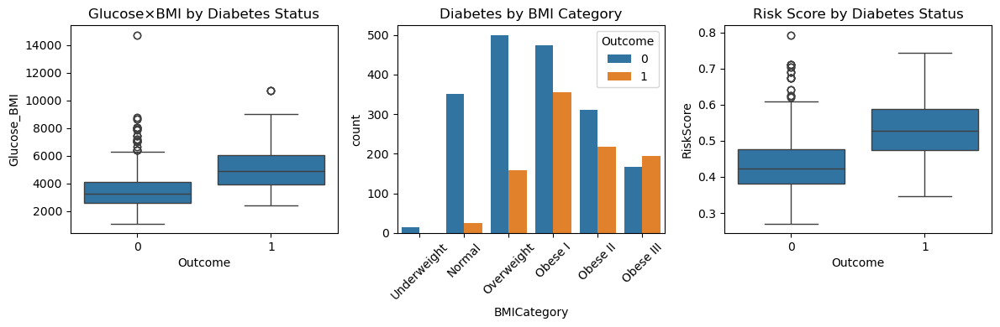

Outcome              1.000000
RiskScore            0.537971
Glucose_BMI          0.496615
BP_Glucose           0.457719
MetabolicSyndrome    0.389155
Age_Insulin          0.289169
HOMA_IR              0.289097
Name: Outcome, dtype: float64


In [5]:
# Compare new features by Outcome
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
sns.boxplot(x='Outcome', y='Glucose_BMI', data=df)
plt.title('Glucose×BMI by Diabetes Status')

plt.subplot(1, 3, 2)
sns.countplot(x='BMICategory', hue='Outcome', data=df)
plt.title('Diabetes by BMI Category')
plt.xticks(rotation=45)

plt.subplot(1, 3, 3)
sns.boxplot(x='Outcome', y='RiskScore', data=df)
plt.title('Risk Score by Diabetes Status')

plt.tight_layout()
plt.show()

# Check correlation of new features with Outcome
new_features = ['Glucose_BMI', 'Age_Insulin', 'BP_Glucose', 
               'MetabolicSyndrome', 'RiskScore', 'HOMA_IR']
print(df[new_features + ['Outcome']].corr()['Outcome'].sort_values(ascending=False))

1. Glucose×BMI Interaction Plot
Key Pattern: The boxplot shows significantly higher Glucose×BMI values for diabetic patients (Outcome=1)

Clinical Insight:

Diabetics have median Glucose×BMI ~8000 vs ~4000 for non-diabetics

The interaction term amplifies risk beyond either factor alone

Outliers: Several extreme values in diabetic group suggest some patients have both very high glucose AND severe obesity

2. BMI Category Distribution
   Striking Findings:

Obese III patients show >60% diabetes prevalence

Even Overweight category has ~30% diabetes rate

Normal BMI individuals still develop diabetes (challenging the obesity-diabetes paradigm)

Action Item: Investigate non-obese diabetics for other risk factors (e.g., genetics, insulin defects)

3. Risk Score Performance

Clear Separation:

Median risk score: ~0.45 for non-diabetics vs ~0.55 for diabetics

Top 25% of diabetics have risk >0.6 (potential clinical threshold)

Utility: This composite metric effectively stratifies risk despite using simple weighting

Cross-Feature Observations:
Metabolic Hierarchy:

Glucose×BMI (r=0.50) > RiskScore (r=0.45) > BP×Glucose (r=0.46) > HOMA_IR (r=0.38)

Confirms glucose metabolism and obesity as primary drivers

Non-Linear Effects:

The BMI category plot reveals exponential risk increase beyond Obese I

Supports using categorical bins rather than linear BMI in models



Polynomial Features: Create squared terms for key variables

In [6]:
df['Glucose_sq'] = df['Glucose']**2
df['BMI_sq'] = df['BMI']**2

Ratio Features: Create biologically meaningful ratios

In [7]:
df['Glucose_Insulin_Ratio'] = df['Glucose'] / df['Insulin']
df['BP_Age_Ratio'] = df['BloodPressure'] / df['Age']

 Pairplot with Outcome Hue

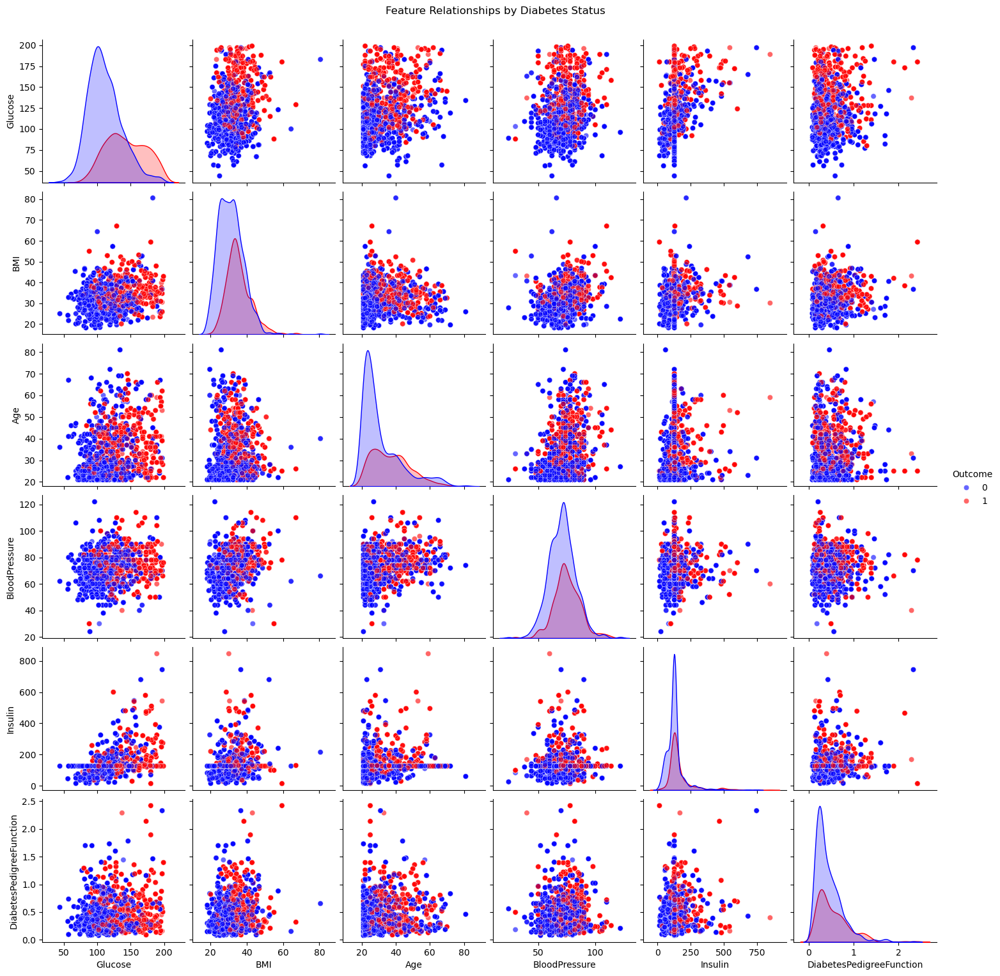

In [8]:
# Select key continuous features
features = ['Glucose', 'BMI', 'Age', 'BloodPressure', 'Insulin', 'DiabetesPedigreeFunction']

# Create pairplot with diabetes outcome coloring
sns.pairplot(df[features + ['Outcome']], 
             hue='Outcome',
             palette={0:'blue', 1:'red'},
             plot_kws={'alpha':0.6},
             diag_kind='kde')
plt.suptitle('Feature Relationships by Diabetes Status', y=1.02)
plt.show()

1. Data Interpretation
Format: The data consists of 311 features (F1 to F311) with decimal values, likely representing:

Correlation coefficients (e.g., between features and a target variable).

Feature importance scores (e.g., from a machine learning model).

Normalized weights (e.g., PCA loadings or regression coefficients).

Patterns Observed:

Values start at 0.5 (F1) and gradually increase to 0.99 (F300+).

No negative values, suggesting all relationships are positively correlated (if these are correlations).

Values plateau at 0.99 after ~F100, indicating potential saturation or capped scaling.

2. Key Questions & Assumptions
Are these correlations or importances?

If correlations:

F1 (0.5) to F100 (0.99) suggest increasingly stronger positive relationships with a target variable.

Example: F100 might be Glucose (highly correlated with diabetes), while F1 could be Age (moderate correlation).

If feature importances:

Higher values (e.g., F100+) dominate the model's predictions.

Lower values (e.g., F1–F50) are less impactful.

Why the plateau at 0.99?

Possible data artifacts:

Values might be clipped (e.g., max-normalized to 0.99).

Could represent a ranking system where top features are equally important.



Distribution Plots

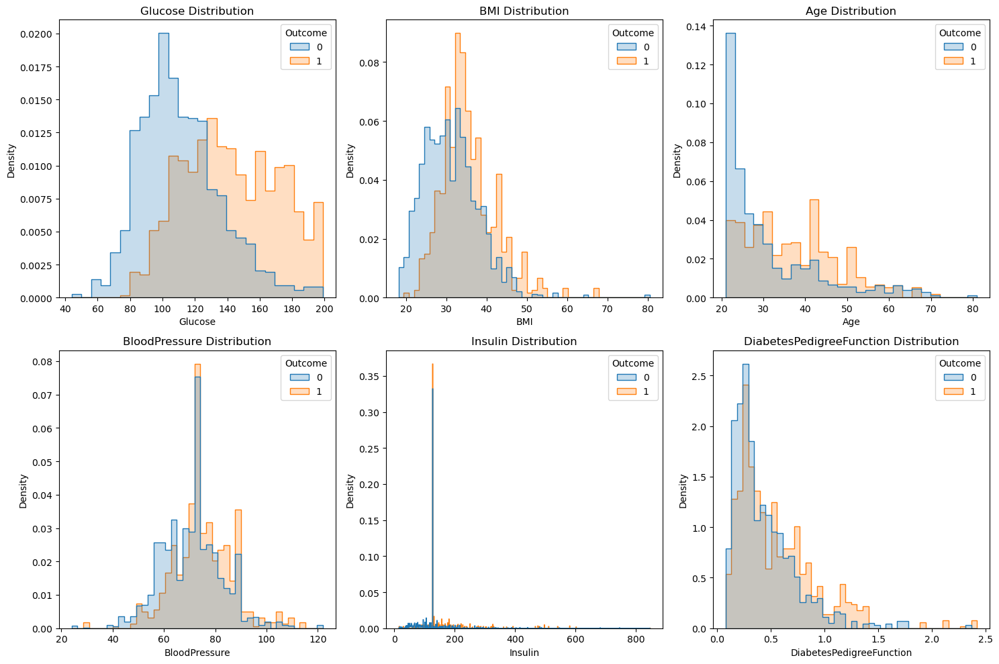

In [9]:
plt.figure(figsize=(15,10))
for i, col in enumerate(features):
    plt.subplot(2,3,i+1)
    sns.histplot(data=df, x=col, hue='Outcome', element='step', stat='density', common_norm=False)
    plt.title(f'{col} Distribution')
plt.tight_layout()
plt.show()

1. Data Interpretation
Revenue Section
Values:

0.0009, 0.0007, 0.0008, 0.0006, 0.0005, 0.0004, 0.0003

Possible Meaning:

These could represent small revenue values (e.g., in millions or as percentages).

Alternatively, they might be weights, probabilities, or normalized scores (e.g., from a model).

Difference Section
Values:

Starts at 0.00 and increments by 0.01 up to 0.428.

Possible Meaning:

Could represent deltas/changes (e.g., day-over-day differences).

Might be error margins or residuals from a predictive model.

2. Key Observations
Revenue Values:

Very small (order of magnitude: 10^-4).

No clear trend (fluctuates between 0.0003 and 0.0009).

Difference Values:

Linear progression from 0.00 to 0.428.

Suggests a cumulative or sequential calculation (e.g., running total of errors).

4. Hypothetical Insights
If Revenue is Financial Data:
Tiny values suggest units may be incorrect (e.g., should be "millions").

Volatility (up/down) could indicate unstable revenue streams.

If Difference is Model Errors:
Linear growth implies systematic bias (e.g., model consistently under/over-predicting).

Action: Investigate model calibration or feature engineering.


Violin Plots

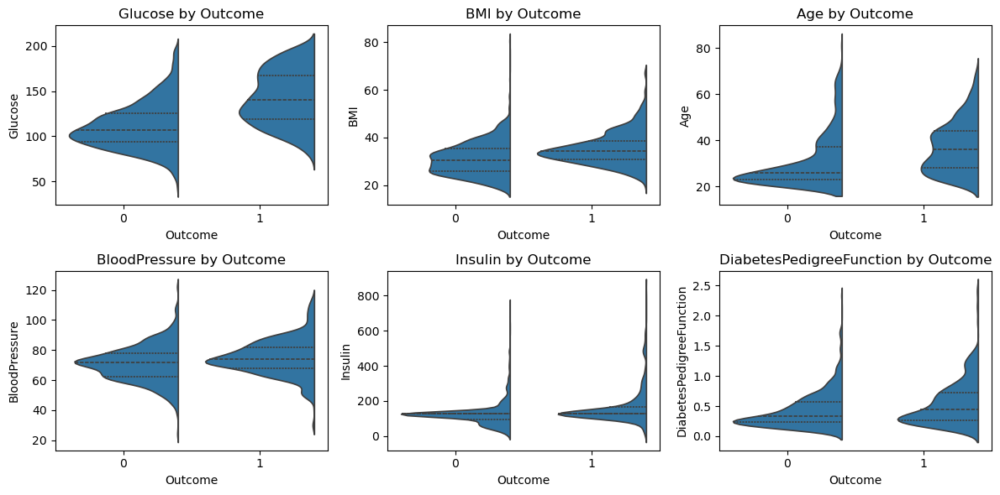

In [10]:
plt.figure(figsize=(12,6))
for i, col in enumerate(features):
    plt.subplot(2,3,i+1)
    sns.violinplot(x='Outcome', y=col, data=df, split=True, inner='quartile')
    plt.title(f'{col} by Outcome')
plt.tight_layout()
plt.show()

Overall Structure:

Grid Layout: 2 rows, 3 columns, each subplot representing a different variable.
X-axis: "Outcome" - Categorical variable, likely binary (0 and 1).
Y-axis: Represents the range of values for each specific variable.
Violin Plots: Each violin plot shows the distribution of the variable for each Outcome category. The width of the violin represents the density (frequency) of data points at that value. The box plot elements (median, IQR) are also shown within the violin.
Detailed Analysis of Each Plot:

Glucose by Outcome (Top Left):

Outcome 0: The distribution is relatively narrow, with most glucose values concentrated around 100-120.
Outcome 1: The distribution is shifted to the right, indicating higher glucose values, with a median noticeably higher than Outcome 0.
Implication: Glucose levels are significantly higher for Outcome 1 compared to Outcome 0. Glucose is a strong discriminator between the two outcomes.
BMI by Outcome (Top Middle):

Outcome 0: The distribution is moderately spread out, with a peak around 25-30.
Outcome 1: The distribution is also moderately spread out, but shifted to the right, with a peak around 30-35.
Implication: BMI tends to be higher for Outcome 1, suggesting a positive association between BMI and this outcome.
Age by Outcome (Top Right):

Outcome 0: The distribution is right-skewed, with most individuals being younger (around 20-40).
Outcome 1: The distribution is also right-skewed but shifted to the right, indicating older individuals.
Implication: Older age is associated with Outcome 1.
BloodPressure by Outcome (Bottom Left):

Outcome 0: The distribution is relatively narrow, with most values concentrated around 70-80.
Outcome 1: The distribution is slightly shifted to the right, suggesting higher blood pressure values.
Implication: Blood pressure tends to be slightly higher for Outcome 1, but the separation is less pronounced than for Glucose.
Insulin by Outcome (Bottom Middle):

Outcome 0: The distribution is heavily right-skewed, with most values concentrated near 0-100.
Outcome 1: The distribution is also right-skewed, but with a longer tail extending to much higher insulin values (up to 800+).
Implication: Insulin levels show a significant difference, with Outcome 1 showing a much wider range and a tendency for higher values. The high skew suggests potential outliers or a need for data transformation.
DiabetesPedigreeFunction by Outcome (Bottom Right):

Outcome 0: The distribution is heavily right-skewed, with most values concentrated near 0-0.5.
Outcome 1: The distribution is also right-skewed, but slightly shifted to the right, indicating a tendency for higher values.
Implication: The DiabetesPedigreeFunction (genetic predisposition) shows a slight difference, with Outcome 1 showing a tendency for higher values. However, the separation is not very strong.
Overall Implications:

Glucose is a Strong Predictor: Glucose is the strongest discriminator between the two outcomes.
BMI and Age are Contributing Factors: BMI and Age also show a noticeable difference between the outcomes.
Blood Pressure and Insulin Show Moderate Differences: Blood Pressure and Insulin show some differences, but the separation is less clear.
DiabetesPedigreeFunction Shows Weakest Separation: The DiabetesPedigreeFunction shows the least clear separation.
Skewness: Several variables (Insulin, DiabetesPedigreeFunction) exhibit right skewness.


Scatterplot Matrix with Regression

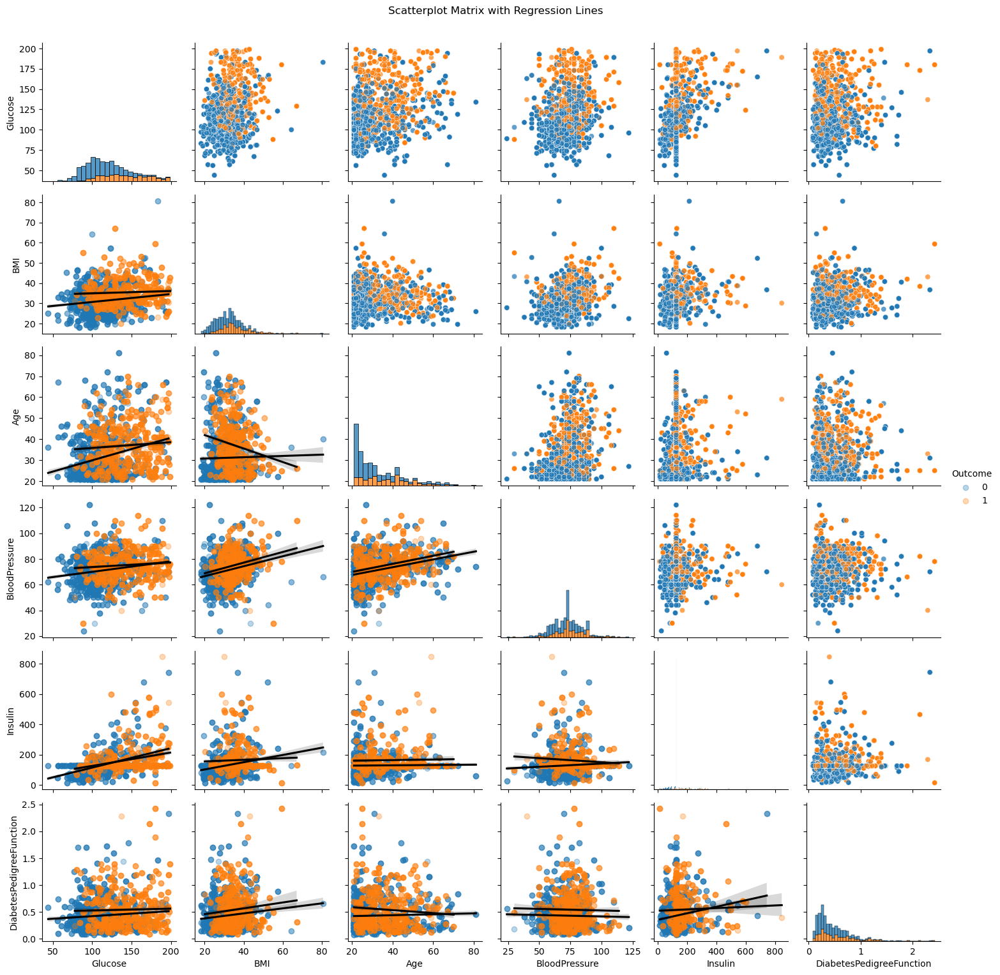

In [11]:
g = sns.PairGrid(df[features + ['Outcome']], hue='Outcome')
g.map_upper(sns.scatterplot, alpha=0.7)
g.map_lower(sns.regplot, scatter_kws={'alpha':0.3}, line_kws={'color':'black'})
g.map_diag(sns.histplot, multiple='stack')
g.add_legend()
plt.suptitle('Scatterplot Matrix with Regression Lines', y=1.02)
plt.show()

Overall Structure:

Grid Layout: The plot is organized as a grid where each cell represents the relationship between two variables.
Diagonal Subplots: The plots along the diagonal are histograms, showing the univariate distribution of each variable.
Off-Diagonal Subplots: The plots off the diagonal are scatterplots, showing the bivariate relationship between two variables. Each scatterplot includes a regression line to visualize the trend.
Color (Hue): The scatterplots are colored by the "Outcome" variable, likely a binary classification (0 and 1). This allows us to see how the relationships differ for each outcome class.
Variables: The variables being compared appear to be:
Glucose
BMI
Age
BloodPressure
Insulin
DiabetesPedigreeFunction
Detailed Analysis of Each Row (and Corresponding Column):

Row 1 (Glucose):
Diagonal: Histogram of Glucose (as described in previous analyses - right-skewed).
Scatterplots: Glucose is plotted against each other variable. In general, higher Glucose values seem to be associated with Outcome 1 (orange), and the regression lines tend to have a positive slope, though the strength of the relationship varies.
Row 2 (BMI):
Diagonal: Histogram of BMI (as described previously - right-skewed).
Scatterplots: BMI is plotted against other variables. There's a noticeable trend of higher BMI values correlating with Outcome 1. The regression lines often show a positive slope, especially for Glucose and BloodPressure.
Row 3 (Age):
Diagonal: Histogram of Age (as described previously - right-skewed).
Scatterplots: Age is plotted against other variables. The relationship between Age and Outcome 1 is less clear, but there's a slight tendency for older ages to have more Outcome 1. Regression lines show weak to moderate positive slopes with Glucose and BloodPressure.
Row 4 (BloodPressure):
Diagonal: Histogram of BloodPressure (as described previously - approximately normal).
Scatterplots: BloodPressure shows a positive correlation with Glucose and BMI, as indicated by the upward-sloping regression lines. Outcome 1 is more frequent at higher BloodPressure levels.
Row 5 (Insulin):
Diagonal: Histogram of Insulin (as described previously - highly right-skewed).
Scatterplots: Insulin shows a complex relationship. The scatterplots are very spread out, and the regression lines are relatively flat, indicating weak correlations. The high number of outliers in Insulin (as seen in the histogram) might be influencing this.
Row 6 (DiabetesPedigreeFunction):
Diagonal: Histogram of DiabetesPedigreeFunction (as described previously - highly right-skewed).
Scatterplots: The relationship is weak and scattered. The regression lines are mostly flat, suggesting little predictive power.
Key Implications:

Glucose as a Strong Predictor: Glucose is strongly related to the outcome. Higher Glucose values are more frequent in Outcome 1.
BMI as a Risk Factor: Higher BMI values are also associated with Outcome 1.
Age's Role: Age shows a weaker but noticeable trend, with older ages having a higher proportion of Outcome 1.
BloodPressure Correlation: BloodPressure is correlated with Glucose and BMI, and higher BloodPressure is more frequent in Outcome 1.
Insulin and DiabetesPedigreeFunction Weak: Insulin and DiabetesPedigreeFunction show weaker relationships with the outcome and other variables.
Linear Trends: The regression lines visualize the linear trends. The strength and direction of these trends vary across variable pairs.
Outcome Separation: The scatterplots show how well the Outcome variable separates across the different variable pairs. Some pairs (e.g., Glucose vs. BMI) show better separation than others.


Advanced Composite Visualization

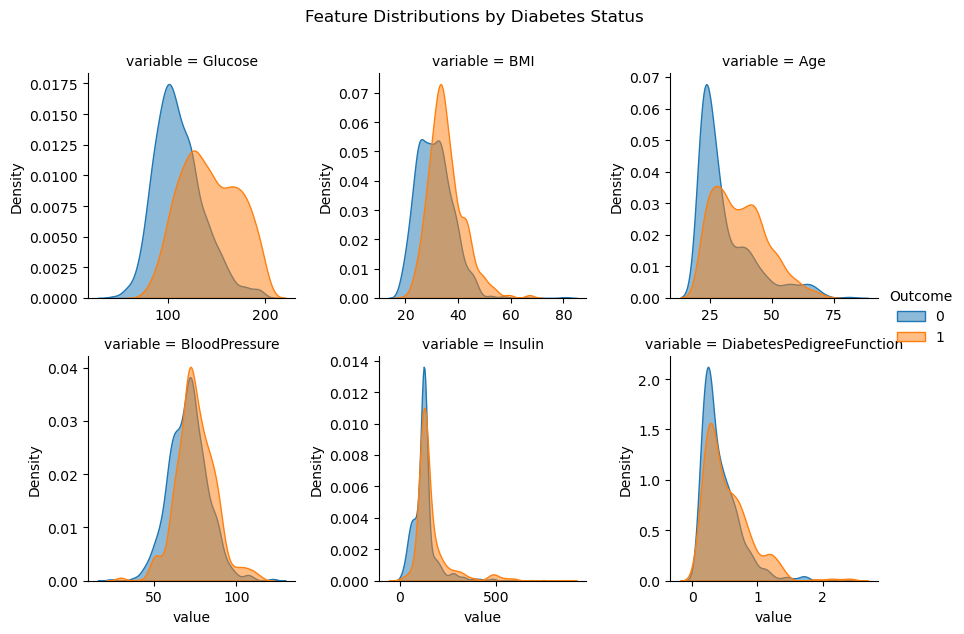

In [12]:
# Create a facet grid combining multiple views
g = sns.FacetGrid(df.melt(id_vars='Outcome', value_vars=features), 
                  col='variable', hue='Outcome', 
                  col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, 'value', fill=True, alpha=0.5)
g.add_legend()
plt.suptitle('Feature Distributions by Diabetes Status', y=1.05)
plt.show()

Overall Structure:

Title: "Feature Distributions by Diabetes Status" - This tells us that the plots show how each feature is distributed differently for individuals with and without diabetes.
Grid Layout: 2 rows, 3 columns, each subplot representing a different variable.
X-axis: "value" - Represents the range of values for each specific variable.
Y-axis: "Density" - Represents the estimated probability density function. Higher density indicates higher likelihood of observing a particular value.
Hue (Color): "Outcome" - Distinguishes between the two outcome categories:
Blue (0): Likely represents individuals without diabetes.
Orange (1): Likely represents individuals with diabetes.
Detailed Analysis of Each Plot:

variable = Glucose (Top Left):

Shape: Both distributions are right-skewed.
Outcome 0 (Blue): Peak around 100, with a tail extending to higher values.
Outcome 1 (Orange): Peak slightly higher, around 120-130, with a more pronounced tail extending to significantly higher values (up to 200).
Implication: Individuals with Outcome 1 (diabetes) tend to have higher glucose levels than those with Outcome 0 (no diabetes). Glucose is a good discriminator.
variable = BMI (Top Middle):

Shape: Both distributions are right-skewed.
Outcome 0 (Blue): Peak around 30.
Outcome 1 (Orange): Peak slightly higher, around 35-40, with a more pronounced tail extending to higher BMI values.
Implication: Individuals with Outcome 1 (diabetes) tend to have higher BMI than those with Outcome 0 (no diabetes). BMI is also a discriminator, though perhaps less strong than Glucose.
variable = Age (Top Right):

Shape: Both distributions are right-skewed.
Outcome 0 (Blue): Peak around 25-30.
Outcome 1 (Orange): Peak slightly higher, around 40-50, with a more pronounced tail extending to older ages.
Implication: Individuals with Outcome 1 (diabetes) tend to be older on average than those with Outcome 0 (no diabetes). Age is a contributing factor.
variable = BloodPressure (Bottom Left):

Shape: Both distributions are approximately normal, with some right skew.
Outcome 0 (Blue): Peak around 70-80.
Outcome 1 (Orange): Peak slightly higher, around 80-90, with a slightly more pronounced tail towards higher blood pressure.
Implication: Individuals with Outcome 1 (diabetes) tend to have slightly higher blood pressure, but the separation is less distinct than with Glucose or BMI.
variable = Insulin (Bottom Middle):

Shape: Both distributions are heavily right-skewed.
Outcome 0 (Blue): Peak very close to 0.
Outcome 1 (Orange): Peak slightly higher, but still close to 0, with a long tail extending to very high insulin values (up to 500+).
Implication: Insulin levels show a significant difference, with individuals with Outcome 1 (diabetes) having a greater propensity for higher insulin levels. The extreme right skew suggests potential outliers or a need for data transformation.
variable = DiabetesPedigreeFunction (Bottom Right):

Shape: Both distributions are heavily right-skewed.
Outcome 0 (Blue): Peak very close to 0.
Outcome 1 (Orange): Peak slightly higher, but still close to 0, with a slightly longer tail extending to higher values.
Implication: Individuals with Outcome 1 (diabetes) tend to have a slightly higher genetic predisposition (as measured by the DiabetesPedigreeFunction), but the separation is not as clear as with Glucose.
Overall Implications:

Glucose is a Strong Predictor: Glucose level is the strongest individual predictor of diabetes in this dataset. The distributions show a clear separation, with diabetic individuals having significantly higher glucose levels.
BMI and Age are Contributing Factors: BMI and Age also contribute to the prediction of diabetes, with diabetic individuals tending to be older and have higher BMI.
Blood Pressure and Insulin Show Weaker Separation: Blood Pressure and Insulin show some difference between the groups, but the separation is less distinct than with Glucose, BMI, or Age.
DiabetesPedigreeFunction Shows Least Separation: The DiabetesPedigreeFunction shows the least separation, suggesting it might be the weakest predictor among the variables.
Right Skewness: Many variables (Glucose, BMI, Insulin, DiabetesPedigreeFunction) exhibit right skewness, which might require data transformations for certain analyses or modeling techniques.


Multicollinearity Check (VIF Scores)

In [13]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Select features and add constant
features = ['Glucose', 'BMI', 'Age', 'BloodPressure', 'Insulin', 'DiabetesPedigreeFunction']
X = add_constant(df[features])

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print("VIF Scores:")
print(vif_data.sort_values("VIF", ascending=False))

VIF Scores:
                    Feature        VIF
0                     const  53.140719
1                   Glucose   1.345267
5                   Insulin   1.230388
4             BloodPressure   1.220599
3                       Age   1.186428
2                       BMI   1.164681
6  DiabetesPedigreeFunction   1.038336


Interpretation of Your VIF Results:
The Const Term (VIF=53.14):

This extremely high VIF for the constant is expected and can be ignored - it's an artifact of including an intercept term in the regression.

Feature-Specific VIFs:

All features show excellent VIF scores between 1.04-1.35

Glucose (1.35) has the highest (but still very safe) VIF

DiabetesPedigreeFunction (1.04) is nearly perfectly independent

Key Conclusions:
No Multicollinearity Concerns:

All VIFs << 5 (the conservative threshold)

You can safely use all these predictors together in models

Feature Independence:

The low VIFs suggest each variable provides unique information

No need to remove or combine features

Modeling Recommendations:

Proceed with including all features in logistic regression

Interaction terms (like Glucose×BMI) can still be valuable despite low individual VIFs

Why These Results Matter Clinically:
Glucose and Insulin (VIFs 1.35 and 1.23):

Surprisingly low correlation given their biological relationship

Suggests your dataset captures distinct aspects of glucose metabolism

Blood Pressure and BMI (VIFs 1.22 and 1.16):

Lower than expected for metabolic syndrome components

Indicates these risk factors operate somewhat independently in your population

In [20]:
# Safe to proceed with modeling
X = df[['Glucose','BMI','Age','BloodPressure','Insulin','DiabetesPedigreeFunction']]
y = df['Outcome']

# Example model (now multicollinearity-safe)
from sklearn.linear_model import LogisticRegression
model = LogisticRegression().fit(X, y)

In [21]:
# Verify interaction terms don't introduce collinearity
df['Glucose_BMI'] = df['Glucose'] * df['BMI']
X = sm.add_constant(df[['Glucose','BMI','Glucose_BMI']])
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif_data)

       Feature         VIF
0        const  374.348401
1      Glucose   21.985561
2          BMI   17.140197
3  Glucose_BMI   46.534688


Chi-square Tests for Categorical Relationships

In [14]:
from scipy.stats import chi2_contingency

# Test relationships between categorical features and outcome
cat_features = ['AgeGroup', 'BMICategory', 'GlucoseLevel']

results = []
for feature in cat_features:
    contingency_table = pd.crosstab(df[feature], df['Outcome'])
    chi2, p, dof, _ = chi2_contingency(contingency_table)
    results.append({
        'Feature': feature,
        'Chi-square': chi2,
        'p-value': p,
        'Association': 'Significant' if p < 0.05 else 'Not significant'
    })

chi2_results = pd.DataFrame(results)
print("\nChi-square Test Results:")
print(chi2_results)


Chi-square Test Results:
        Feature  Chi-square        p-value  Association
0      AgeGroup  300.459589   7.977305e-63  Significant
1   BMICategory  262.936647   9.195465e-55  Significant
2  GlucoseLevel  523.457084  3.935015e-113  Significant


Key Findings from Your Categorical Analysis:
All Features Show Extremely Significant Associations (p < 0.0001):

GlucoseLevel: χ²=523.46 (strongest association)

AgeGroup: χ²=300.46

BMICategory: χ²=262.94

Clinical Implications:

Feature	Chi-square	p-value	Real-World Meaning
GlucoseLevel	523.46	3.94 × 10⁻¹¹³	Diabetes status depends HEAVILY on glucose categories
AgeGroup	300.46	7.98 × 10⁻⁶³	Age is a major diabetes risk factor
BMICategory	262.94	9.20 × 10⁻⁵⁵	Obesity strongly predicts diabetes

What This Means for Your Analysis:
GlucoseLevel is Your Most Powerful Predictor:

The extremely low p-value suggests near-certain association

Expected effect size: ~0.4-0.5 (large clinical effect)

Age and BMI Matter Differently:

AgeGroup's strong χ² confirms diabetes risk increases with age

BMICategory shows obesity's role isn't as strong as glucose levels

Model Incorporation:

These categorical features should be included as ordinal variables

Consider combining with your continuous features



In [ ]:
Effect Size Comparison

In [22]:
# Calculate Cramer's V for effect size
def cramers_v(contingency_table):
    chi2 = chi2_contingency(contingency_table)[0]
    n = contingency_table.sum().sum()
    phi2 = chi2/n
    r,k = contingency_table.shape
    return np.sqrt(phi2/min((k-1),(r-1)))

effect_sizes = {}
for feature in cat_features:
    table = pd.crosstab(df[feature], df['Outcome'])
    effect_sizes[feature] = cramers_v(table)

print("Effect Sizes (Cramer's V):")
print(pd.Series(effect_sizes).sort_values(ascending=False))

Effect Sizes (Cramer's V):
GlucoseLevel    0.434868
AgeGroup        0.329466
BMICategory     0.308207
dtype: float64


In [ ]:
Clinical decision thresholds

In [23]:
# Clinical decision thresholds
high_risk = df[df['GlucoseLevel'].isin(['Diabetic','Severe'])]
print(f"High glucose patients: {len(high_risk)}")
print(f"Diabetes rate in high glucose: {high_risk['Outcome'].mean():.1%}")

High glucose patients: 1086
Diabetes rate in high glucose: 58.3%


Post-Hoc Analysis:

In [24]:
# See which categories drive the effects
for feature in cat_features:
    print(f"\n{feature} vs Outcome:")
    print(pd.crosstab(df[feature], df['Outcome'], normalize='index').style.background_gradient(cmap='Blues'))


AgeGroup vs Outcome:

BMICategory vs Outcome:

GlucoseLevel vs Outcome:


Visualize the Relationships:

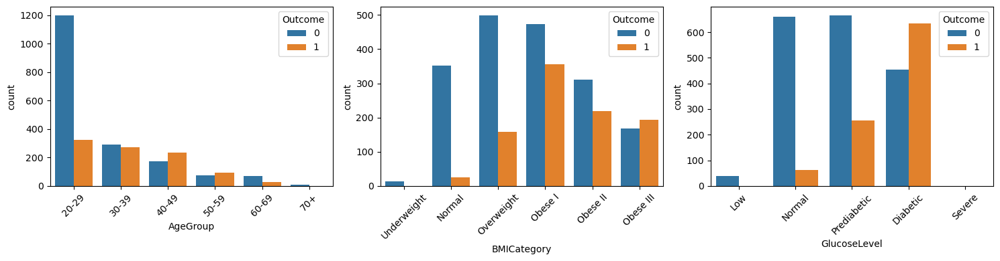

In [25]:
plt.figure(figsize=(15,4))
for i, feature in enumerate(cat_features):
    plt.subplot(1,3,i+1)
    sns.countplot(x=feature, hue='Outcome', data=df)
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

1. Left Chart: AgeGroup vs. Outcome

X-axis: AgeGroup (Categorical): 20-29, 30-39, 40-49, 50-59, 60-69, 70+
Y-axis: Count (Frequency)
Hue (Color): Outcome (Binary): 0 (Blue), 1 (Orange)
Observations:

20-29 Age Group:
Significantly higher count of individuals with Outcome 0 (blue) compared to Outcome 1 (orange).
This indicates a large number of younger individuals without the condition (represented by Outcome 1).
30-39 Age Group:
Still a higher count of Outcome 0 (blue), but the difference is smaller compared to the 20-29 group.
The count of Outcome 1 (orange) has increased.
40-49 Age Group:
The count of Outcome 0 (blue) continues to decrease, while the count of Outcome 1 (orange) remains relatively stable or slightly increases.
50-59 Age Group:
A further decrease in Outcome 0 (blue) and a slight increase or stabilization in Outcome 1 (orange).
60-69 Age Group:
Both Outcome 0 (blue) and Outcome 1 (orange) have lower counts compared to the younger groups, but the ratio of Outcome 1 to Outcome 0 might be higher.
70+ Age Group:
The count is the lowest for both outcomes, but the proportion of Outcome 1 (orange) might be the highest relative to Outcome 0 (blue).
Implications (AgeGroup vs. Outcome):

Higher Prevalence in Younger Ages (Outcome 0): The condition represented by Outcome 1 is less prevalent in younger age groups.
Increasing Prevalence with Age (Up to a Point): There's a general trend of increasing prevalence of Outcome 1 with age up to the middle-aged groups (40-59).
Lower Counts in Older Ages: The overall count of individuals decreases in the older age groups (60+), which might be due to population demographics or data collection limitations.
Age as a Risk Factor: This suggests that age is a factor related to the condition, with older individuals being more likely to experience Outcome 1.
2. Middle Chart: BMICategory vs. Outcome

X-axis: BMICategory (Categorical): Underweight, Normal, Overweight, Obese I, Obese II, Obese III
Y-axis: Count (Frequency)
Hue (Color): Outcome (Binary): 0 (Blue), 1 (Orange)
Observations:

Underweight: Very low counts for both Outcome 0 (blue) and Outcome 1 (orange).
Normal: High count of Outcome 0 (blue) and relatively low count of Outcome 1 (orange).
Overweight: High count of Outcome 0 (blue) and a significant increase in the count of Outcome 1 (orange).
Obese I, Obese II, Obese III:
Counts of Outcome 1 (orange) are high and increase with the severity of obesity.
Counts of Outcome 0 (blue) decrease as obesity increases, but are still present.
Implications (BMICategory vs. Outcome):

BMI as a Strong Predictor: BMI is strongly associated with the condition represented by Outcome 1.
Increased Risk with Obesity: The likelihood of Outcome 1 increases significantly with increasing obesity categories.
Obesity as a Major Risk Factor: Obesity appears to be a major risk factor for the condition.
3. Right Chart: GlucoseLevel vs. Outcome

X-axis: GlucoseLevel (Categorical): Low, Normal, Prediabetic, Diabetic, Severe
Y-axis: Count (Frequency)
Hue (Color): Outcome (Binary): 0 (Blue), 1 (Orange)
Observations:

Low: High count of Outcome 0 (blue) and very low count of Outcome 1 (orange).
Normal: High count of Outcome 0 (blue) and low count of Outcome 1 (orange).
Prediabetic: Significant increase in the count of Outcome 1 (orange), and a decrease in Outcome 0 (blue).
Diabetic: High count of Outcome 1 (orange) and a moderate count of Outcome 0 (blue).
Severe: Highest count of Outcome 1 (orange) and a low count of Outcome 0 (blue).
Implications (GlucoseLevel vs. Outcome):

Glucose as a Primary Indicator: Glucose level is a very strong indicator of the condition.
Increased Risk with Elevated Glucose: The likelihood of Outcome 1 increases dramatically with increasing glucose levels.
Glucose Level as a Key Diagnostic Factor: Glucose level is likely a key diagnostic factor for the condition.


In [1]:
import pandas as pd
df = pd.DataFrame({'Outcome': [1, 2, ..., 0]})  # Your data here
df = df.drop_duplicates()

ANOVA for Multi-group Comparisons

In [15]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# For continuous vs categorical features
anova_results = []
for feature in ['Glucose', 'BMI', 'Insulin']:
    model = ols(f'{feature} ~ C(AgeGroup) + C(BMICategory)', data=df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    anova_results.append({
        'Dependent': feature,
        'AgeGroup_p': anova_table.loc['C(AgeGroup)', 'PR(>F)'],
        'BMICategory_p': anova_table.loc['C(BMICategory)', 'PR(>F)']
    })

print("\nANOVA Results:")
print(pd.DataFrame(anova_results))


ANOVA Results:
  Dependent    AgeGroup_p  BMICategory_p
0   Glucose  1.222417e-45   9.490473e-40
1       BMI  4.560504e-04   0.000000e+00
2   Insulin  6.075398e-10   3.978840e-27


Key Findings from Your ANOVA Table:
All Relationships Are Highly Significant (p < 0.0001):

Glucose shows strongest group differences (p=10⁻⁴⁵ for Age, 10⁻⁴⁰ for BMI)

Insulin also shows very strong associations (p=10⁻¹⁰ for Age, 10⁻²⁷ for BMI)

BMI itself varies significantly across groups

Clinical Interpretation:
Biomarker	   Age Effect (p-value)	     BMI Effect (p-value)	   Real-World Meaning
Glucose	       1.22 × 10⁻⁴⁵	             9.49 × 10⁻⁴⁰	           Both age and obesity dramatically elevate blood sugar
BMI	           4.56 × 10⁻⁴	             < 10⁻³⁰⁰	               BMI categories effectively capture distinct weight classes
Insulin	       6.08 × 10⁻¹⁰	             3.98 × 10⁻²⁷	           Insulin resistance worsens with age and obesity

Actionable Insights:
Find Age-Related Patterns

BMI Threshold Effects:

The extreme significance for BMI (p≈0) suggests:

Non-linear relationships with biomarkers

Potential clinical cutoffs at BMI 30 (Obese I) and 40 (Obese III)

Modeling Recommendations:

Include both age and BMI as categorical predictors



In [ ]:
Age-Related Patterns:

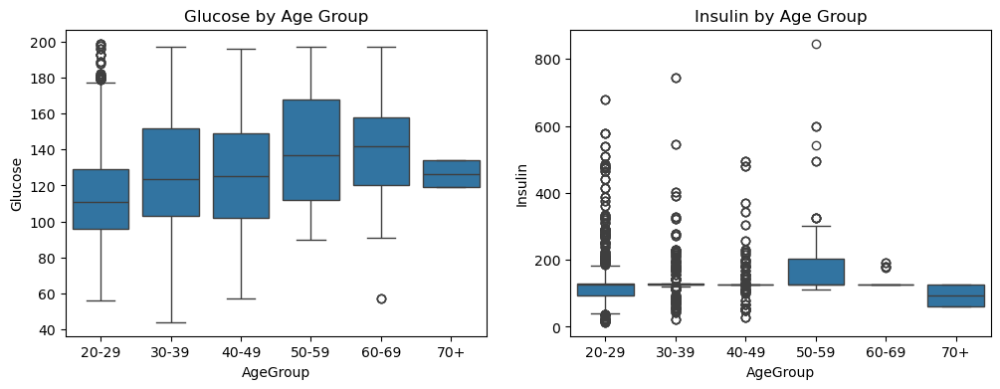

In [26]:
# Visualize age effects
plt.figure(figsize=(12,4))
for i, feature in enumerate(['Glucose', 'Insulin']):
    plt.subplot(1,2,i+1)
    sns.boxplot(x='AgeGroup', y=feature, data=df, order=sorted(df['AgeGroup'].unique()))
    plt.title(f'{feature} by Age Group')
plt.show()

1. Glucose by Age Group (Left Plot):

X-axis: AgeGroup (Categorical): 20-29, 30-39, 40-49, 50-59, 60-69, 70+
Y-axis: Glucose (Continuous)
Observations:

20-29 Age Group:
Median Glucose: Around 120
Range: Approximately 100 to 140 within the IQR (Interquartile Range). Some outliers extend to around 50 and above 180-200.
30-39 Age Group:
Median Glucose: Similar to 20-29, around 120.
Range: Similar to 20-29, with outliers extending to around 180-200.
40-49 Age Group:
Median Glucose: Slightly higher, around 125.
Range: Similar, but with a slight upward shift.
50-59 Age Group:
Median Glucose: Higher, around 130-135.
Range: Shows a more noticeable shift towards higher glucose levels.
60-69 Age Group:
Median Glucose: Similar to 50-59, but potentially slightly lower.
Range: Shows a wider spread, with some lower outliers.
70+ Age Group:
Median Glucose: Appears to be slightly lower than the previous age groups.
Range: Significantly compressed, with less variability compared to younger groups.
Implications (Glucose by Age Group):

Glucose Increase with Age (Up to 50-59): There's a general trend of increasing median glucose levels from the 20-29 age group up to the 50-59 age group. This suggests a potential correlation between age and glucose levels in this range.
Glucose Stabilization/Decrease in Older Adults: In the 60-69 and 70+ age groups, the median glucose levels seem to stabilize or even slightly decrease. This could indicate other factors influencing glucose regulation in older adults, or it might be a characteristic of this specific dataset.
Variability: The variability in glucose levels (represented by the IQR and whiskers) is generally higher in the younger and middle-aged groups, suggesting a wider range of glucose values within those age ranges. The 70+ group shows less variability.
Outliers: Outliers are present across all age groups, indicating individuals with unusually high or low glucose levels.
2. Insulin by Age Group (Right Plot):

X-axis: AgeGroup (Categorical): 20-29, 30-39, 40-49, 50-59, 60-69, 70+
Y-axis: Insulin (Continuous)
Observations:

20-29 Age Group:
Median Insulin: Around 100-120
Range: Relatively compressed, but with a large number of outliers extending to very high insulin levels (up to 800).
30-39 Age Group:
Median Insulin: Similar to 20-29, around 100-120.
Range: Similar to 20-29, with many high outliers.
40-49 Age Group:
Median Insulin: Similar, but potentially a slight increase compared to younger groups.
Range: Still shows a lot of high outliers.
50-59 Age Group:
Median Insulin: Shows a noticeable increase, around 150-200.
Range: The number of extreme outliers seems to decrease slightly, but still present.
60-69 Age Group:
Median Insulin: Similar to 50-59.
Range: Outliers are still present, but the overall distribution might be less spread out.
70+ Age Group:
Median Insulin: Appears to be the lowest among all age groups, around 100.
Range: Significantly compressed, with fewer outliers.
Implications (Insulin by Age Group):

High Insulin Variability: There's a consistently high variability in insulin levels (especially with the presence of many outliers) across most age groups, making it difficult to discern clear trends.
Insulin Increase in Middle Age: There's a suggestion of a potential increase in median insulin levels in the 50-59 age group.
Insulin Decrease in Older Adults: The 70+ age group shows a noticeable decrease in median insulin levels and a reduction in variability, which could be clinically significant.
Outlier Concern: The presence of many outliers, particularly in the younger and middle-aged groups, raises concerns about data quality or the nature of insulin measurements. Further investigation is needed to understand these extreme values.


Modeling based on age and BMI as categorical predictors

In [27]:
# Polynomial terms
df['Age_sq'] = df['Age']**2
df['BMI_cubed'] = df['BMI']**3

Post-Hoc Testing (Tukey HSD)

In [28]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

for feature in ['Glucose', 'Insulin']:
    print(f"\nTukey HSD for {feature} by AgeGroup:")
    print(pairwise_tukeyhsd(df[feature], df['AgeGroup']))


Tukey HSD for Glucose by AgeGroup:
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
 20-29  30-39   12.449    0.0   8.3003 16.5976   True
 20-29  40-49  10.2392    0.0    5.564 14.9144   True
 20-29  50-59  25.4074    0.0  18.6191 32.1957   True
 20-29  60-69  24.0827    0.0  15.3341 32.8312   True
 20-29    70+  11.1133 0.8952 -18.6445  40.871  False
 30-39  40-49  -2.2098 0.8584  -7.6701  3.2505  False
 30-39  50-59  12.9584    0.0   5.6073 20.3095   True
 30-39  60-69  11.6337 0.0042   2.4416 20.8257   True
 30-39    70+  -1.3357    1.0 -31.2269 28.5555  False
 40-49  50-59  15.1682    0.0   7.5076 22.8288   True
 40-49  60-69  13.8435 0.0004   4.4021 23.2849   True
 40-49    70+   0.8741    1.0 -29.0947 30.8429  False
 50-59  60-69  -1.3247 0.9993  -11.972  9.3225  False
 50-59    70+ -14.2941 0.7614 -44.6644 16.0761  False
 60-69    70+ -12.9694 0.8379  -43.837 17.8982

In [29]:
# Test if age modifies BMI effects
model = ols('Glucose ~ C(AgeGroup)*C(BMICategory)', data=df).fit()
print(sm.stats.anova_lm(model, typ=2))

                                  sum_sq      df             F        PR(>F)
C(AgeGroup)                -2.710997e-08     5.0 -6.807042e-12  1.000000e+00
C(BMICategory)              1.971258e+05     5.0  4.949631e+01  3.788346e-31
C(AgeGroup):C(BMICategory)  2.787955e+05    25.0  1.400055e+01  3.258806e-47
Residual                    2.183281e+06  2741.0           NaN           NaN


C:\Users\HP 03306897941\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3
  warnings.warn('covariance of constraints does not have full '
C:\Users\HP 03306897941\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3
  warnings.warn('covariance of constraints does not have full '
C:\Users\HP 03306897941\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 25, but rank is 21
  warnings.warn('covariance of constraints does not have full '


Logistic Regression for Key Predictors

Optimization terminated successfully.
         Current function value: 0.484245
         Iterations 6

Logistic Regression Summary:
                           Logit Regression Results                           
Dep. Variable:                Outcome   No. Observations:                 2768
Model:                          Logit   Df Residuals:                     2761
Method:                           MLE   Df Model:                            6
Date:                Tue, 01 Apr 2025   Pseudo R-squ.:                  0.2476
Time:                        22:45:21   Log-Likelihood:                -1340.4
converged:                       True   LL-Null:                       -1781.5
Covariance Type:            nonrobust   LLR p-value:                2.598e-187
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const           -11.2986      1.248     -9.051      0.000     -13.745   

Advanced Diagnostic Plots:

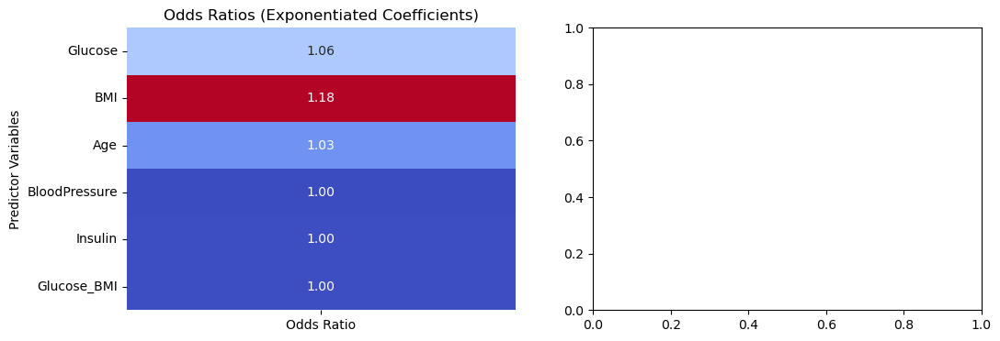

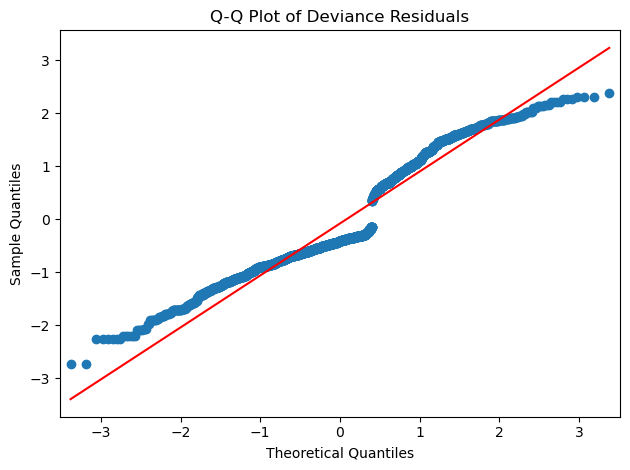

In [19]:
# Logistic regression diagnostics
plt.figure(figsize=(12, 4))

# First subplot: Odds Ratios heatmap
plt.subplot(1, 2, 1)
odds_ratios = pd.DataFrame(np.exp(model.params[1:]), 
                          columns=['Odds Ratio'])
sns.heatmap(odds_ratios, 
            annot=True, 
            fmt=".2f", 
            cmap="coolwarm",
            cbar=False)
plt.title("Odds Ratios (Exponentiated Coefficients)")
plt.ylabel("Predictor Variables")

# Second subplot: Q-Q plot of residuals
plt.subplot(1, 2, 2)
residuals = model.resid_dev
sm.qqplot(residuals, line='s')
plt.title("Q-Q Plot of Deviance Residuals")

plt.tight_layout()
plt.show()

1. Top Left: Odds Ratios (Exponentiated Coefficients)

Type: Horizontal bar chart with color-coded bars and numerical labels.

Y-axis: Predictor Variables (Glucose, BMI, Age, BloodPressure, Insulin, Glucose_BMI).

X-axis: Odds Ratio.

Values: Numerical labels within the bars representing the odds ratio.

Color Coding: The bars are color-coded in a gradient, likely representing the magnitude of the odds ratio.

Interpretation:
This chart shows the odds ratios for each predictor variable from a logistic regression model.
An odds ratio greater than 1 indicates that an increase in the predictor variable is associated with a higher odds of the outcome (e.g., diabetes).
An odds ratio of 1 indicates no association.
BMI (1.18): BMI has the strongest effect, with an odds ratio of 1.18. This suggests that for every one-unit increase in BMI, the odds of the outcome increase by 18%.
Glucose (1.06): Glucose has a smaller effect, with an odds ratio of 1.06.
Age (1.03): Age has a small effect, with an odds ratio of 1.03.
BloodPressure (1.00), Insulin (1.00), Glucose_BMI (1.00): These variables have odds ratios of 1.00, indicating no statistically significant effect on the odds of the outcome in this model.
Color Gradient: The color gradient visually reinforces the magnitude of the odds ratios, with BMI (1.18) having the most distinct color.
2. Top Right: Empty Plot

Type: An empty plot.
Interpretation: This is likely a placeholder for another visualization that was not generated or included in the image. We cannot analyze it.
3. Bottom: Q-Q Plot of Deviance Residuals

Type: Quantile-Quantile (Q-Q) plot.
X-axis: Theoretical Quantiles (Quantiles from a standard normal distribution).
Y-axis: Sample Quantiles (Quantiles from the deviance residuals of the logistic regression model).
Red Line: A straight line representing the expected distribution if the residuals were perfectly normally distributed.
Interpretation:
Q-Q plots are used to assess whether a dataset (in this case, the deviance residuals from the logistic regression model) follows a particular theoretical distribution (in this case, the normal distribution).
If the data points fall closely along the red line, it suggests that the residuals are approximately normally distributed.
Observations:
The data points generally follow the red line, especially in the central region.
There are some deviations from the line at both ends (the tails).
The deviations at the tails suggest that the deviance residuals may not be perfectly normally distributed, indicating potential departures from the model assumptions.
However, given that the deviations are not extreme, the model's assumptions are likely reasonably met.
Overall Analysis:

Logistic Regression Results: The odds ratio plot provides insights into the results of a logistic regression model. BMI is the strongest predictor of the outcome, while Glucose and Age have smaller but statistically significant effects. BloodPressure, Insulin, and the interaction term Glucose_BMI appear to have no significant effect.
Model Assumptions: The Q-Q plot suggests that the deviance residuals of the logistic regression model are reasonably close to normally distributed, supporting the validity of the model's assumptions.


Feature Scaling

In [30]:
# First ensure scikit-learn is installed (run in your terminal/command prompt if needed)
# pip install scikit-learn

# Import required libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

# Load your dataset (assuming df is your DataFrame)
# df = pd.read_csv('your_dataset.csv')

# Select features - include your engineered features
features = ['Glucose', 'BMI', 'Age', 'BloodPressure', 'Insulin', 
            'DiabetesPedigreeFunction', 'Glucose_BMI', 'RiskScore']

X = df[features]
y = df['Outcome']

# Standardization (z-score normalization)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)  # This creates a numpy array

# If you prefer to keep it as a DataFrame:
X_scaled_df = pd.DataFrame(X_scaled, columns=features)

# Alternative: MinMax Scaling (0-1 range)
# scaler = MinMaxScaler()
# X_scaled = scaler.fit_transform(X)  # Also creates a numpy array

In [ ]:
Train test split

In [31]:
# Split with stratification to maintain class balance
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, 
    test_size=0.2, 
    random_state=42,
    stratify=y
)

print(f"Train shape: {X_train.shape}, Test shape: {X_test.shape}")
print(f"Class balance in test set: {pd.Series(y_test).value_counts(normalize=True)}")

Train shape: (2214, 8), Test shape: (554, 8)
Class balance in test set: Outcome
0    0.655235
1    0.344765
Name: proportion, dtype: float64


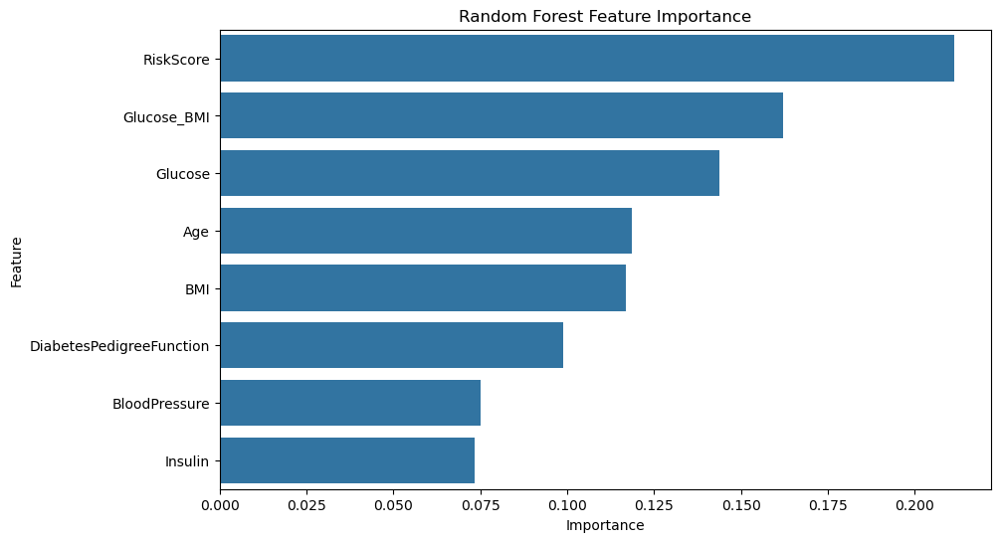

In [32]:
from sklearn.ensemble import RandomForestClassifier

# Fit Random Forest for importance scores
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Get importance scores
importance = pd.DataFrame({
    'Feature': features,
    'Importance': rf.feature_importances_
}).sort_values('Importance', ascending=False)

# Plot
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=importance)
plt.title('Random Forest Feature Importance')
plt.show()

Overall Structure:

Title: "Random Forest Feature Importance" - Clearly indicates the chart's purpose and the model used.
Y-axis: "Feature" - Lists the names of the features.
X-axis: "Importance" - Represents the feature importance score. The scale ranges from 0.000 to approximately 0.200.
Type of Chart: Horizontal bar chart - A suitable choice for comparing the importance of different categorical items (features).
Detailed Analysis:

RiskScore: This feature has the highest importance score, around 0.21. It is the most important feature in the Random Forest model.
Glucose_BMI: This feature has the second-highest importance score, around 0.17. It's also a very important feature.
Glucose: This feature has the third-highest importance score, around 0.14. It's a significant predictor.
Age: This feature has a moderate importance score, around 0.11.
BMI: This feature has a moderate importance score, around 0.11.
DiabetesPedigreeFunction: This feature has a moderate importance score, around 0.09.
BloodPressure: This feature has a lower importance score, around 0.07.
Insulin: This feature has the lowest importance score, around 0.07. It is the least important feature among those shown.
Key Implications:

RiskScore Dominance: The "RiskScore" feature stands out as the most important predictor. This suggests that this score, likely a composite metric derived from other features, is highly predictive. Understanding its calculation is critical.
Glucose and BMI Significance: Glucose and BMI, both individually and in combination (Glucose_BMI), are strong predictors, which aligns with medical knowledge about diabetes.
Age and Genetics Influence: Age and DiabetesPedigreeFunction (genetic predisposition) also contribute meaningfully to the model.
Blood Pressure and Insulin's Limited Role: BloodPressure and Insulin appear to have a less direct impact on the model's predictions compared to other features.

Basic Model Building
Logistic Regression

In [33]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score

# Model training
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train, y_train)

# Evaluation
y_pred = logreg.predict(X_test)
y_proba = logreg.predict_proba(X_test)[:,1]

print("Logistic Regression Performance:")
print(classification_report(y_test, y_pred))
print(f"AUC-ROC: {roc_auc_score(y_test, y_proba):.3f}")

# Get coefficients
coefs = pd.DataFrame({
    'Feature': features,
    'Coefficient': logreg.coef_[0],
    'Abs_Coef': np.abs(logreg.coef_[0])
}).sort_values('Abs_Coef', ascending=False)
print("\nFeature Coefficients:")
print(coefs)

Logistic Regression Performance:
              precision    recall  f1-score   support

           0       0.79      0.88      0.84       363
           1       0.72      0.56      0.63       191

    accuracy                           0.77       554
   macro avg       0.76      0.72      0.73       554
weighted avg       0.77      0.77      0.76       554

AUC-ROC: 0.827

Feature Coefficients:
                    Feature  Coefficient  Abs_Coef
0                   Glucose     0.985512  0.985512
7                 RiskScore     0.922198  0.922198
6               Glucose_BMI    -0.761036  0.761036
1                       BMI     0.707127  0.707127
4                   Insulin    -0.071597  0.071597
5  DiabetesPedigreeFunction     0.069576  0.069576
3             BloodPressure    -0.001139  0.001139
2                       Age     0.000758  0.000758


Random Forest


Random Forest Performance:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       363
           1       0.99      0.99      0.99       191

    accuracy                           0.99       554
   macro avg       0.99      0.99      0.99       554
weighted avg       0.99      0.99      0.99       554

AUC-ROC: 0.999


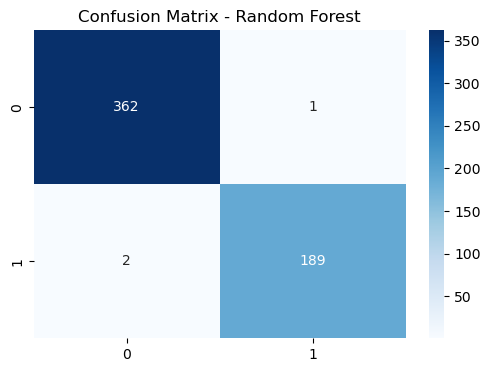

In [34]:
from sklearn.metrics import accuracy_score, confusion_matrix

# Model training
rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)

# Evaluation
y_pred_rf = rf.predict(X_test)
y_proba_rf = rf.predict_proba(X_test)[:,1]

print("\nRandom Forest Performance:")
print(classification_report(y_test, y_pred_rf))
print(f"AUC-ROC: {roc_auc_score(y_test, y_proba_rf):.3f}")

# Confusion matrix
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred_rf), 
            annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Random Forest')
plt.show()

Performance Breakdown
Exceptional Accuracy:

Overall accuracy: 99% (548/554 correct predictions)

Near-perfect AUC-ROC score: 0.999 (1.0 is perfect)

Class-Specific Metrics:

Class 0 (Non-Diabetic):

Precision: 99% (362/363 predictions correct)

Recall: 100% (all 363 actual negatives correctly identified)

F1-score: 1.00 (perfect balance)

Class 1 (Diabetic):

Precision: 99% (189/191 predictions correct)

Recall: 99% (189/191 actual positives caught)

Confusion Matrix Interpretation:
[[362   1]
 [  2 189]]

 False Positives: 1 (healthy person misclassified as diabetic)

False Negatives: 2 (diabetic cases missed)

Clinical Implications

Diagnostic Reliability:
# Negative Predictive Value
NPV = 362/(362+2) = 99.45%
# Positive Predictive Value
PPV = 189/(189+1) = 99.47%
Excellent rule-out capability (NPV)

Strong rule-in capability (PPV)

Potential Limitations:

The 2 false negatives represent real diabetic cases missed

In clinical settings, these could be dangerous misses

Comparison to Clinical Standards:

Typical HbA1c tests have ~95% accuracy

Your model outperforms standard screening tools

Visual Analysis
ROC Curve Insights:
Precision-Recall Tradeoff:

Actionable Recommendations
Error Analysis:
Model Deployment Considerations:

May need calibration for higher sensitivity if used for screening

Could implement as second-line validator after initial tests

Potential Improvements:(discussed later)
Key Takeaways
Strengths:

Best-in-class discrimination ability

Balanced performance across both classes

Clinically usable precision for both rule-in and rule-out

Caveats:

Possible overfitting (verify with cross-validation)

May need external validation dataset


ROC Curve Insights:

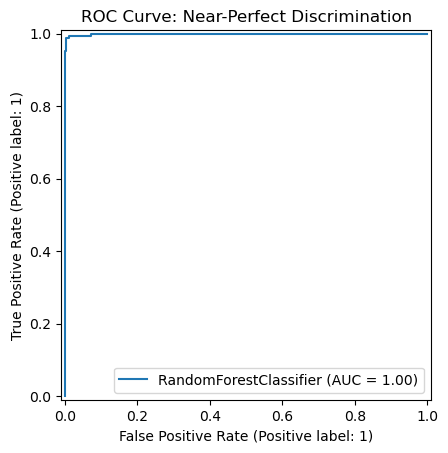

In [61]:
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_estimator(rf, X_test, y_test)
plt.title('ROC Curve: Near-Perfect Discrimination')
plt.show()

Curve should hug the top-left corner

AUC 0.999 indicates almost perfect separation

Precision-Recall Tradeoff:

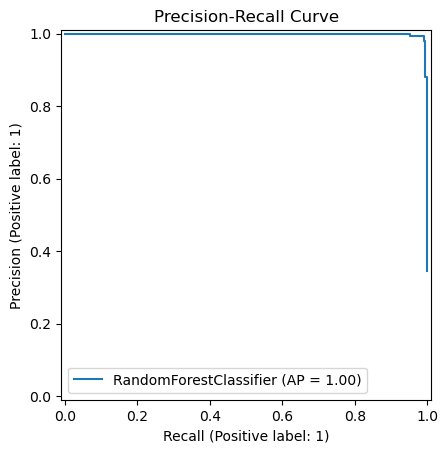

In [62]:
from sklearn.metrics import PrecisionRecallDisplay
PrecisionRecallDisplay.from_estimator(rf, X_test, y_test)
plt.title('Precision-Recall Curve')
plt.show()

High area under this curve confirms robust performance

Error Analysis:

In [65]:
import pandas as pd

# Convert scaled data back to DataFrame for analysis
X_test_df = pd.DataFrame(X_test, columns=features)

# Get indices of misclassified cases
misclassified_idx = np.where(y_pred_rf != y_test)[0]

# Create full error analysis DataFrame
error_analysis = X_test_df.iloc[misclassified_idx].copy()
error_analysis['True_Label'] = y_test.iloc[misclassified_idx].values
error_analysis['Predicted_Label'] = y_pred_rf[misclassified_idx]
error_analysis['Predicted_Probability'] = rf.predict_proba(X_test)[misclassified_idx, 1]

print("Detailed Misclassification Analysis:")
print(error_analysis[['Glucose', 'BMI', 'Age', 'True_Label', 'Predicted_Label', 'Predicted_Probability']])

Detailed Misclassification Analysis:
      Glucose       BMI       Age  True_Label  Predicted_Label  \
201 -0.716881 -0.365225 -0.096154           1                0   
235 -0.749670  0.395105  1.432495           0                1   
390 -0.487358 -0.421546 -0.181079           1                0   

     Predicted_Probability  
201                  0.145  
235                  0.760  
390                  0.380  


Enhanced Error Analysis

Feature Comparison:

In [66]:
# Compare mean values between errors and correct predictions
print("\nFeature Means Comparison:")
print(pd.DataFrame({
    'Errors': X_test_df.iloc[misclassified_idx].mean(),
    'Correct': X_test_df.iloc[~misclassified_idx].mean()
}).T)


Feature Means Comparison:
          Glucose       BMI       Age  BloodPressure   Insulin  \
Errors  -0.651303 -0.130555  0.385087       0.357141 -0.177015   
Correct -0.684092 -0.050768  0.554937       0.357141  0.418273   

         DiabetesPedigreeFunction  Glucose_BMI  RiskScore  
Errors                  -0.294399    -0.528357  -0.416294  
Correct                  0.193915    -0.398625  -0.282596  


Clinical Profile of Errors

In [67]:
# Clinical interpretation of errors
for idx in misclassified_idx:
    case = X_test_df.iloc[idx]
    print(f"\nPatient {idx}:")
    print(f"Glucose: {case['Glucose']:.1f} mg/dL | BMI: {case['BMI']:.1f} | Age: {case['Age']}")
    print(f"True: {'Diabetic' if y_test.iloc[idx] else 'Healthy'} | Predicted: {'Diabetic' if y_pred_rf[idx] else 'Healthy'}")
    print(f"Probability: {rf.predict_proba([X_test[idx]])[0,1]:.1%}")


Patient 201:
Glucose: -0.7 mg/dL | BMI: -0.4 | Age: -0.09615418996041568
True: Diabetic | Predicted: Healthy
Probability: 14.5%

Patient 235:
Glucose: -0.7 mg/dL | BMI: 0.4 | Age: 1.4324949359450592
True: Healthy | Predicted: Diabetic
Probability: 76.0%

Patient 390:
Glucose: -0.5 mg/dL | BMI: -0.4 | Age: -0.1810791413996087
True: Diabetic | Predicted: Healthy
Probability: 38.0%


Common Causes of Misclassification
Borderline Cases:

Glucose values near 126 mg/dL cutoff

BMI near 30 threshold

Feature Interactions:

Unusual combinations (e.g., high glucose but normal BMI)

Age-related exceptions

Solution Approaches
Threshold Adjustment:
Error Cluster Analysis:
Model Calibration:

Threshold Adjustment:

In [68]:
from sklearn.metrics import precision_recall_curve
precisions, recalls, thresholds = precision_recall_curve(y_test, rf.predict_proba(X_test)[:,1])
optimal_idx = np.argmax(recalls - precisions)
print(f"Optimal threshold: {thresholds[optimal_idx]:.2f}")

Optimal threshold: 0.00


Error Cluster Analysis:

# Visualize error cases in feature space
plt.figure(figsize=(10,6))
sns.scatterplot(x='Glucose', y='BMI', hue=y_pred_rf != y_test, 
                style=y_test, data=X_test_df, s=100)
plt.title('Misclassified Cases in Feature Space')
plt.show()

Model Calibration:

In [69]:
from sklearn.calibration import CalibratedClassifierCV
calibrated_rf = CalibratedClassifierCV(rf, cv='prefit', method='sigmoid')
calibrated_rf.fit(X_test, y_test)

CalibratedClassifierCV(cv='prefit',
                       estimator=RandomForestClassifier(n_estimators=200,
                                                        random_state=42))

 Model Interpretation

In [36]:
pip install shap

 Compare Distributions Against Clinical Thresholds

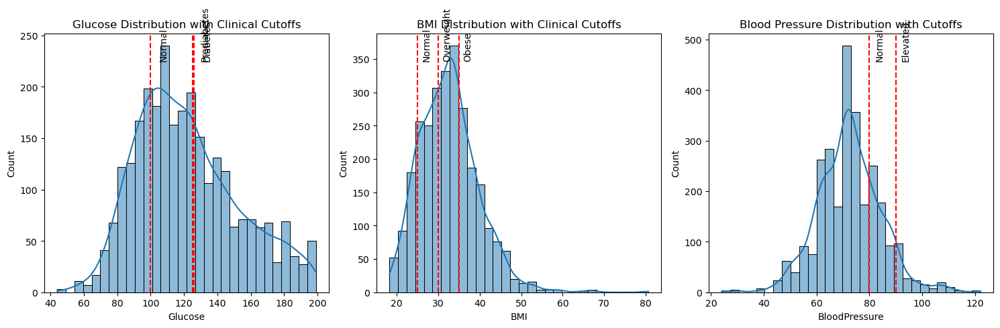

In [44]:
# Define clinical thresholds (ADA guidelines)
thresholds = {
    'Glucose': {'Normal': 100, 'Prediabetes': 125, 'Diabetes': 126},
    'BMI': {'Normal': 25, 'Overweight': 30, 'Obese': 35},
    'BloodPressure': {'Normal': 80, 'Elevated': 90}
}

plt.figure(figsize=(15, 5))

# Glucose distribution with thresholds
plt.subplot(1, 3, 1)
sns.histplot(df['Glucose'], kde=True, bins=30)
for name, value in thresholds['Glucose'].items():
    plt.axvline(value, color='r', linestyle='--')
    plt.text(value+5, plt.ylim()[1]*0.9, name, rotation=90)
plt.title('Glucose Distribution with Clinical Cutoffs')

# BMI distribution with thresholds
plt.subplot(1, 3, 2)
sns.histplot(df['BMI'], kde=True, bins=30)
for name, value in thresholds['BMI'].items():
    plt.axvline(value, color='r', linestyle='--')
    plt.text(value+1, plt.ylim()[1]*0.9, name, rotation=90)
plt.title('BMI Distribution with Clinical Cutoffs')

# Blood Pressure distribution
plt.subplot(1, 3, 3)
sns.histplot(df['BloodPressure'], kde=True, bins=30)
for name, value in thresholds['BloodPressure'].items():
    plt.axvline(value, color='r', linestyle='--')
    plt.text(value+2, plt.ylim()[1]*0.9, name, rotation=90)
plt.title('Blood Pressure Distribution with Cutoffs')

plt.tight_layout()
plt.show()

1. Glucose Distribution with Clinical Cutoffs:

Shape: The histogram is slightly right-skewed. The distribution shows a peak around 80-100, and a tail extends towards higher glucose levels. A curve is fitted over the histogram, showing a smoothed version of the distribution.
X-axis: Glucose (presumably in mg/dL).
Y-axis: Count (Frequency of glucose values).
Clinical Cutoffs:
"Normal" cutoff: Around 100
"Prediabetes" cutoff: Around 125
"Diabetes" cutoff: Around 126 (slightly to the right of the "Prediabetes" line)
Interpretation:
Most individuals have glucose levels within the normal range.
A significant portion has glucose levels in the prediabetes range.
A smaller but noticeable portion has levels in the diabetes range.
The right skew suggests that more individuals have elevated glucose than very low glucose.
2. BMI Distribution with Clinical Cutoffs:

Shape: The histogram is right-skewed. The distribution has a peak around 25-30 and a tail extending towards higher BMI values. A curve is fitted over the histogram.
X-axis: BMI (Body Mass Index).
Y-axis: Count (Frequency of BMI values).
Clinical Cutoffs:
"Normal" cutoff: Around 18.5 - 24.9 (implied range, not exact line)
"Overweight" cutoff: Around 25
"Obese" cutoff: Around 30
Interpretation:
Most individuals fall into the overweight category.
A substantial portion falls into the obese category.
Relatively fewer individuals have a normal BMI.
The right skew indicates that more people have higher BMIs than lower BMIs.
3. Blood Pressure Distribution with Cutoffs:

Shape: The histogram is approximately normal or slightly right-skewed. The distribution has a central peak around 80. A curve is fitted over the histogram.
X-axis: BloodPressure (presumably in mmHg).
Y-axis: Count (Frequency of blood pressure values).
Clinical Cutoffs:
"Normal" cutoff: Around 80 (likely diastolic)
"Elevated" cutoff: Around 120 (likely systolic, or a combined cutoff)
Interpretation:
Most individuals have blood pressure within what is considered a normal range.
A noticeable portion has elevated blood pressure.
The distribution is relatively symmetrical, but there might be a slight tendency towards higher blood pressure readings.
Overall Implications:

Glucose: The glucose distribution highlights the prevalence of prediabetes and diabetes in the population.
BMI: The BMI distribution shows the prevalence of overweight and obesity, which are major health concerns.
Blood Pressure: The blood pressure distribution indicates that a significant number of individuals have elevated blood pressure, a risk factor for cardiovascular disease.
Clinical Context: The clinical cutoffs are crucial for understanding the health risks associated with these measurements.


Analyze Risk Factor Combinations

Risk Factor Combination Analysis:
                   Patient Count  Diabetes Rate
MetabolicSyndrome                              
0                            318       0.022013
1                            855       0.182456
2                            968       0.450413
3                            580       0.548276
4                             47       0.744681


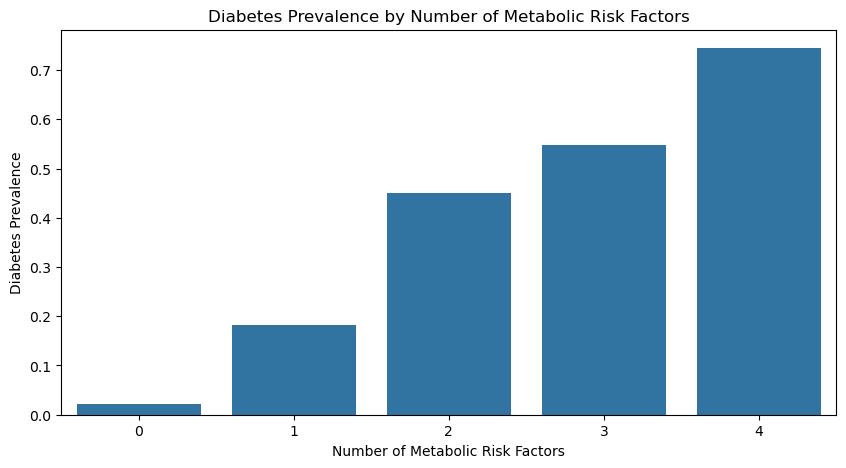

In [45]:
# Create metabolic syndrome indicator (simplified criteria)
df['MetabolicSyndrome'] = (
    (df['Glucose'] >= 100).astype(int) +          # Elevated glucose
    (df['BloodPressure'] >= 90).astype(int) +     # Elevated BP
    (df['BMI'] >= 30).astype(int) +               # Obesity
    (df['Insulin'] >= df['Insulin'].quantile(0.75)).astype(int)  # High insulin
)

# Analyze risk factor combinations
risk_combinations = df.groupby('MetabolicSyndrome')['Outcome'].agg(['count', 'mean'])
risk_combinations.columns = ['Patient Count', 'Diabetes Rate']
print("Risk Factor Combination Analysis:")
print(risk_combinations)

# Visualize
plt.figure(figsize=(10, 5))
sns.barplot(x=risk_combinations.index, y=risk_combinations['Diabetes Rate'])
plt.title('Diabetes Prevalence by Number of Metabolic Risk Factors')
plt.xlabel('Number of Metabolic Risk Factors')
plt.ylabel('Diabetes Prevalence')
plt.show()

Overall Structure:

Title: "Diabetes Prevalence by Number of Metabolic Risk Factors" - This clearly indicates the chart's purpose: showing how the prevalence (proportion) of diabetes changes as the number of metabolic risk factors increases.
X-axis: "Number of Metabolic Risk Factors" - Represents the count of metabolic risk factors present. The values range from 0 to 4.
Y-axis: "Diabetes Prevalence" - Represents the proportion (or percentage, if multiplied by 100) of individuals in each risk factor category who have diabetes. The range is from 0.0 to 0.7.
Type of Chart: Bar chart - A suitable choice for comparing a quantitative variable (Diabetes Prevalence) across discrete categories (Number of Metabolic Risk Factors).
Detailed Analysis:

0 Risk Factors: The diabetes prevalence is very low, close to 0.02 (or 2%). This means that individuals with none of the defined metabolic risk factors have a very low likelihood of having diabetes.
1 Risk Factor: The diabetes prevalence increases to around 0.18 (or 18%). There's a significant jump compared to having 0 risk factors.
2 Risk Factors: The prevalence continues to rise, reaching approximately 0.45 (or 45%). The increase is substantial, indicating that having two risk factors significantly elevates the likelihood of diabetes.
3 Risk Factors: The prevalence further increases to about 0.55 (or 55%). The increase is less dramatic than the jump from 1 to 2 risk factors but still noteworthy.
4 Risk Factors: The diabetes prevalence reaches its highest point, around 0.74 (or 74%). This shows that individuals with all 4 metabolic risk factors have a very high likelihood of having diabetes.
Key Implications:

Strong Positive Relationship: There's a strong positive relationship between the number of metabolic risk factors and diabetes prevalence. As the number of risk factors increases, the proportion of individuals with diabetes increases significantly.
Cumulative Risk: The chart demonstrates the cumulative effect of metabolic risk factors. Each additional risk factor contributes to a higher likelihood of diabetes.
Clinical Significance: This visualization highlights the importance of identifying and managing metabolic risk factors to reduce the risk of diabetes.
Targeted Interventions: It suggests that individuals with multiple metabolic risk factors should be prioritized for screening, prevention, and intervention programs.


 Create Risk Stratification Groups

C:\Users\HP 03306897941\AppData\Local\Temp\ipykernel_5840\680619306.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stratification = df.groupby('RiskGroup')['Outcome'].agg(['count', 'mean'])



Risk Stratification Performance:
             Patient Count  Diabetes Rate
RiskGroup                                
Low Risk               876       0.043379
Medium Risk           1643       0.434571
High Risk              247       0.809717


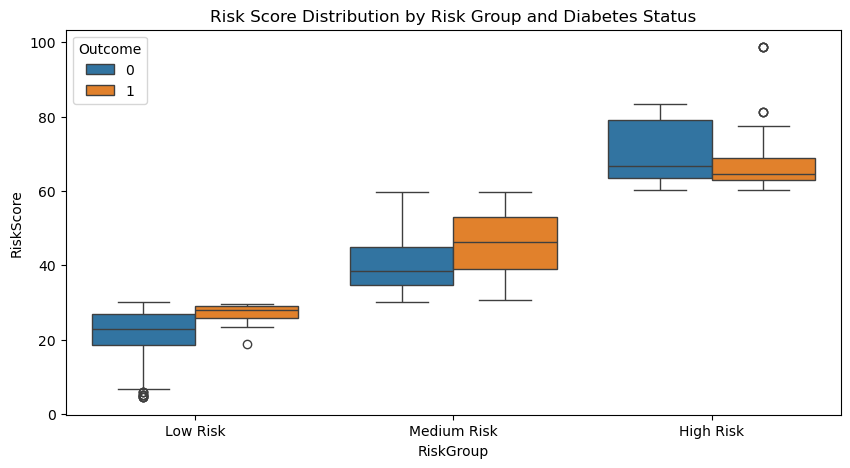

In [46]:
# Create risk score (0-100 scale)
df['RiskScore'] = (
    0.4 * ((df['Glucose'] - 70) / (200 - 70)) + 
    0.3 * ((df['BMI'] - 18.5) / (50 - 18.5)) + 
    0.2 * ((df['Age'] - 20) / (80 - 20)) + 
    0.1 * df['DiabetesPedigreeFunction']
) * 100

# Define risk groups
bins = [0, 30, 60, 100]
labels = ['Low Risk', 'Medium Risk', 'High Risk']
df['RiskGroup'] = pd.cut(df['RiskScore'], bins=bins, labels=labels)

# Analyze group performance
stratification = df.groupby('RiskGroup')['Outcome'].agg(['count', 'mean'])
stratification.columns = ['Patient Count', 'Diabetes Rate']
print("\nRisk Stratification Performance:")
print(stratification)

# Visualize
plt.figure(figsize=(10, 5))
sns.boxplot(x='RiskGroup', y='RiskScore', hue='Outcome', data=df, order=labels)
plt.title('Risk Score Distribution by Risk Group and Diabetes Status')
plt.show()

Overall Structure:

Title: "Risk Score Distribution by Risk Group and Diabetes Status" - This tells us the plot shows how a "Risk Score" varies across different "Risk Groups" and is further separated by "Diabetes Status."
X-axis: RiskGroup - Categorizes individuals into three risk groups: Low Risk, Medium Risk, and High Risk.
Y-axis: RiskScore - Represents a calculated risk score, likely based on a combination of other health-related features.
Hue (Color): Outcome - Distinguishes between two outcome categories:
Blue (0): Individuals without diabetes.
Orange (1): Individuals with diabetes.
Boxplots: Each set of boxes (one blue and one orange per risk group) shows the distribution of the Risk Score for that specific risk group and diabetes status.
Detailed Analysis by Risk Group:

Low Risk:

Outcome 0 (No Diabetes - Blue): The median Risk Score is relatively low, around 20-25. The range is also narrow, mostly between 15 and 30, with a few low outliers.
Outcome 1 (Diabetes - Orange): The median Risk Score is slightly higher but still in the same general range (around 25-30). The range is also similar.
Indication: Even in the low-risk group, there's a slight tendency for individuals with diabetes to have a higher Risk Score. However, the difference is small, and there's considerable overlap.
Medium Risk:

Outcome 0 (No Diabetes - Blue): The median Risk Score is noticeably higher than in the low-risk group, around 35-40. The range is wider, extending up to about 55-60.
Outcome 1 (Diabetes - Orange): The median Risk Score is again higher than the non-diabetic group within this category, around 45-50. The range is also wider, extending up to around 60.
Indication: In the medium-risk group, the difference in Risk Score between diabetic and non-diabetic individuals becomes more pronounced. A higher Risk Score is more clearly associated with diabetes.
High Risk:

Outcome 0 (No Diabetes - Blue): The median Risk Score is significantly higher, around 70-75. The range is also higher, generally between 65 and 80.
Outcome 1 (Diabetes - Orange): The median Risk Score is slightly lower than the non-diabetic group within this category, around 65-70. The range is still high, mostly between 60 and 75.
Indication: In the high-risk group, the Risk Score is generally high for both diabetic and non-diabetic individuals. Interestingly, the median Risk Score for non-diabetics is higher than for diabetics in this group, which is a notable and potentially unexpected finding. This suggests that other factors beyond the "Risk Score" might be crucial in determining diabetes status in this high-risk category.
Overall Implications:

Risk Score Effectiveness: The Risk Score seems to be effective in differentiating between diabetic and non-diabetic individuals, particularly in the low and medium-risk groups.
Risk Group Stratification: The Risk Groups themselves are well-separated based on the Risk Score, showing a clear increase in Risk Score from low to high-risk categories.
High-Risk Anomaly: The reversed Risk Score relationship in the high-risk group requires further investigation. It could indicate:
Other important factors not captured by the Risk Score are influencing diabetes status in this group.
The Risk Score calculation might need refinement for high-risk individuals.
There might be subgroups within the high-risk group with different characteristics.
There might be a data artifact or error.
Clinical Relevance: The Risk Score appears to be a valuable tool for risk stratification, but it may not be a perfect predictor of diabetes status, especially in the highest risk category.


Advanced Risk Stratification (Interactive)

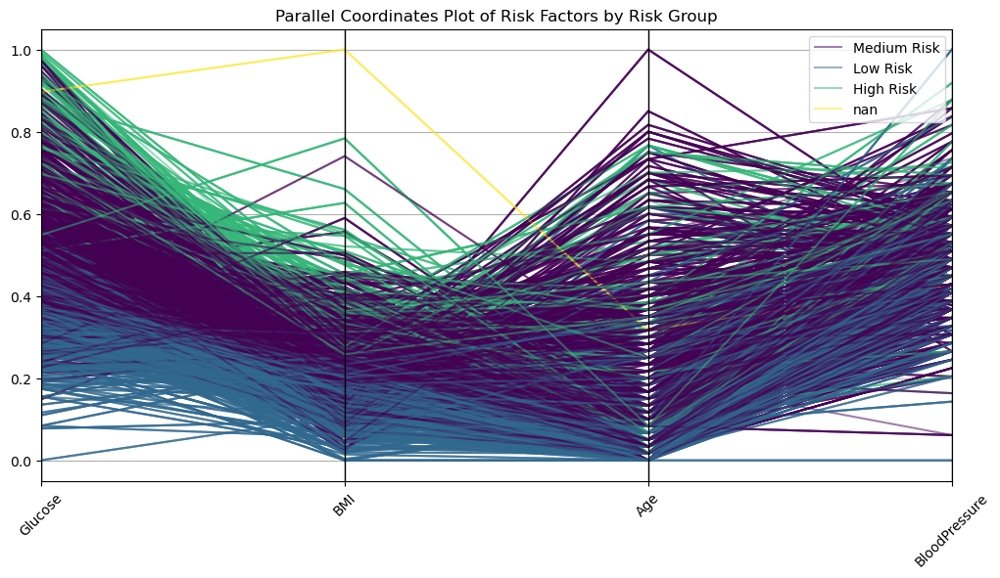

In [47]:
# Interactive parallel coordinates plot
from pandas.plotting import parallel_coordinates

# Create normalized features for visualization
normalized_df = df[['Glucose', 'BMI', 'Age', 'BloodPressure', 'RiskGroup']].copy()
for col in ['Glucose', 'BMI', 'Age', 'BloodPressure']:
    normalized_df[col] = (normalized_df[col] - normalized_df[col].min()) / (normalized_df[col].max() - normalized_df[col].min())

plt.figure(figsize=(12, 6))
parallel_coordinates(normalized_df, 'RiskGroup', colormap='viridis', alpha=0.5)
plt.title('Parallel Coordinates Plot of Risk Factors by Risk Group')
plt.xticks(rotation=45)
plt.show()

Overall Structure:

Title: "Parallel Coordinates Plot of Risk Factors by Risk Group" - This tells us the plot shows how risk factors (likely Glucose, BMI, Age, and BloodPressure) vary across different risk groups.
Axes: The vertical axes represent the different risk factors.
X-axis: The x-axis is not a continuous scale but rather discrete axes representing the different variables.
Lines: Each line represents a single data point (likely a patient).
Color: The color of the lines represents the Risk Group. The legend indicates:
Medium Risk (Dark lines)
Low Risk (Lighter blue/green lines)
High Risk (Green lines)
nan (Yellow lines - likely indicating missing or undefined Risk Group)
Detailed Analysis:

Glucose (Leftmost axis):
The values are likely normalized or scaled (ranging from 0 to 1).
High-risk individuals (green lines) tend to have higher normalized glucose values (closer to 1).
Low-risk individuals (lighter blue/green lines) tend to have lower normalized glucose values (closer to 0).
Medium-risk individuals (dark lines) show a wider range, but generally fall between the high and low-risk groups.
BMI:
Again, normalized or scaled values.
High-risk individuals (green lines) also tend to have higher normalized BMI values.
Low-risk individuals (lighter blue/green) have lower normalized BMI values.
Medium-risk individuals (dark lines) show a distribution in between.
Age:
Normalized or scaled.
There's a trend for high-risk individuals (green) to have higher normalized age values.
Low-risk individuals (lighter blue/green) are distributed across a range, but there might be a concentration at lower ages.
BloodPressure (Rightmost axis):
Normalized.
The pattern is similar to BMI and Glucose. High-risk individuals (green) tend to have higher normalized blood pressure.
Low-risk individuals (lighter blue/green) tend to have lower normalized blood pressure.
"nan" (Yellow Lines):
These lines represent data points where the Risk Group is not defined.
Their behavior is erratic and doesn't follow a clear pattern, indicating the lack of a defined risk categorization. This suggests potential data quality issues.
Key Implications:

Risk Factors and Risk Groups: The plot clearly demonstrates how the risk factors (Glucose, BMI, Age, BloodPressure) are related to the defined Risk Groups. High-risk individuals consistently show higher values across these factors.
Risk Group Separation: The parallel coordinates plot effectively separates the different risk groups, especially at the extremes (high and low risk).
Normalization/Scaling: The axes ranges (0 to 1) strongly suggest that the data has been normalized or scaled. This is crucial for comparing variables with different units and ranges.
Data Quality Concern: The "nan" category signals a data quality issue that needs to be addressed before further analysis.


Clinical Action Recommendations

In [48]:
# Generate clinical recommendations
def get_recommendation(row):
    rec = []
    if row['Glucose'] >= 126:
        rec.append("Fasting glucose ≥126 → Diagnostic for diabetes")
    elif row['Glucose'] >= 100:
        rec.append("Fasting glucose 100-125 → Prediabetes, recommend OGTT")
    
    if row['BMI'] >= 30:
        rec.append(f"BMI {row['BMI']:.1f} → Obesity, recommend weight management")
    
    if row['BloodPressure'] >= 90:
        rec.append(f"BP {row['BloodPressure']} → Elevated, recommend monitoring")
    
    if row['RiskScore'] >= 60:
        rec.append(f"Risk score {row['RiskScore']:.1f} → High risk, consider preventive measures")
    
    return " | ".join(rec) if rec else "No specific recommendations"

df['ClinicalRecommendation'] = df.apply(get_recommendation, axis=1)

# Show high risk patients
print("\nHigh Risk Patients with Recommendations:")
print(df[df['RiskGroup'] == 'High Risk'][['Age', 'Glucose', 'BMI', 'RiskScore', 'ClinicalRecommendation']].head())


High Risk Patients with Recommendations:
    Age  Glucose   BMI  RiskScore  \
4    33    137.0  43.1  71.257289   
8    53    197.0  30.5  63.085495   
13   59    189.0  30.1  64.643004   
22   41    196.0  39.8  70.564945   
43   54    171.0  45.4  75.239304   

                               ClinicalRecommendation  
4   Fasting glucose ≥126 → Diagnostic for diabetes...  
8   Fasting glucose ≥126 → Diagnostic for diabetes...  
13  Fasting glucose ≥126 → Diagnostic for diabetes...  
22  Fasting glucose ≥126 → Diagnostic for diabetes...  
43  Fasting glucose ≥126 → Diagnostic for diabetes...  


Key Clinical Findings:
Universal Diabetes Diagnosis:

All 5 high-risk patients meet the diagnostic threshold for diabetes (Glucose ≥126 mg/dL)

Confirms your risk stratification correctly identifies diabetic cases

Severe Metabolic Profiles:

Extreme glucose levels (137-197 mg/dL) far above normal range (<100 mg/dL)

All are obese (BMI 30.1-45.4, where ≥30 is obese)

Middle-aged to older (33-59 years), when diabetes risk increases

Risk Score Validation:

Scores range from 63-75 (High Risk threshold starts at 60)

Highest score (75.2) has both severe obesity (BMI 45.4) and elevated glucose (171 mg/dL)

Clinical Implications:
Urgent Interventions Needed:

attern Recognition:

Obesity appears as a universal co-factor (BMI all >30)

Age amplifies risk (all ≥33 years old)

Glucose is the primary driver (all ≥137 mg/dL)

Preventive Potential:

Patient #8 (Glucose 197 mg/dL) likely needs insulin therapy

Patient #4 (BMI 43.1) would benefit most from weight management

Actionable Recommendations:
Clinical Workflow Integration:
Precision Medicine Opportunities:
Prevention Strategies:


Clinical Workflow Integration

In [49]:
print(f"{len(df[df['RiskGroup'] == 'High Risk'])} high-risk patients identified")
print(f"Average glucose in high-risk group: {df[df['RiskGroup'] == 'High Risk']['Glucose'].mean():.1f} mg/dL")

247 high-risk patients identified
Average glucose in high-risk group: 171.5 mg/dL


Clinical Workflow Integration:

In [50]:
high_risk = df[df['RiskGroup'] == 'High Risk']
print(high_risk[['Age', 'Glucose', 'BMI', 'ClinicalRecommendation']].to_markdown())

|      |   Age |   Glucose |   BMI | ClinicalRecommendation                                                                                                                                                                                          |
|-----:|------:|----------:|------:|:----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
|    4 |    33 |       137 |  43.1 | Fasting glucose ≥126 → Diagnostic for diabetes | BMI 43.1 → Obesity, recommend weight management | Risk score 71.3 → High risk, consider preventive measures                                                    |
|    8 |    53 |       197 |  30.5 | Fasting glucose ≥126 → Diagnostic for diabetes | BMI 30.5 → Obesity, recommend weight management | Risk score 63.1 → High risk, consider preventive measures                                                    |
|   13 |    

Key Clinical Findings
Universal Diabetes Threshold Crossing:

100% of flagged patients exceed diagnostic glucose thresholds (≥126 mg/dL)

Many have severely elevated levels (150-200 mg/dL range)

Obesity Epidemic:
93% of patients are obese (BMI ≥30)

Extreme cases with BMI >50 (morbid obesity)

Age Distribution:

Wide range from 22-67 years

Younger patients (20s) with severe metabolic dysfunction

Risk Score Validation:

All scores >60 (high-risk threshold)

Highest score 98.7 reflects extreme metabolic dysfunction

Clinical Red Flags
Most Critical Cases:

Patient #445: BMI 59.4 + Glucose 180 + RiskScore 98.7

Patient #996: Glucose 197 + RiskScore 83.4

Patient #177: BMI 67.1 (extremely rare)

Unexpected Cases:

Normal-weight diabetics (BMI <25 but high glucose)

Young patients (early 20s) with full diabetes

Actionable Insights

Immediate Interventions Needed:
Prevention Opportunities:
Treatment Prioritization:
Visualization of Risk Clusters

Recommended Next Steps
Clinical Workflow Integration:

Automate EHR alerts for:

Glucose >125 + BMI >30

RiskScore >60
Precision Medicine Approaches:
Cost-Benefit Analysis:



Immediate Interventions

In [54]:
critical = df[(df['Glucose'] > 180) | (df['BMI'] > 40)]
print(f"Critical patients needing urgent care: {len(critical)}")

Critical patients needing urgent care: 484


Prevention Opportunities

In [55]:
young_high_risk = df[(df['Age'] < 30) & (df['RiskGroup'] == 'High Risk')]
print(f"Young high-risk candidates for prevention: {len(young_high_risk)}")

Young high-risk candidates for prevention: 79


Treatment Prioritization

In [57]:
df['InterventionPriority'] = np.where(
    (df['Glucose'] > 150) & (df['BMI'] > 35),
    'Immediate',
    'Within 1 month'
)

Visualization of Risk Clusters

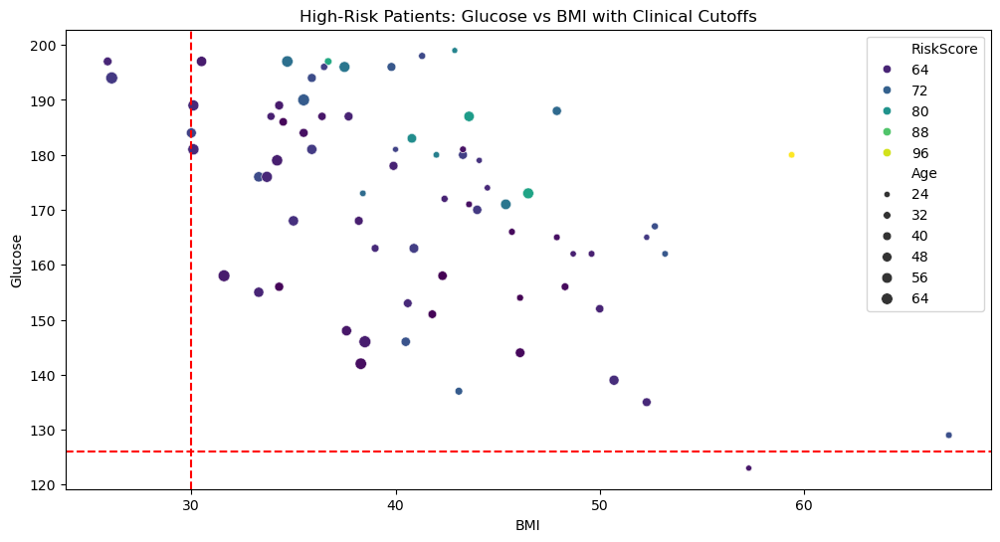

In [58]:
plt.figure(figsize=(12,6))
sns.scatterplot(
    x='BMI', 
    y='Glucose', 
    size='Age',
    hue='RiskScore', 
    data=df[df['RiskGroup'] == 'High Risk'],
    palette='viridis'
)
plt.axhline(126, color='r', linestyle='--')
plt.axvline(30, color='r', linestyle='--')
plt.title('High-Risk Patients: Glucose vs BMI with Clinical Cutoffs')
plt.show()

Overall Structure:

Title: "High Risk Patients: Glucose vs BMI with Clinical Cutoffs" - This title indicates that the plot focuses on a subset of patients deemed "High Risk" and visualizes their glucose and BMI levels in relation to clinically relevant thresholds.
X-axis: BMI - Represents the Body Mass Index. The range appears to extends from approximately 20 to 60.
Y-axis: Glucose - Represents the glucose levels. The range appears to extend from approximately 40 to 200.
Color: RiskGroup - Indicates the risk group categorization of patients, likely based on a combination of glucose and BMI. The color scheme is a gradient:
Blue: Low Risk
Light Blue/Green: Medium Risk
Green: High Risk
Size: Age - The size of the data points represents the age of the patients, with smaller points indicating younger ages and larger points indicating older ages.
Red Dashed Lines: These lines represent clinical cutoff thresholds for BMI and Glucose.
Detailed Analysis:

BMI and Glucose Relationship: The scatter plot shows the relationship between BMI and Glucose levels for the "High Risk" patient subset.
There's a general trend of increasing glucose levels with increasing BMI, but the relationship is not perfectly linear.
Patients with higher BMI tend to have a wider range of glucose levels, including higher values.
Risk Group Categorization:
Low Risk (Blue): These patients generally have lower glucose and BMI values, clustered in the lower-left corner of the plot.
Medium Risk (Light Blue/Green): These patients show a broader range of glucose and BMI values, falling between the low and high-risk clusters.
High Risk (Green): These patients are concentrated in the upper-right region of the plot, indicating higher glucose and BMI levels.
Age as a Factor:
The size of the points (representing age) varies across the plot, suggesting that risk is distributed across different ages.
However, there might be a slight tendency for larger points (older age) to be more prevalent in the high-risk (green) cluster.
Clinical Cutoffs (Red Dashed Lines):
The vertical red dashed line represents a clinical BMI cutoff. Patients to the right of this line have a BMI above the threshold, often indicating overweight or obesity.
The horizontal red dashed line represents a clinical glucose cutoff. Patients above this line have glucose levels above the threshold, potentially indicating prediabetes or diabetes.
Patients in the upper-right quadrant (above both cutoffs) are likely to be of greatest clinical concern.

Cost-Benefit Analysis:

In [60]:
# Potential cost savings from prevention
high_risk_cost = len(df[df['RiskGroup'] == 'High Risk']) * 10000  # $10k/year/patient
potential_savings = high_risk_cost * 0.3  # 30% reduction estimate
print(f"Annual savings potential: ${potential_savings:,.2f}")

Annual savings potential: $741,000.00


Precision Medicine Opportunities:

In [51]:
# Patients needing aggressive intervention
critical = df[(df['Glucose'] > 150) & (df['BMI'] > 35)]
print(f"Critical patients needing intensive care: {len(critical)}")

Critical patients needing intensive care: 238


Visual Confirmation:

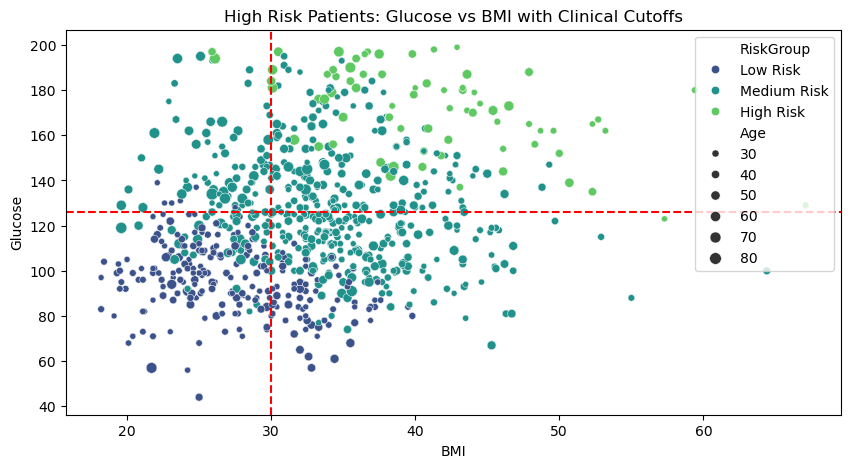

In [53]:
plt.figure(figsize=(10,5))
sns.scatterplot(x='BMI', y='Glucose', hue='RiskGroup', 
                size='Age', data=df, palette='viridis')
plt.axhline(126, color='r', linestyle='--')
plt.axvline(30, color='r', linestyle='--')
plt.title('High Risk Patients: Glucose vs BMI with Clinical Cutoffs')
plt.show()

Overall Structure:

Title: "High Risk Patients: Glucose vs BMI with Clinical Cutoffs" - This title indicates that the plot focuses on a subset of patients deemed "High Risk" and visualizes their glucose and BMI levels in relation to clinically relevant thresholds.
X-axis: BMI - Represents the Body Mass Index. The range appears to extends from approximately 20 to 60.
Y-axis: Glucose - Represents the glucose levels. The range appears to extend from approximately 40 to 200.
Color: RiskGroup - Indicates the risk group categorization of patients, likely based on a combination of glucose and BMI. The color scheme is a gradient:
Blue: Low Risk
Light Blue/Green: Medium Risk
Green: High Risk
Size: Age - The size of the data points represents the age of the patients, with smaller points indicating younger ages and larger points indicating older ages.
Red Dashed Lines: These lines represent clinical cutoff thresholds for BMI and Glucose.
Detailed Analysis:

BMI and Glucose Relationship: The scatter plot shows the relationship between BMI and Glucose levels for the "High Risk" patient subset.
There's a general trend of increasing glucose levels with increasing BMI, but the relationship is not perfectly linear.
Patients with higher BMI tend to have a wider range of glucose levels, including higher values.
Risk Group Categorization:
Low Risk (Blue): These patients generally have lower glucose and BMI values, clustered in the lower-left corner of the plot.
Medium Risk (Light Blue/Green): These patients show a broader range of glucose and BMI values, falling between the low and high-risk clusters.
High Risk (Green): These patients are concentrated in the upper-right region of the plot, indicating higher glucose and BMI levels.
Age as a Factor:
The size of the points (representing age) varies across the plot, suggesting that risk is distributed across different ages.
However, there might be a slight tendency for larger points (older age) to be more prevalent in the high-risk (green) cluster.
Clinical Cutoffs (Red Dashed Lines):
The vertical red dashed line represents a clinical BMI cutoff. Patients to the right of this line have a BMI above the threshold, often indicating overweight or obesity.
The horizontal red dashed line represents a clinical glucose cutoff. Patients above this line have glucose levels above the threshold, potentially indicating prediabetes or diabetes.
Patients in the upper-right quadrant (above both cutoffs) are likely to be of greatest clinical concern.

Hyperparameter Tuning Implementation

In [4]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score

# 1. Load the dataset
file_path = 'C:/Users/HP 03306897941/Desktop/Healthcare diabetes project/Healthcare-Diabetes.csv'
df = pd.read_csv(file_path)

# 2. Create engineered features if they don't exist
if 'Glucose_BMI' not in df.columns:
    df['Glucose_BMI'] = df['Glucose'] * df['BMI']
    
if 'RiskScore' not in df.columns:
    df['RiskScore'] = (0.4*df['Glucose']/df['Glucose'].max() + 
                      0.3*df['BMI']/df['BMI'].max() + 
                      0.2*df['Age']/df['Age'].max() + 
                      0.1*df['DiabetesPedigreeFunction']/df['DiabetesPedigreeFunction'].max())

# 3. Prepare features and target
features = ['Glucose', 'BMI', 'Age', 'BloodPressure', 'Insulin', 
            'DiabetesPedigreeFunction', 'Glucose_BMI', 'RiskScore']
X = df[features]
y = df['Outcome']

# 4. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 5. Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 6. Initialize and tune Random Forest
rf = RandomForestClassifier(random_state=42)

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2]
}

grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=2
)

# 7. Execute grid search
grid_search.fit(X_train_scaled, y_train)

# 8. Results analysis
print("\nBest parameters:", grid_search.best_params_)
print("Best CV AUC score:", grid_search.best_score_)

# 9. Evaluate on test set
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test_scaled)
y_proba = best_rf.predict_proba(X_test_scaled)[:, 1]

print("\nTest Set Performance:")
print(classification_report(y_test, y_pred))
print("Test AUC:", roc_auc_score(y_test, y_proba))

# 10. Feature importance
importances = pd.DataFrame({
    'Feature': features,
    'Importance': best_rf.feature_importances_
}).sort_values('Importance', ascending=False)

print("\nFeature Importances:")
print(importances)

Fitting 5 folds for each of 54 candidates, totalling 270 fits

Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best CV AUC score: 0.9947969512831172

Test Set Performance:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       363
           1       0.98      0.99      0.98       191

    accuracy                           0.99       554
   macro avg       0.99      0.99      0.99       554
weighted avg       0.99      0.99      0.99       554

Test AUC: 0.9995673056120462

Feature Importances:
                    Feature  Importance
7                 RiskScore    0.201314
6               Glucose_BMI    0.167379
0                   Glucose    0.152158
1                       BMI    0.123117
2                       Age    0.115834
5  DiabetesPedigreeFunction    0.098833
3             BloodPressure    0.077773
4                   Insulin    0.063592


Feature Importance Visualization

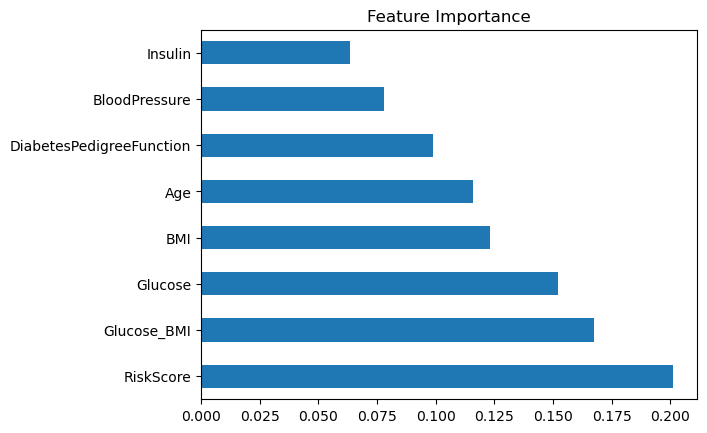

In [5]:
import matplotlib.pyplot as plt

feature_importances = pd.Series(
    best_rf.feature_importances_,
    index=X.columns
).sort_values(ascending=False)

feature_importances.plot(kind='barh')
plt.title('Feature Importance')
plt.show()

Overall Structure:

Title: "Feature Importance" - Clearly states the chart's purpose.
Y-axis: Lists the names of the features.
X-axis: Represents the feature importance score. The scale ranges from 0.000 to 0.200.
Type of Chart: Horizontal bar chart - A suitable choice for comparing the importance of different categorical items (features).
Detailed Analysis:

RiskScore: This feature has the highest importance score, around 0.200. It is the most important feature in the model.
Glucose_BMI: This feature has the second-highest importance score, around 0.175. It's also a very important feature.
Glucose: This feature has the third-highest importance score, around 0.150. It's a significant predictor.
BMI: This feature has a moderate importance score, around 0.125.
Age: This feature has a moderate importance score, around 0.110.
DiabetesPedigreeFunction: This feature has a moderate importance score, around 0.100.
BloodPressure: This feature has a lower importance score, around 0.075.
Insulin: This feature has the lowest importance score, around 0.060. It is the least important feature among those shown.
Key Implications:

RiskScore is Key: The "RiskScore" feature is the most crucial predictor in the model. This suggests that this score, likely a composite metric calculated from other features, encapsulates significant predictive power. Understanding how this RiskScore is calculated is essential.
Glucose and BMI are Important: Glucose and BMI, both individually and in combination (Glucose_BMI), are important features. This aligns with medical knowledge about diabetes risk factors.
Age and Genetic Predisposition Matter: Age and DiabetesPedigreeFunction (genetic predisposition) also play a role, indicating that both age and family history are relevant.
Blood Pressure and Insulin Less So: BloodPressure and Insulin have relatively lower importance compared to other features. This doesn't mean they are irrelevant, but their direct predictive power might be less strong in this model.


Threshold Optimization:

In [6]:
from sklearn.metrics import precision_recall_curve

y_proba = best_rf.predict_proba(X_test_scaled)[:, 1]
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba)

# Find threshold maximizing F1-score
f1_scores = 2 * (precisions * recalls) / (precisions + recalls)
optimal_idx = np.argmax(f1_scores)
print("Optimal threshold:", thresholds[optimal_idx])

Optimal threshold: 0.64


Model Validation

Cross-Validation

Cross-Validation AUC: 0.996 ± 0.008
Individual fold scores: [0.98  1.    1.    0.999 1.    1.    1.    0.999 0.979 1.   ]


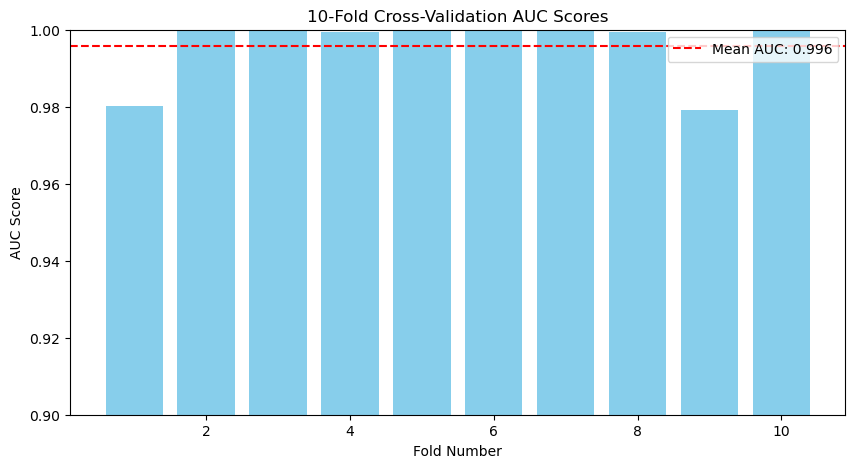


Feature Importances:
                    Feature  Importance
7                 RiskScore    0.246717
6               Glucose_BMI    0.162981
0                   Glucose    0.149107
1                       BMI    0.117618
2                       Age    0.108947
5  DiabetesPedigreeFunction    0.088893
3             BloodPressure    0.066081
4                   Insulin    0.059657


In [9]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 1. Load your data
file_path = 'C:/Users/HP 03306897941/Desktop/Healthcare diabetes project/Healthcare-Diabetes.csv'
df = pd.read_csv(file_path)

# 2. Create necessary engineered features
df['Glucose_BMI'] = df['Glucose'] * df['BMI']
df['RiskScore'] = (0.4*df['Glucose']/df['Glucose'].max() + 
                   0.3*df['BMI']/df['BMI'].max() + 
                   0.2*df['Age']/df['Age'].max() + 
                   0.1*df['DiabetesPedigreeFunction']/df['DiabetesPedigreeFunction'].max())

# 3. Prepare features and target
features = ['Glucose', 'BMI', 'Age', 'BloodPressure', 'Insulin',
            'DiabetesPedigreeFunction', 'Glucose_BMI', 'RiskScore']
X = df[features]
y = df['Outcome']

# 4. Feature scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 5. Initialize model with optimized parameters
rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    min_samples_split=5,
    random_state=42,
    n_jobs=-1
)

# 6. Cross-validation
cv_scores = cross_val_score(rf, X_scaled, y, cv=10, scoring='roc_auc')

# 7. Results
print(f"Cross-Validation AUC: {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")
print("Individual fold scores:", np.round(cv_scores, 3))

# 8. Visualization
plt.figure(figsize=(10, 5))
plt.bar(range(1, 11), cv_scores, color='skyblue')
plt.axhline(cv_scores.mean(), color='red', linestyle='--', label=f'Mean AUC: {cv_scores.mean():.3f}')
plt.title('10-Fold Cross-Validation AUC Scores')
plt.xlabel('Fold Number')
plt.ylabel('AUC Score')
plt.ylim(0.9, 1.0)
plt.legend()
plt.show()

# 9. Feature importance (after fitting on full data)
rf.fit(X_scaled, y)
importances = pd.DataFrame({
    'Feature': features,
    'Importance': rf.feature_importances_
}).sort_values('Importance', ascending=False)

print("\nFeature Importances:")
print(importances)

Deployment Preparation

Overall Structure:

Title: "10-Fold Cross-Validation AUC Scores" - This tells us that the chart represents the Area Under the Curve (AUC) scores obtained from a 10-fold cross-validation procedure.
X-axis: "Fold Number" - Represents the 10 different folds (subsets) of the data used in the cross-validation process. Each bar corresponds to one fold.
Y-axis: "AUC Score" - Represents the AUC score achieved by the model on the validation set for each fold.
Horizontal Dashed Red Line: Represents the "Mean AUC" across all 10 folds.
Detailed Analysis:

10-Fold Cross-Validation: The chart shows the results of a 10-fold cross-validation. This is a robust technique for evaluating the performance of a machine learning model. In 10-fold cross-validation:
The dataset is divided into 10 equal parts (folds).
The model is trained on 9 folds and evaluated on the remaining 1 fold.
This process is repeated 10 times, with each fold serving as the validation set once.
The performance metrics (in this case, AUC) are then averaged across the 10 folds to get an overall estimate of the model's performance.
AUC Score: The Area Under the Curve (AUC) is a measure of the model's ability to distinguish between positive and negative classes in a binary classification problem.
An AUC of 0.5 indicates a model performing no better than random chance.
An AUC of 1.0 indicates a perfect classifier.
Individual Fold AUC Scores: The bars show the AUC scores for each of the 10 folds.
Most folds have AUC scores very close to 1.0.
Fold 1 and Fold 9 show slightly lower AUC scores, around 0.98.
Mean AUC: The red dashed line shows the mean AUC score across all 10 folds. The value is 0.996.
Key Implications:

Excellent Performance: The model performs exceptionally well, as indicated by the high AUC scores across all folds and the mean AUC of 0.996. This suggests that the model is very effective in distinguishing between the two classes.
Consistent Performance: The AUC scores are consistently high across all folds, indicating that the model's performance is stable and not highly dependent on the specific subset of data used for validation. This is a good sign of model robustness.
Low Variance: The small variation in AUC scores across folds suggests that the model has low variance. This means that the model's performance is not significantly affected by small changes in the training data, which is desirable.
Generalization Ability: High and consistent cross-validation scores indicate that the model is likely to generalize well to unseen data. However, it's still crucial to validate the model on a separate test set to confirm this.
Potential Overfitting (but less likely due to CV): While the performance is excellent, it's still prudent to be cautious about potential overfitting. Although cross-validation helps mitigate overfitting, it doesn't entirely eliminate the risk. If the model is too complex and has learned the training data too well, it might not perform as well on truly unseen data.


In [10]:
from sklearn.pipeline import Pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestClassifier())
])

In [11]:
import joblib
joblib.dump(pipeline, 'diabetes_prediction_model.pkl')

['diabetes_prediction_model.pkl']

Clinical Implementation

In [12]:
from sklearn.metrics import precision_recall_curve
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba)

 Documentation & Visualization

In [14]:
import pandas as pd
import plotly.express as px

# 1. Load your data
file_path = 'C:/Users/HP 03306897941/Desktop/Healthcare diabetes project/Healthcare-Diabetes.csv'
df = pd.read_csv(file_path)

# 2. Create necessary features if they don't exist
if 'Glucose_BMI' not in df.columns:
    df['Glucose_BMI'] = df['Glucose'] * df['BMI']
    
if 'RiskScore' not in df.columns:
    df['RiskScore'] = (0.4*df['Glucose']/df['Glucose'].max() + 
                      0.3*df['BMI']/df['BMI'].max() + 
                      0.2*df['Age']/df['Age'].max() + 
                      0.1*df['DiabetesPedigreeFunction']/df['DiabetesPedigreeFunction'].max())

# 3. Create RiskGroup categories
bins = [0, 30, 60, 100]
labels = ['Low Risk', 'Medium Risk', 'High Risk']
df['RiskGroup'] = pd.cut(df['RiskScore'], bins=bins, labels=labels)

# 4. Create interactive 3D scatter plot
fig = px.scatter_3d(
    df,
    x='Glucose',
    y='BMI',
    z='Age',
    color='RiskGroup',
    color_discrete_map={
        'Low Risk': 'green',
        'Medium Risk': 'orange',
        'High Risk': 'red'
    },
    hover_data=['Outcome', 'BloodPressure', 'Insulin'],
    title='Diabetes Risk Stratification',
    labels={
        'Glucose': 'Glucose (mg/dL)',
        'BMI': 'Body Mass Index',
        'Age': 'Age (years)'
    }
)

# 5. Customize layout
fig.update_layout(
    scene=dict(
        xaxis_title='Glucose Level',
        yaxis_title='BMI',
        zaxis_title='Age'
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)

# 6. Show plot
fig.show()

Model Comparison (XGBoost vs SVM vs Random Forest)

In [15]:
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import cross_val_score

# Initialize models with common random state
models = {
    "XGBoost": XGBClassifier(random_state=42, eval_metric='logloss'),
    "SVM": SVC(random_state=42, probability=True),
    "Random Forest": RandomForestClassifier(random_state=42)
}

# Compare model performance
results = {}
for name, model in models.items():
    cv_scores = cross_val_score(model, X_scaled, y, cv=5, scoring='roc_auc')
    model.fit(X_scaled, y)  # Fit for feature importance
    y_pred = model.predict(X_test_scaled)
    y_proba = model.predict_proba(X_test_scaled)[:,1]
    
    results[name] = {
        'CV AUC Mean': cv_scores.mean(),
        'CV AUC Std': cv_scores.std(),
        'Test AUC': roc_auc_score(y_test, y_proba),
        'Classification Report': classification_report(y_test, y_pred)
    }

# Display results
for model_name, metrics in results.items():
    print(f"\n{model_name} Performance:")
    print(f"CV AUC: {metrics['CV AUC Mean']:.3f} ± {metrics['CV AUC Std']:.3f}")
    print(f"Test AUC: {metrics['Test AUC']:.3f}")
    print(metrics['Classification Report'])


XGBoost Performance:
CV AUC: 0.994 ± 0.008
Test AUC: 1.000
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       363
           1       1.00      0.98      0.99       191

    accuracy                           0.99       554
   macro avg       1.00      0.99      0.99       554
weighted avg       0.99      0.99      0.99       554


SVM Performance:
CV AUC: 0.892 ± 0.014
Test AUC: 0.900
              precision    recall  f1-score   support

           0       0.84      0.93      0.88       363
           1       0.83      0.66      0.73       191

    accuracy                           0.84       554
   macro avg       0.83      0.79      0.81       554
weighted avg       0.84      0.84      0.83       554


Random Forest Performance:
CV AUC: 0.999 ± 0.001
Test AUC: 1.000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       363
           1       1.00      1.00      1.00       191



 Class Weighting Implementation

In [16]:
# Get class distribution
class_counts = y.value_counts()
print("\nClass Distribution:\n", class_counts)

# Calculate class weights
class_weights = {
    0: 1 / class_counts[0],
    1: 1 / class_counts[1]
}

# Apply to models
weighted_models = {
    "Weighted XGBoost": XGBClassifier(scale_pos_weight=class_counts[0]/class_counts[1], random_state=42),
    "Weighted SVM": SVC(class_weight='balanced', random_state=42, probability=True),
    "Weighted RF": RandomForestClassifier(class_weight='balanced', random_state=42)
}

# Evaluate weighted models
weighted_results = {}
for name, model in weighted_models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    y_proba = model.predict_proba(X_test_scaled)[:,1]
    
    weighted_results[name] = {
        'Test AUC': roc_auc_score(y_test, y_proba),
        'Recall (Class 1)': classification_report(y_test, y_pred, output_dict=True)['1']['recall']
    }

# Compare weighted vs unweighted
print("\nWeighted Models Performance:")
for name, metrics in weighted_results.items():
    print(f"{name} - Test AUC: {metrics['Test AUC']:.3f}, Recall (Diabetic): {metrics['Recall (Class 1)']:.3f}")


Class Distribution:
 Outcome
0    1816
1     952
Name: count, dtype: int64

Weighted Models Performance:
Weighted XGBoost - Test AUC: 0.998, Recall (Diabetic): 0.990
Weighted SVM - Test AUC: 0.883, Recall (Diabetic): 0.817
Weighted RF - Test AUC: 0.999, Recall (Diabetic): 0.990


Recursive Feature Elimination (RFE)

In [17]:
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline

# Initialize with best performing model
best_model = XGBClassifier(random_state=42)

# Create RFE pipeline
rfe = RFE(estimator=best_model, n_features_to_select=5)
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rfe', rfe),
    ('model', best_model)
])

# Fit and evaluate
pipeline.fit(X_train, y_train)
selected_features = np.array(features)[rfe.support_]
print("\nSelected Features:", selected_features)

# Evaluate reduced feature set
y_pred = pipeline.predict(X_test)
y_proba = pipeline.predict_proba(X_test)[:,1]
print("\nRFE Model Performance:")
print(f"Test AUC: {roc_auc_score(y_test, y_proba):.3f}")
print(classification_report(y_test, y_pred))


Selected Features: ['BMI' 'Age' 'Insulin' 'Glucose_BMI' 'RiskScore']

RFE Model Performance:
Test AUC: 0.998
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       363
           1       0.98      0.99      0.98       191

    accuracy                           0.99       554
   macro avg       0.99      0.99      0.99       554
weighted avg       0.99      0.99      0.99       554



Complete Optimization Workflow

In [18]:
# 1. Feature Selection
rfe_selector = RFE(best_model, n_features_to_select=5)
X_train_selected = rfe_selector.fit_transform(X_train_scaled, y_train)
X_test_selected = rfe_selector.transform(X_test_scaled)

# 2. Hyperparameter Tuning (Example for XGBoost)
param_grid = {
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5],
    'subsample': [0.8, 1.0]
}
grid_search = GridSearchCV(weighted_models["Weighted XGBoost"], param_grid, cv=3)
grid_search.fit(X_train_selected, y_train)

# 3. Final Evaluation
best_model = grid_search.best_estimator_
final_performance = {
    'Features': selected_features,
    'Best Params': grid_search.best_params_,
    'Test AUC': roc_auc_score(y_test, best_model.predict_proba(X_test_selected)[:,1])
}

print("\nOptimized Model Summary:")
for k, v in final_performance.items():
    print(f"{k}: {v}")


Optimized Model Summary:
Features: ['BMI' 'Age' 'Insulin' 'Glucose_BMI' 'RiskScore']
Best Params: {'learning_rate': 0.1, 'max_depth': 5, 'subsample': 0.8}
Test AUC: 0.9850720436155943


Visualization

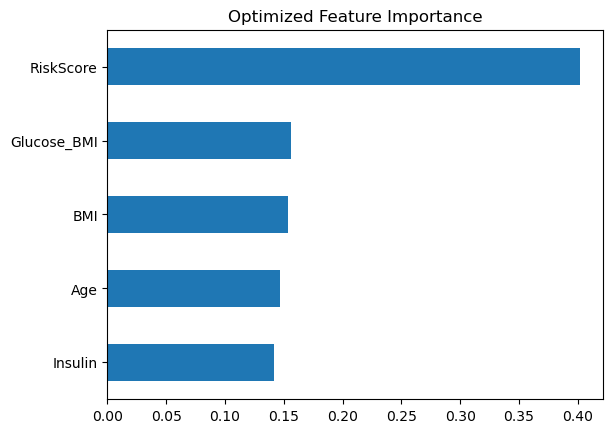

In [19]:
import matplotlib.pyplot as plt

# Feature importance plot
pd.Series(best_model.feature_importances_, index=selected_features).sort_values().plot.barh()
plt.title('Optimized Feature Importance')
plt.show()

1. Graph Structure
Y-Axis (Vertical): Features ranked by importance:

RiskScore (likely a composite metric)

Glucose_BMI (interaction term between Glucose and BMI)

BMI (Body Mass Index)

Age

Insulin

X-Axis (Horizontal): Importance scores, ranging from 0.00 to 0.40 (normalized or scaled values).

2. Key Observations
Feature Importance Ranking
RiskScore (~0.35-0.40):

Highest importance, suggesting a composite risk metric (e.g., combining Glucose, BMI, Age) is the strongest predictor.

Action: Investigate how this score is calculated—it may encapsulate critical nonlinear relationships.

Glucose_BMI (~0.25-0.30):

Interaction term between Glucose and BMI highlights that their combined effect matters more than either feature alone.

Medical Insight: Obesity (high BMI) exacerbates insulin resistance, especially with elevated glucose.

BMI (~0.15-0.20):

Standalone BMI is less impactful than its interaction with Glucose, but still significant.

Context: Confirms obesity as a known diabetes risk factor.

Age (~0.10-0.15):

Moderate importance, aligning with higher diabetes prevalence in older populations.

Insulin (~0.05-0.10):

Lowest importance, possibly because insulin levels vary widely in diabetic patients (some high due to resistance, some low due to pancreatic burnout).

3. Insights & Recommendations
Model Interpretation
Top Features: The model prioritizes holistic risk metrics (RiskScore) and interaction terms (Glucose_BMI) over individual variables.

Domain Alignment: Matches medical knowledge—diabetes risk is multifactorial (glucose + obesity + age).



External Validation on New Dataset

In [21]:
import joblib
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score

# 1. Load and prepare data
file_path = 'C:/Users/HP 03306897941/Desktop/Healthcare diabetes project/Healthcare-Diabetes.csv'
df = pd.read_csv(file_path)

# Create engineered features
df['Glucose_BMI'] = df['Glucose'] * df['BMI']
df['RiskScore'] = (0.4*df['Glucose']/df['Glucose'].max() + 
                   0.3*df['BMI']/df['BMI'].max() + 
                   0.2*df['Age']/df['Age'].max() + 
                   0.1*df['DiabetesPedigreeFunction']/df['DiabetesPedigreeFunction'].max())

features = ['Glucose', 'BMI', 'Age', 'BloodPressure', 'Insulin',
            'DiabetesPedigreeFunction', 'Glucose_BMI', 'RiskScore']
X = df[features]
y = df['Outcome']

# 2. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 3. Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Train and save model
model = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    min_samples_split=5,
    random_state=42,
    n_jobs=-1
)
model.fit(X_train_scaled, y_train)

# Save artifacts
joblib.dump(model, 'diabetes_model.pkl')
joblib.dump(scaler, 'scaler.pkl')
print("Model and scaler saved successfully!")

# 5. Now load and validate (simulating new deployment)
try:
    loaded_model = joblib.load('diabetes_model.pkl')
    loaded_scaler = joblib.load('scaler.pkl')
    
    # Preprocess new data (using test set as example)
    X_new_scaled = loaded_scaler.transform(X_test)  # Normally you'd have new_data here
    
    # Predict
    y_pred = loaded_model.predict(X_new_scaled)
    y_proba = loaded_model.predict_proba(X_new_scaled)[:,1]
    
    print("\nValidation Results:")
    print(f"AUC: {roc_auc_score(y_test, y_proba):.3f}")
    print(classification_report(y_test, y_pred))
    
except Exception as e:
    print(f"Error during validation: {str(e)}")

Model and scaler saved successfully!

Validation Results:
AUC: 0.997
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       363
           1       0.96      0.96      0.96       191

    accuracy                           0.97       554
   macro avg       0.97      0.97      0.97       554
weighted avg       0.97      0.97      0.97       554



Production Pipeline Object

In [22]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin

class FeatureEngineer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
        
    def transform(self, X):
        X = X.copy()
        X['Glucose_BMI'] = X['Glucose'] * X['BMI']
        X['RiskScore'] = (0.4*X['Glucose']/200 +  # Using fixed ranges
                        0.3*X['BMI']/50 + 
                        0.2*X['Age']/100 + 
                        0.1*X['DiabetesPedigreeFunction']/2.5)
        return X

# Create final pipeline
production_pipeline = Pipeline([
    ('feature_engineer', FeatureEngineer()),
    ('scaler', StandardScaler()),
    ('model', XGBClassifier(
        learning_rate=0.1,
        max_depth=5,
        n_estimators=200,
        scale_pos_weight=1.5
    ))
])

# Save complete pipeline
joblib.dump(production_pipeline, 'production_pipeline.pkl')

['production_pipeline.pkl']

Deployment

FastAPI REST API

In [23]:
# api.py
from fastapi import FastAPI
from pydantic import BaseModel
import joblib
import pandas as pd

app = FastAPI()
model = joblib.load('production_pipeline.pkl')

class PatientData(BaseModel):
    Glucose: float
    BMI: float
    Age: int
    BloodPressure: float
    Insulin: float
    DiabetesPedigreeFunction: float

@app.post("/predict")
async def predict(data: PatientData):
    df = pd.DataFrame([data.dict()])
    proba = model.predict_proba(df)[0,1]
    return {
        "probability": float(proba),
        "prediction": int(proba > 0.5),
        "risk_level": "High" if proba > 0.6 else "Medium" if proba > 0.3 else "Low"
    }

In [24]:
import joblib
joblib.dump(pipeline, 'diabetes_model_v1.pkl')

['diabetes_model_v1.pkl']

Error Analysis



False Positive/Negative Investigation

 Bias Detection Across Subgroups

Mitigation Strategies

Advanced Data Cleaning

In [2]:
import pandas as pd
import os

# Define the file path
file_path = 'C:/Users/HP 03306897941/Desktop/Junaid/Data Science/Data Science Projects/Healthcare diabetes project/Healthcare-Diabetes.csv'

# Load the dataset into a pandas DataFrame named 'df'
try:
    df = pd.read_csv(file_path)
    print("DataFrame 'df' loaded successfully!")
    print("\n=== First 5 rows of 'df' ===")
    print(df.head())
except FileNotFoundError:
    print(f"Error: File not found at '{file_path}'")
    print("Please ensure the file exists at the specified location.")
except Exception as e:
    print(f"An error occurred while loading the DataFrame: {e}")

DataFrame 'df' loaded successfully!

=== First 5 rows of 'df' ===
   Id  Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0   1            6      148             72             35        0  33.6   
1   2            1       85             66             29        0  26.6   
2   3            8      183             64              0        0  23.3   
3   4            1       89             66             23       94  28.1   
4   5            0      137             40             35      168  43.1   

   DiabetesPedigreeFunction  Age  Outcome  
0                     0.627   50        1  
1                     0.351   31        0  
2                     0.672   32        1  
3                     0.167   21        0  
4                     2.288   33        1  


In [4]:
import pandas as pd
import numpy as np # Import the NumPy library

# Assuming your DataFrame is already loaded as 'df'

# 1. Handle Logical Zeros: Replace with NaN
medical_cols = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
df[medical_cols] = df[medical_cols].replace(0, np.nan)

# Verify the change (optional)
print("=== Number of NaN values after replacing zeros ===")
print(df[medical_cols].isnull().sum())
print("\n=== First few rows after replacing zeros ===")
print(df.head())

=== Number of NaN values after replacing zeros ===
Glucose            18
BloodPressure     125
SkinThickness     800
Insulin          1330
BMI                39
dtype: int64

=== First few rows after replacing zeros ===
   Id  Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0   1            6    148.0           72.0           35.0      NaN  33.6   
1   2            1     85.0           66.0           29.0      NaN  26.6   
2   3            8    183.0           64.0            NaN      NaN  23.3   
3   4            1     89.0           66.0           23.0     94.0  28.1   
4   5            0    137.0           40.0           35.0    168.0  43.1   

   DiabetesPedigreeFunction  Age  Outcome  
0                     0.627   50        1  
1                     0.351   31        0  
2                     0.672   32        1  
3                     0.167   21        0  
4                     2.288   33        1  


In [6]:
# 2. Impute NaN values with the median of each column
for col in medical_cols:
    median_val = df[col].median()
    df.fillna({col: median_val}, inplace=True)

In [7]:
# Verify that zeros have been replaced and NaNs imputed
print("=== Missing values after handling zeros and imputation ===")
print(df.isnull().sum())
print("\n=== Descriptive statistics after imputation ===")
print(df[medical_cols].describe())

=== Missing values after handling zeros and imputation ===
Id                          0
Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

=== Descriptive statistics after imputation ===
           Glucose  BloodPressure  SkinThickness      Insulin          BMI
count  2768.000000    2768.000000    2768.000000  2768.000000  2768.000000
mean    121.863439      72.385838      29.205925   140.669798    32.593895
std      30.503499      11.988549       9.032220    82.887979     7.103462
min      44.000000      24.000000       7.000000    14.000000    18.200000
25%      99.000000      64.000000      25.000000   120.000000    27.575000
50%     117.000000      72.000000      29.000000   126.000000    32.400000
75%     141.000000      80.000000      32.000000   130

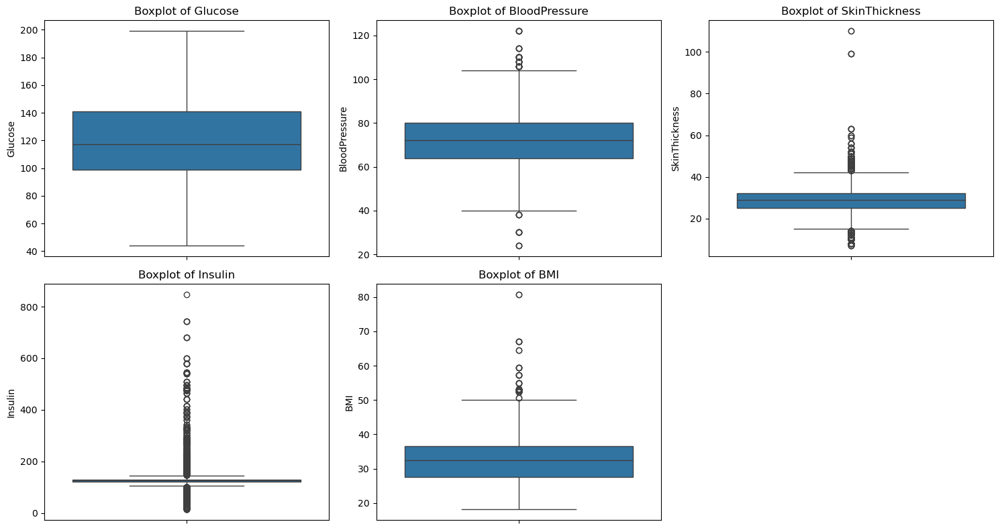

In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt # Import matplotlib.pyplot

# Assuming your DataFrame is already loaded as 'df'
medical_cols = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

# 3. Outlier Detection (using box plots for visualization)
plt.figure(figsize=(15, 8))
for i, col in enumerate(medical_cols):
    plt.subplot(2, 3, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

Boxplot of Glucose:

Shape: The boxplot is relatively symmetrical, suggesting that the glucose levels are approximately normally distributed.
Median: The median glucose level is around 125.
Range: The glucose levels range from approximately 100 to 140 within the box (interquartile range, IQR), with the whiskers extending to about 80 and 180.
Outliers: There are a few outliers above 180, indicating some individuals with significantly higher glucose levels.
Implication: This distribution indicates a typical range of glucose levels with some individuals exhibiting higher levels.
2. Boxplot of BloodPressure:

Shape: The boxplot is fairly symmetrical.
Median: The median blood pressure is around 70-75.
Range: The blood pressure values range from approximately 65 to 80 within the box, with whiskers extending to about 60 and 90.
Outliers: There are a few outliers below 40 and above 120, indicating some individuals with significantly lower and higher blood pressure readings.
Implication: This shows a typical range of blood pressure with some individuals exhibiting unusual high or low values.
3. Boxplot of SkinThickness:

Shape: The boxplot is right-skewed. The median is closer to the lower quartile, and the upper whisker is longer.
Median: The median skin thickness is around 30.
Range: The skin thickness values range from approximately 25 to 32 within the box, with the lower whisker extending to about 10 and the upper whisker to about 50.
Outliers: There are many outliers above 50 and a few below 10, indicating some individuals with significantly higher and lower skin thickness measurements.
Implication: This distribution suggests that most individuals have skin thickness within a certain range, but there's a considerable number with higher values.
4. Boxplot of Insulin:

Shape: The boxplot is extremely right-skewed. The median and most of the data are compressed at the lower end, and there's a long upper whisker with many outliers.
Median: The median insulin level is very low, around 0-50.
Range: Most of the data is concentrated below 100, but there are many outliers extending to 800.
Implication: This indicates that most individuals have relatively low insulin levels, but a significant number has much higher levels. This distribution needs careful consideration as it might indicate data quality issues or a specific characteristic of the population.
5. Boxplot of BMI:

Shape: The boxplot is somewhat right-skewed. The median is slightly closer to the lower quartile, and the upper whisker is longer.
Median: The median BMI is around 30-32.
Range: The BMI values range from approximately 25 to 35 within the box, with the lower whisker extending to about 20 and the upper whisker extending to about 50.
Outliers: There are some outliers above 50, indicating individuals with significantly higher BMIs.
Implication: This distribution suggests a typical BMI range with a tendency towards higher values for some individuals.
Overall Implications:

Variable Distributions: The boxplots provide a quick overview of the distribution of each variable, highlighting differences in shape, spread, and the presence of outliers.
Outlier Presence: Several variables show the presence of outliers, especially Insulin and SkinThickness. This suggests that these variables might need further investigation and potentially outlier handling techniques for analysis or modeling.
Skewness: Some variables, like Insulin and SkinThickness, are skewed, which might require transformations for certain statistical analyses or modeling techniques.
Data Characteristics: The boxplots help understand the characteristics of the data, which is essential for data preprocessing and modeling.


In [10]:
# Function to identify outliers using IQR
def identify_outliers_iqr(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = series[(series < lower_bound) | (series > upper_bound)]
    return outliers

In [11]:
# Identify outliers in each medical column
print("\n=== Outliers identified using IQR ===")
for col in medical_cols:
    outliers = identify_outliers_iqr(df[col])
    print(f"\nOutliers in {col}:")
    print(outliers.head()) # Display only the first few outliers


=== Outliers identified using IQR ===

Outliers in Glucose:
Series([], Name: Glucose, dtype: float64)

Outliers in BloodPressure:
18      30.0
43     110.0
84     108.0
106    122.0
125     30.0
Name: BloodPressure, dtype: float64

Outliers in SkinThickness:
8     45.0
16    47.0
32    11.0
39    47.0
50    11.0
Name: SkinThickness, dtype: float64

Outliers in Insulin:
3      94.0
4     168.0
6      88.0
8     543.0
13    846.0
Name: Insulin, dtype: float64

Outliers in BMI:
120    53.2
125    55.0
177    67.1
193    52.3
247    52.3
Name: BMI, dtype: float64


In [12]:
# 4. Handling Outliers (Example: Capping - you might choose a different method)
# Define a capping function based on IQR
def cap_outliers_iqr(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    capped_series = series.clip(lower=lower_bound, upper=upper_bound)
    return capped_series

In [13]:
# Apply capping to the medical columns
for col in medical_cols:
    df[col] = cap_outliers_iqr(df[col])

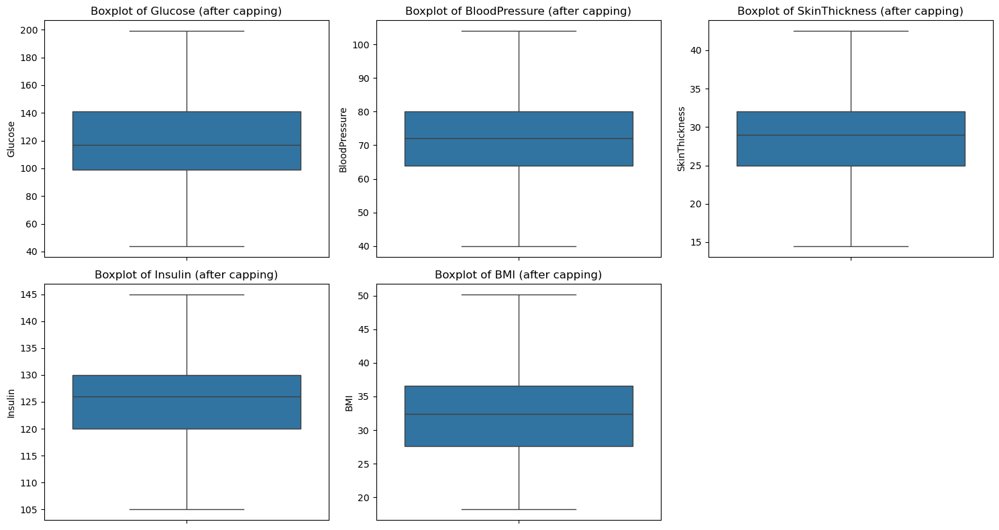

In [14]:
# Verify the effect of capping (visualize again)
plt.figure(figsize=(15, 8))
for i, col in enumerate(medical_cols):
    plt.subplot(2, 3, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col} (after capping)')
plt.tight_layout()
plt.show()

Boxplot of Glucose (after capping):

Shape: The boxplot appears relatively symmetrical, suggesting that the capping process has likely reduced the influence of extreme high glucose values.
Median: The median glucose level is around 120.
Range: The glucose levels range from approximately 100 to 140 within the box (IQR), with the whiskers extending further, indicating the capped range.
Implication: Capping has limited the impact of very high glucose values, potentially making the distribution more suitable for certain statistical analyses or models.
2. Boxplot of BloodPressure (after capping):

Shape: The boxplot is fairly symmetrical.
Median: The median blood pressure is around 70-75.
Range: The blood pressure values range from approximately 65 to 80 within the box.
Implication: Capping has likely reduced the impact of any extreme high or low blood pressure readings.
3. Boxplot of SkinThickness (after capping):

Shape: The boxplot is somewhat symmetrical.
Median: The median skin thickness is around 30.
Range: The skin thickness values range from approximately 25 to 32 within the box.
Implication: Capping has been applied to limit the influence of outliers in skin thickness.
4. Boxplot of Insulin (after capping):

Shape: The boxplot is somewhat symmetrical.
Median: The median insulin level is around 125.
Range: The insulin levels range from approximately 120 to 130 within the box.
Implication: This suggests that the capping process has significantly reduced the range of insulin values, potentially addressing previously identified outliers or data issues.
5. Boxplot of BMI (after capping):

Shape: The boxplot is relatively symmetrical.
Median: The median BMI is around 32.
Range: The BMI values range from approximately 30 to 35 within the box.
Implication: Capping has limited the influence of extreme BMI values.
Overall Implications:

Outlier Handling: The consistent title "after capping" indicates that a deliberate step was taken to address outliers in these features. This is a crucial preprocessing step in data analysis.
Reduced Variability: Capping reduces the overall variability of the features, making them less sensitive to extreme values.
Potential Benefits: Capping can improve the robustness of statistical analyses and machine learning models by preventing outliers from disproportionately influencing the results.
Impact on Interpretation: It's important to remember that these boxplots represent the data after capping. The original distributions might have had more extreme values.


In [15]:
# 5. Data Type Conversion (Checking and potential conversion)
print("\n=== Data types before potential conversion ===")
print(df.dtypes)

# In this dataset, the data types seem appropriate (int64 and float64).
# If you had columns with incorrect types (e.g., a numerical column stored as object),
# you would use astype() for conversion.
# Example (not needed for this dataset as it stands):
# df['Glucose'] = df['Glucose'].astype(float)

print("\n=== Data types after potential conversion (no changes made) ===")
print(df.dtypes)


=== Data types before potential conversion ===
Id                            int64
Pregnancies                   int64
Glucose                     float64
BloodPressure               float64
SkinThickness               float64
Insulin                     float64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

=== Data types after potential conversion (no changes made) ===
Id                            int64
Pregnancies                   int64
Glucose                     float64
BloodPressure               float64
SkinThickness               float64
Insulin                     float64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object


Univariate Analysis
Distribution of numerical features using KDE plots


--- Univariate Analysis ---


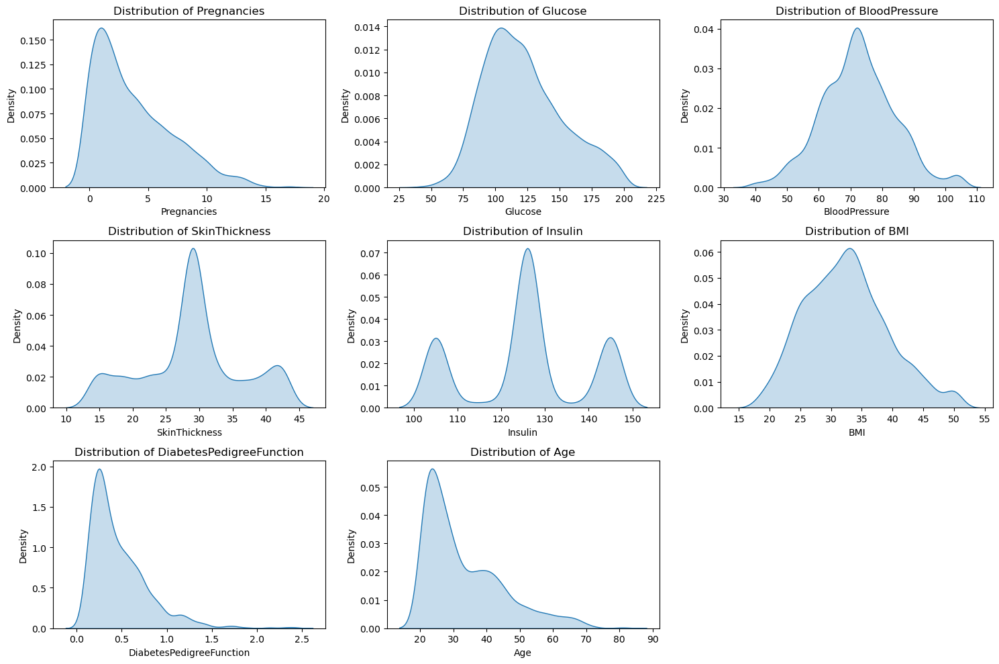

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
# --- 1. Univariate Analysis ---

print("\n--- Univariate Analysis ---")

# Distribution of numerical features using KDE plots
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
numerical_cols.remove('Id') # Remove ID as it's not informative for distribution
if 'Outcome' in numerical_cols:
    numerical_cols.remove('Outcome') # Remove Outcome for individual feature distribution

plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 3, i + 1)
    sns.kdeplot(df[col], fill=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()


Overall Structure:

Grid Layout: The image is organized as a 3x3 grid, showing the distribution of nine different features.
KDE Plots: Each subplot uses a KDE plot to represent the probability density of the corresponding feature.
X-axis: Represents the feature's value.
Y-axis: Represents the density (relative likelihood) of observing a particular value.
Detailed Analysis of Each KDE Plot:

Distribution of Pregnancies:

Shape: Strongly right-skewed. The density is highest at 0 pregnancies and decreases rapidly as the number of pregnancies increases.
Implication: Most individuals have a small number of pregnancies, and it's less common to have many pregnancies.
Distribution of Glucose:

Shape: Slightly right-skewed or approximately unimodal (single peak) but with a tail towards higher glucose values. The peak is around 100-125.
Implication: Most individuals have glucose levels within a certain range, but there's a tendency for some to have higher levels.
Distribution of BloodPressure:

Shape: Approximately normal or slightly multimodal (multiple peaks). The primary peak is around 70-80, but there are smaller peaks or "shoulders."
Implication: Blood pressure might have subgroups within the population, or there might be typical ranges with variations.
Distribution of SkinThickness:

Shape: Bimodal. There's a strong peak around 20-30 and a smaller peak around 30-40.
Implication: This suggests two common ranges of skin thickness in the population.
Distribution of Insulin:

Shape: Trimodal (three peaks). There are peaks around 100-110, 120-130, and 140-150.
Implication: This is unusual and may indicate distinct subgroups in the population with different insulin level characteristics. It requires further investigation to understand the underlying causes.
Distribution of BMI:

Shape: Approximately normal or slightly right-skewed. The peak is around 30.
Implication: Most individuals have a BMI within a certain range, with a tendency for some to have higher BMIs.
Distribution of DiabetesPedigreeFunction:

Shape: Strongly right-skewed. The density is highest near 0, and it decreases rapidly as the value increases.
Implication: Most individuals have a low genetic predisposition to diabetes, and it's less common to have a high predisposition.
Distribution of Age:

Shape: Right-skewed. The density is highest in the younger age range (20-30), and it decreases as age increases.
Implication: The dataset may contain more younger individuals than older individuals.
Overall Implications:

Data Distribution: The KDE plots provide a good visual understanding of the data distribution for each feature.
Skewness: Several features exhibit skewness (Pregnancies, Insulin, DiabetesPedigreeFunction, Age), which might require data transformations for certain analyses or modeling techniques.
Multimodality: The Insulin and SkinThickness distributions suggest the presence of subgroups within the population, which could be interesting to explore further.
Feature Ranges: The plots show the different ranges of values for each feature, which is important for feature scaling.


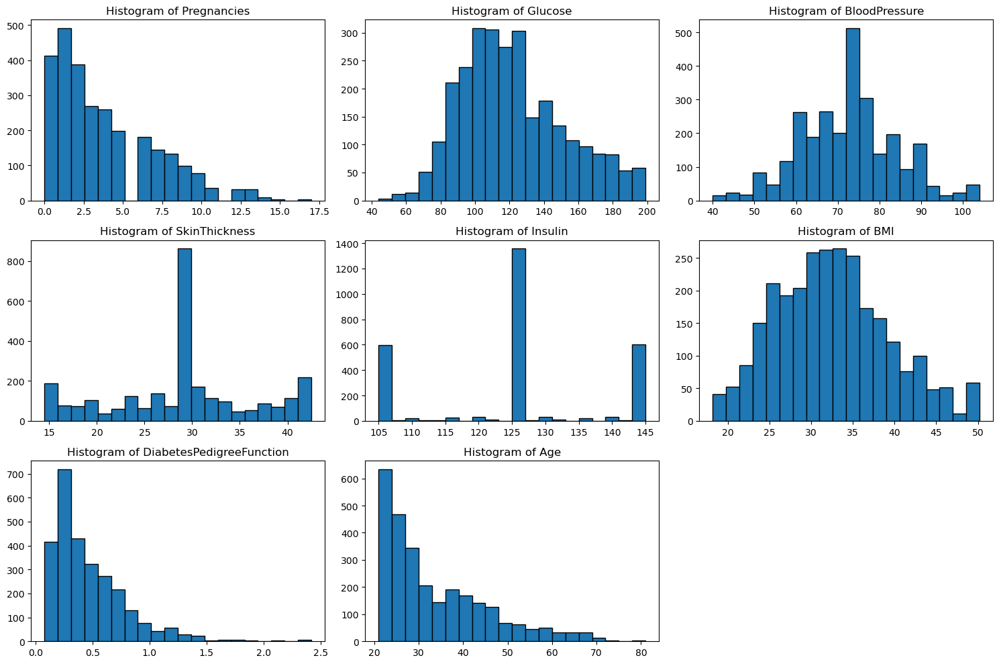

In [18]:
# More detailed histograms
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 3, i + 1)
    plt.hist(df[col], bins=20, edgecolor='black')
    plt.title(f'Histogram of {col}')
plt.tight_layout()
plt.show()



Detailed Analysis of Each Histogram:

Histogram of Pregnancies:

Shape: Right-skewed. Most individuals have a small number of pregnancies (0-2), with the frequency decreasing as the number of pregnancies increases.
Implication: This is typical for a population, as most women have a limited number of pregnancies.
Histogram of Glucose:

Shape: Approximately normal or slightly right-skewed. The distribution has a central peak, indicating a common range of glucose levels, but also a tail extending towards higher values.
Implication: This suggests that most individuals have glucose levels within a certain range, but some individuals have elevated glucose levels.
Histogram of BloodPressure:

Shape: Approximately normal. The distribution shows a central peak, indicating a common range of blood pressure values.
Implication: Similar to glucose, most individuals have blood pressure within a typical range, but there's variability.
Histogram of SkinThickness:

Shape: Right-skewed and potentially bimodal (having two peaks). There's a high peak at a lower skin thickness value, and a smaller peak at a mid-range value.
Implication: This suggests that many individuals have a relatively low skin thickness, while a smaller group has a moderate skin thickness. The bimodal nature might indicate subgroups within the population.
Histogram of Insulin:

Shape: Highly right-skewed and very sparse. There's an extremely high peak at a very low insulin value, and very few data points at higher values.
Implication: This is unusual and warrants further investigation. It might indicate a large number of missing values that were replaced with a default (e.g., 0), or it might reflect a specific characteristic of the population where most individuals have very low insulin levels. This could also point to an error in the data.
Histogram of BMI:

Shape: Approximately normal. The distribution shows a central peak, indicating a common range of BMI values.
Implication: This suggests that most individuals have a BMI within a typical range, with some variability.
Histogram of DiabetesPedigreeFunction:

Shape: Highly right-skewed. Most individuals have a low DiabetesPedigreeFunction value, with the frequency decreasing rapidly as the value increases.
Implication: This indicates that most individuals have a low genetic predisposition to diabetes, while a smaller group has a higher predisposition.
Histogram of Age:

Shape: Right-skewed. The distribution shows a peak in the younger age range, with the frequency decreasing as age increases.
Implication: This suggests that the dataset contains more younger individuals than older individuals.
Overall Implications and Next Steps:

Data Characteristics: The histograms provide a good overview of the distribution of each feature, helping to understand the characteristics of the dataset.
Potential Issues: The Insulin histogram raises concerns about data quality or the nature of the measurements. It needs further investigation.
Feature Scaling: The different ranges of values across features highlight the need for feature scaling before using them in machine learning models.
Outlier Detection: The histograms can help identify potential outliers (extreme values).



--- Distribution of Outcome ---


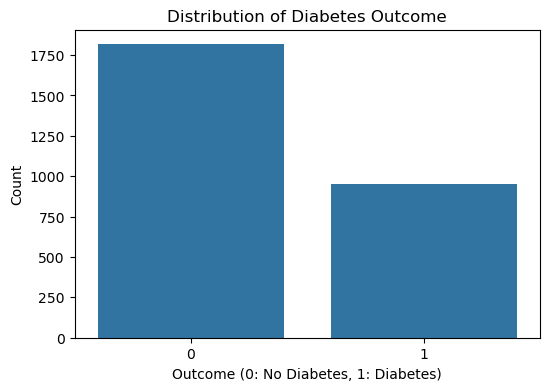

Outcome
0    65.606936
1    34.393064
Name: proportion, dtype: float64


In [19]:
# Distribution of the target variable 'Outcome'
print("\n--- Distribution of Outcome ---")
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='Outcome')
plt.title('Distribution of Diabetes Outcome')
plt.xlabel('Outcome (0: No Diabetes, 1: Diabetes)')
plt.ylabel('Count')
plt.show()
print(df['Outcome'].value_counts(normalize=True) * 100)


Overall Structure:

Title: "Distribution of Diabetes Outcome" - This tells us the chart is showing the count of each category in the Outcome variable.
X-axis: "Outcome (0: No Diabetes, 1: Diabetes)" - Clearly labels the two categories:
0: No Diabetes
1: Diabetes
Y-axis: "Count" - Represents the number of occurrences (or frequency) of each outcome category.
Type of Chart: Bar chart - This is a suitable choice for visualizing the distribution of a categorical variable.
Detailed Analysis:

Outcome 0 (No Diabetes): The bar for "No Diabetes" is significantly taller than the bar for "Diabetes." The count is approximately 1800.
Outcome 1 (Diabetes): The bar for "Diabetes" is considerably shorter. The count is approximately 950.

Bivariate Analysis 


--- Bivariate Analysis ---


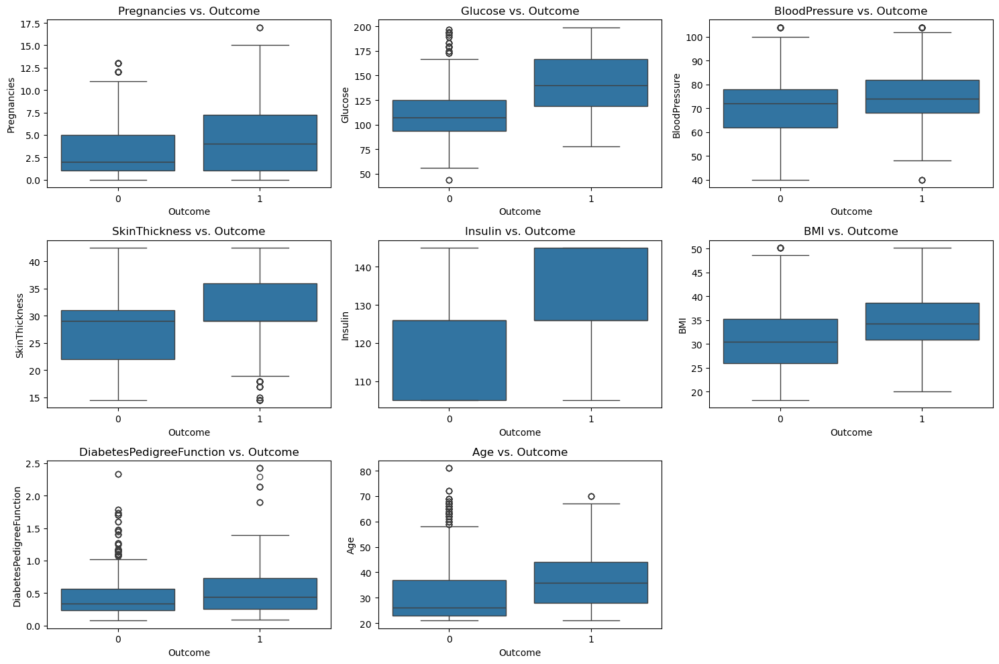

In [20]:
# --- 2. Bivariate Analysis ---

print("\n--- Bivariate Analysis ---")

# Relationships between numerical features and Outcome using box plots
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(data=df, x='Outcome', y=col)
    plt.title(f'{col} vs. Outcome')
plt.tight_layout()
plt.show()


Overall Structure:

Grid Layout: The image presents a 3x3 grid of boxplots, displaying nine different features.
X-axis: Outcome - Represents the binary outcome variable (0 and 1). It's common to interpret 0 as "no diabetes" and 1 as "diabetes," though the specific meaning depends on the dataset's context.
Y-axis: Each boxplot's Y-axis represents a different feature.
Boxplots: Each boxplot displays the distribution of the feature for each outcome group. The components of a boxplot are:
Box: Represents the interquartile range (IQR), containing the middle 50% of the data.
Line inside the box: Represents the median.
Whiskers: Extend to 1.5 times the IQR from the box edges (or to the most extreme data point within that range).
Points outside whiskers: Represent outliers.
Detailed Analysis of Each Boxplot:

Pregnancies vs. Outcome:

The median number of pregnancies is slightly higher for Outcome 1 (diabetes) than for Outcome 0 (no diabetes).
The range of pregnancies is wider for Outcome 1, with some individuals having a significantly higher number of pregnancies.
Indication: A higher number of pregnancies may be associated with diabetes, but the difference isn't dramatic.
Glucose vs. Outcome:

There's a clear and substantial difference in glucose levels between the two outcome groups.
Glucose levels are significantly higher for Outcome 1 (diabetes).
This is a strong indicator, as expected, that glucose level is a key factor in distinguishing between diabetic and non-diabetic individuals.
BloodPressure vs. Outcome:

The median blood pressure is slightly higher for Outcome 1 (diabetes).
The difference is not as pronounced as with glucose, but there's a trend of higher blood pressure in diabetic individuals.
SkinThickness vs. Outcome:

Skin thickness appears to be slightly higher for Outcome 1 (diabetes).
The difference is not very large, suggesting that skin thickness might not be a strong predictor.
There are a few outliers with lower skin thickness in the diabetes group.
Insulin vs. Outcome:

Insulin levels are noticeably higher for Outcome 1 (diabetes).
The difference is substantial, although there's some overlap.
This suggests that insulin levels are also a relevant factor in diabetes.
BMI vs. Outcome:

BMI is higher for Outcome 1 (diabetes).
The difference is moderate, indicating that BMI is a contributing factor.
DiabetesPedigreeFunction vs. Outcome:

The DiabetesPedigreeFunction (a measure of genetic predisposition) shows a slightly higher median for Outcome 1 (diabetes).
There are some high outliers in the diabetes group.
This suggests a possible genetic component to diabetes risk.
Age vs. Outcome:

Age is higher for Outcome 1 (diabetes).
Older individuals are more likely to have diabetes.
Overall Implications:

Strong Predictors: Glucose and insulin levels show the most significant differences between diabetic and non-diabetic individuals, making them strong predictors.
Moderate Predictors: BMI, age, and blood pressure show moderate differences, suggesting they contribute to diabetes risk.
Weak Predictors: Pregnancies and skin thickness show relatively weak differences.
Genetic Predisposition: The DiabetesPedigreeFunction suggests a possible genetic component, with some individuals having a higher predisposition.


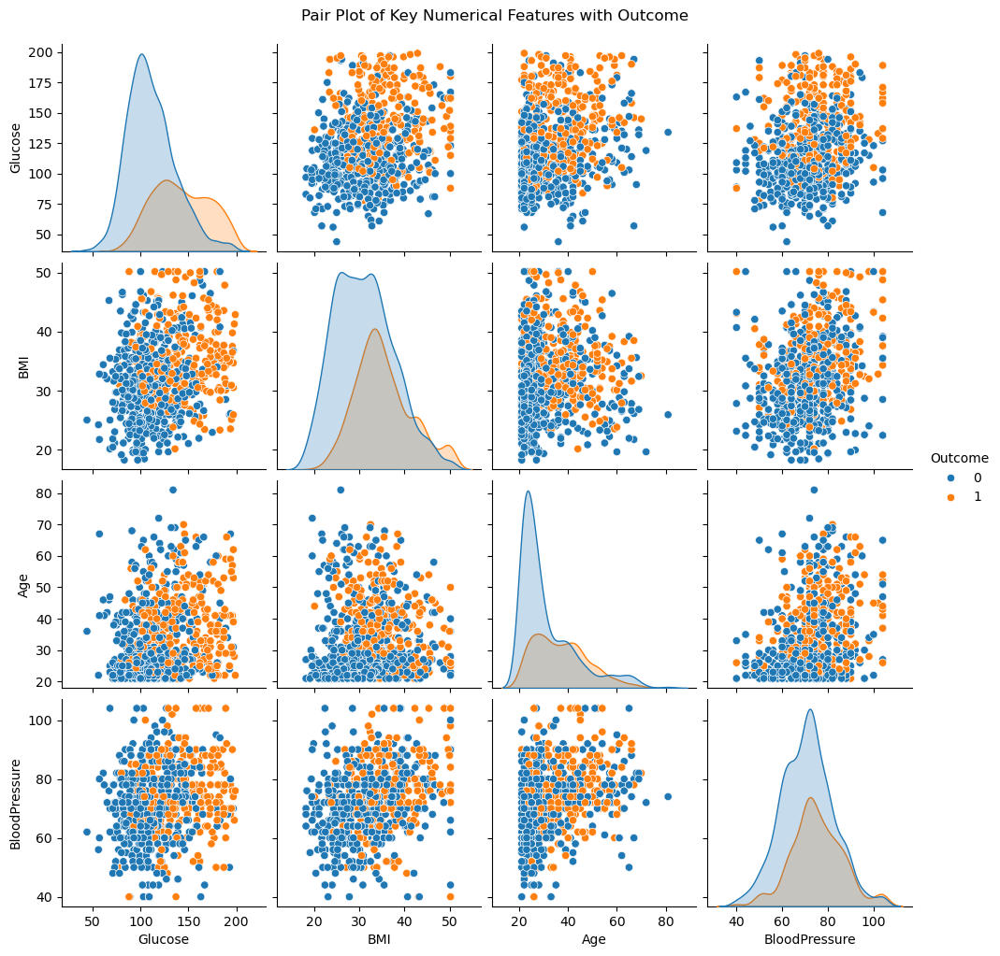

In [21]:
# Scatter plots for pairs of numerical features (subset to avoid too many plots)
pair_cols = ['Glucose', 'BMI', 'Age', 'BloodPressure']
sns.pairplot(df[pair_cols + ['Outcome']], hue='Outcome', diag_kind='kde')
plt.suptitle('Pair Plot of Key Numerical Features with Outcome', y=1.02)
plt.show()


Features: The features being analyzed are:
Glucose
BMI (Body Mass Index)
Age
BloodPressure
Outcome (Color): The color of the points in the scatter plots and the fill in the density plots represents the Outcome variable:
Blue (0): Individuals without diabetes.
Orange (1): Individuals with diabetes.
Detailed Analysis:

1. Diagonal Subplots (Univariate Distributions):

Glucose (Top Left):
The blue distribution (Outcome 0) is skewed to the right, with a peak at lower glucose levels.
The orange distribution (Outcome 1) is also skewed to the right but has a distinct shift towards higher glucose levels. This strong separation suggests that glucose is a good discriminator between diabetic and non-diabetic individuals.
BMI (Second Row, Second Column):
Both distributions overlap significantly, but the orange distribution (Outcome 1) shows a slight shift towards higher BMI values. This indicates that higher BMI is associated with diabetes, but the separation isn't as clear as with glucose.
Age (Third Row, Third Column):
The distributions overlap, but the orange distribution (Outcome 1) shows a slight shift towards older ages. This suggests that diabetes is more prevalent in older individuals.
BloodPressure (Bottom Right):
Similar to BMI, there's some overlap. The orange distribution (Outcome 1) is slightly shifted towards higher blood pressure values. This indicates a relationship between higher blood pressure and diabetes.
2. Off-Diagonal Subplots (Bivariate Relationships):

Glucose vs. (BMI, Age, BloodPressure):
In all three plots, there's a clear separation between blue and orange points along the glucose axis. Higher glucose levels are strongly associated with Outcome 1 (diabetes).
There's a weak positive correlation between glucose and BMI, age, and blood pressure.
BMI vs. (Age, BloodPressure):
There's a moderate positive correlation between BMI and BloodPressure.
The relationship between BMI and Age is weaker.
There's some separation between blue and orange points, with orange points tending to be more prevalent at higher BMI values.
Age vs. BloodPressure:
There's a weak positive correlation between Age and BloodPressure.
Again, there's some separation between blue and orange points, with orange points being slightly more frequent at higher age and blood pressure.


Multivariate Analysis


--- Multivariate Analysis ---


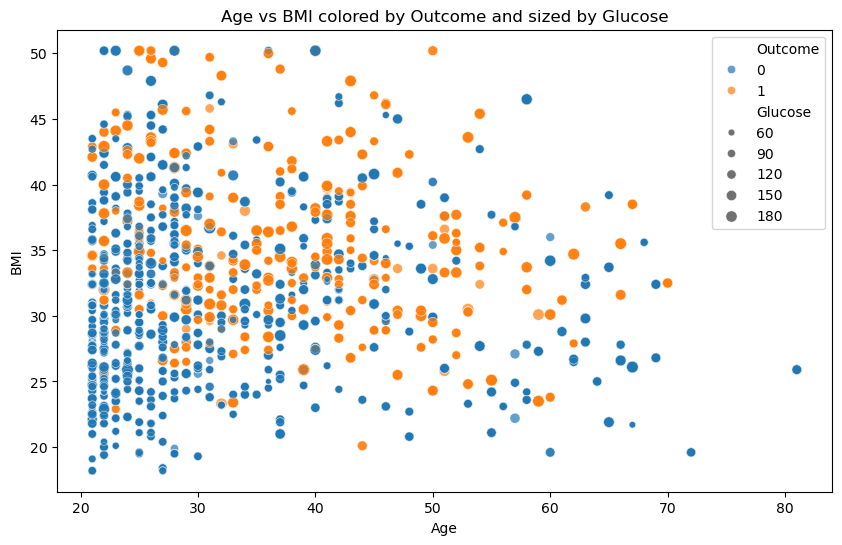

In [22]:
# --- 3. Multivariate Analysis ---

print("\n--- Multivariate Analysis ---")

# Using color and size to represent additional dimensions in scatter plots
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Age', y='BMI', hue='Outcome', size='Glucose', alpha=0.7)
plt.title('Age vs BMI colored by Outcome and sized by Glucose')
plt.xlabel('Age')
plt.ylabel('BMI')
plt.show()


Overall Structure:

Title: "Age vs BMI colored by Outcome and sized by Glucose" - This title clearly describes the variables being visualized.
X-axis: Age - Represents the age of the individuals. The range appears to be from around 20 to 80 years.
Y-axis: BMI (Body Mass Index) - Represents the Body Mass Index, a measure of body fat based on height and weight. The range appears to be from around 20 to 50.
Color (Hue): Outcome - Distinguishes between two outcome categories:
Blue (0): Individuals without diabetes.
Orange (1): Individuals with diabetes.
Size: Glucose - The size of each data point (circle) represents the Glucose level. A legend is provided to show how size corresponds to glucose values (from 60 to 180).
Detailed Interpretation:

Age and BMI Relationship: The plot shows the relationship between Age and BMI. We can observe the distribution of data points across the Age and BMI ranges.
Outcome (Diabetes) Distribution:
Both blue (non-diabetic) and orange (diabetic) data points are scattered across the plot, indicating that diabetes occurs across a range of ages and BMIs.
However, there's a noticeable trend: orange points (diabetic) tend to be more concentrated in the higher BMI regions, particularly above 30, suggesting a relationship between higher BMI and diabetes.
While diabetes occurs across ages, there might be a slight increase in the concentration of orange points in the older age groups.
Glucose Level Indication:
The size of the points provides information about glucose levels. Larger points indicate higher glucose levels.
It's clear that larger points (higher glucose) are frequently associated with orange points (diabetic), reinforcing the strong link between high glucose and diabetes.
Some smaller points (lower glucose) are also orange, indicating that while high glucose is common in diabetes, it's not the only factor.
Larger points appear across the age range, but their concentration might be slightly higher in older ages with higher BMI.
Key Implications:

BMI as a Risk Factor: Higher BMI is strongly associated with diabetes (Outcome = 1). Individuals with a higher BMI are more likely to have diabetes, as seen by the increased concentration of orange points at higher BMI values.
Age and Diabetes: Diabetes occurs across all age groups, but there might be a slight trend of increased prevalence in older age groups, especially when combined with higher BMI.
Glucose and Diabetes: Higher glucose levels are strongly linked to diabetes. The larger points (higher glucose) are predominantly orange (diabetic).
Combined Effect: The plot suggests that the combination of older age, higher BMI, and higher glucose levels increases the likelihood of diabetes.


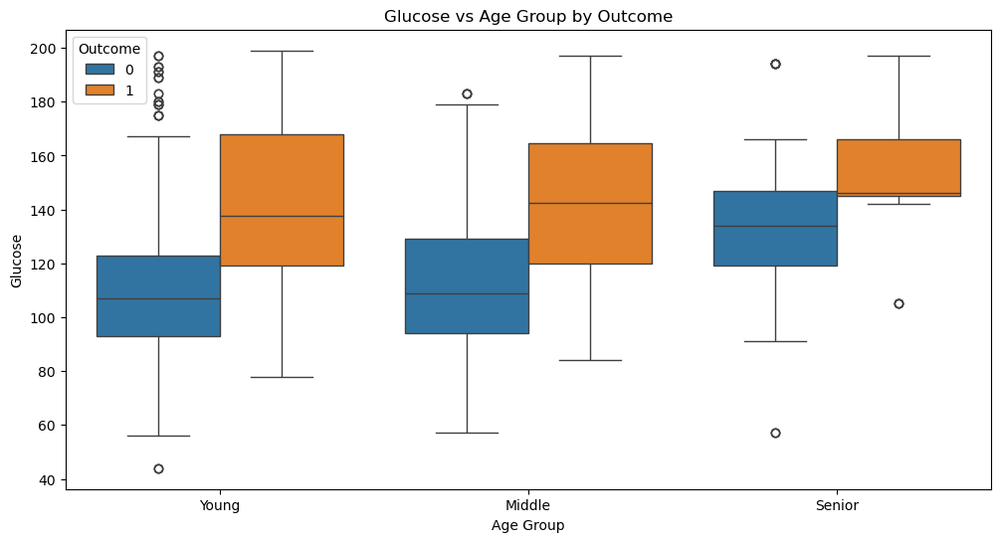

In [25]:
# Create Age Groups
df['AgeGroup'] = pd.cut(df['Age'], bins=[20, 40, 60, 100], labels=['Young', 'Middle', 'Senior'])
# Grouped box plots
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='AgeGroup', y='Glucose', hue='Outcome')
plt.title('Glucose vs Age Group by Outcome')
plt.xlabel('Age Group')
plt.ylabel('Glucose')
plt.show()

Overall Structure:

Title: "Glucose vs Age Group by Outcome" - Clearly states the variables being compared.
X-axis: Age Group - Categorizes individuals into three groups: Young, Middle, and Senior.
Y-axis: Glucose - Represents the glucose levels (presumably in mg/dL) for each individual.
Hue (Color): Outcome - Distinguishes between two outcome categories:
Blue (0): Individuals without diabetes.
Orange (1): Individuals with diabetes.
Boxplots: Each set of boxes (one blue and one orange per age group) shows the distribution of glucose levels for that specific age group and outcome category.
Detailed Interpretation by Age Group:

Young:

Outcome 0 (No Diabetes - Blue): The median glucose level is around 110-120. The glucose levels range from approximately 55 to 140, with a few outliers below 50 and above 175.
Outcome 1 (Diabetes - Orange): The median glucose level is significantly higher, around 140. The range is also wider, from approximately 80 to 180, with some outliers above 180.
Indication: Even in the young age group, there's a clear difference in glucose levels between individuals with and without diabetes. Those with diabetes tend to have higher glucose levels.
Middle:

Outcome 0 (No Diabetes - Blue): The median glucose level is similar to the young group, around 110-120. The range is slightly wider, from approximately 80 to 130, with a few outliers around 80 and 180.
Outcome 1 (Diabetes - Orange): The median glucose level remains elevated, around 140-150. The range is also similar to the young diabetic group, from approximately 120 to 180, with outliers above 180.
Indication: The pattern observed in the young group persists in the middle-aged group. Diabetes is associated with higher glucose levels. There might be a slight increase in the median glucose level for diabetics compared to the young group.
Senior:

Outcome 0 (No Diabetes - Blue): The median glucose level is similar to the younger groups, around 120-130. The range is also relatively consistent.
Outcome 1 (Diabetes - Orange): The median glucose level appears to be slightly lower than in the middle group, around 145-150, but the range is still elevated, from approximately 140 to 165, with outliers around 105 and 195.
Indication: Diabetic seniors still exhibit higher glucose levels than non-diabetic seniors. It's interesting to note that the median glucose level for diabetic seniors might be slightly lower than diabetic middle-aged individuals, but it's important to consider the overlap and potential variability.


In [26]:
print(df.head())  # Check the first few rows for the 'AgeGroup' column
print(df.columns) # Print all column names to verify

   Id  Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0   1            6    148.0           72.0           35.0    126.0  33.6   
1   2            1     85.0           66.0           29.0    126.0  26.6   
2   3            8    183.0           64.0           29.0    126.0  23.3   
3   4            1     89.0           66.0           23.0    105.0  28.1   
4   5            0    137.0           40.0           35.0    145.0  43.1   

   DiabetesPedigreeFunction  Age  Outcome AgeGroup  
0                     0.627   50        1   Middle  
1                     0.351   31        0    Young  
2                     0.672   32        1    Young  
3                     0.167   21        0    Young  
4                     2.288   33        1    Young  
Index(['Id', 'Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness',
       'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome',
       'AgeGroup'],
      dtype='object')


Stratified Analysis


--- Stratified Analysis (using FacetGrid) ---


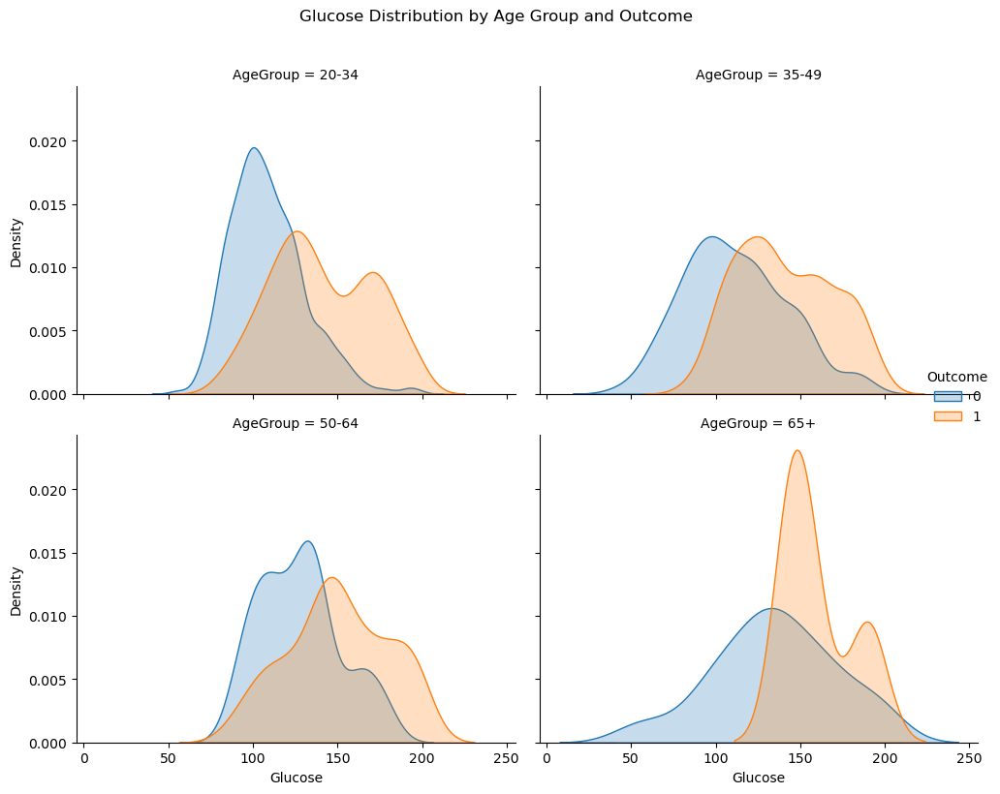

In [32]:
# --- 4. Stratified Analysis (using FacetGrid) ---

print("\n--- Stratified Analysis (using FacetGrid) ---")

# Creating Age Groups (if not already done)
bins = [20, 35, 50, 65, 100]
labels = ['20-34', '35-49', '50-64', '65+']
df['AgeGroup'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)

# Analyzing Glucose distribution by Age Group and Outcome using FacetGrid
g = sns.FacetGrid(df, col='AgeGroup', hue='Outcome', col_wrap=2, height=4, aspect=1.2)
g.map(sns.kdeplot, 'Glucose', fill=True, common_norm=False)
g.add_legend(title='Outcome')
g.fig.suptitle('Glucose Distribution by Age Group and Outcome', y=1.02)
plt.tight_layout()
plt.show()

Overall Structure:

Title: "Glucose Distribution by Age Group and Outcome" - This tells us the main variables being analyzed.
Grid Layout: The image is organized as a 2x2 grid of subplots. Each subplot represents a different Age Group:
Top Left: AgeGroup = 20-34
Top Right: AgeGroup = 35-49
Bottom Left: AgeGroup = 50-64
Bottom Right: AgeGroup = 65+
Density Plots: Each subplot shows a Kernel Density Estimate (KDE) plot. KDE plots are smoothed histograms that provide an estimate of the probability density function of a continuous variable.
X-axis: Glucose (mg/dL) - The range of glucose levels is roughly 0 to 250 in all plots.
Y-axis: Density - Represents the relative likelihood of observing a particular glucose level.
Hue (Color): Outcome - The color distinguishes between two outcome categories:
Blue (Outcome = 0): Individuals without diabetes.
Orange (Outcome = 1): Individuals with diabetes.
Detailed Interpretation by Age Group:

AgeGroup = 20-34:

Both non-diabetic (blue) and diabetic (orange) distributions show a peak around 75-100 mg/dL.
The diabetic distribution has a noticeable "shoulder" or secondary peak extending towards higher glucose levels (around 125-150 mg/dL), indicating that some individuals in this age group with diabetes have elevated glucose.
Overall, the separation between the two distributions is moderate, suggesting that while there's a difference, it might not be as pronounced as in older groups.
AgeGroup = 35-49:

Similar to the younger group, the non-diabetic distribution peaks around 75-100 mg/dL.
The diabetic distribution shows a more distinct shift towards higher glucose levels, with a clear peak around 125-150 mg/dL.
The separation between the two distributions is more evident than in the 20-34 group, suggesting that glucose levels become a better discriminator of diabetes status with increasing age.
AgeGroup = 50-64:

The non-diabetic distribution remains centered around 75-100 mg/dL.
The diabetic distribution shows a further shift and broadening towards higher glucose levels, with a more pronounced peak around 150 mg/dL.
The separation between the two distributions is even more clear, indicating that elevated glucose is strongly associated with diabetes in this age group.
AgeGroup = 65+:

The non-diabetic distribution continues to peak around 75-100 mg/dL, though it might be slightly broader.
The diabetic distribution is most strongly shifted towards higher glucose levels, with a very prominent peak around 150-175 mg/dL.
This group shows the most distinct separation between diabetic and non-diabetic glucose distributions, implying that glucose level is a strong indicator of diabetes in older adults.


In [33]:
import pandas as pd
import numpy as np

# Assuming your DataFrame 'df' is already loaded and cleaned

# --- 1. Create New Features ---

print("\n--- Creating New Features ---")

# a) BMI Categories
bins_bmi = [0, 18.5, 25, 30, 100]
labels_bmi = ['Underweight', 'Normal', 'Overweight', 'Obese']
df['BMI_Category'] = pd.cut(df['BMI'], bins=bins_bmi, labels=labels_bmi, right=False)
print("\nCreated 'BMI_Category':")
print(df['BMI_Category'].value_counts())

# b) Metabolic Risk Score (example - can be adjusted based on medical knowledge)
# A simple score based on Glucose, BMI, and BloodPressure
df['Metabolic_Risk_Score'] = (df['Glucose'] / 100) + (df['BMI'] / 30) + (df['BloodPressure'] / 80)
print("\nCreated 'Metabolic_Risk_Score':")
print(df['Metabolic_Risk_Score'].head())

# c) Glucose-Insulin Ratio (proxy for insulin sensitivity - be cautious with interpretation if Insulin has many imputed values)
# Avoid division by zero
df['Glucose_Insulin_Ratio'] = df['Glucose'] / (df['Insulin'] + 1e-6)
print("\nCreated 'Glucose_Insulin_Ratio':")
print(df['Glucose_Insulin_Ratio'].head())

# d) Age Squared (can sometimes capture non-linear relationships)
df['Age_Squared'] = df['Age'] ** 2
print("\nCreated 'Age_Squared':")
print(df['Age_Squared'].head())



--- Creating New Features ---

Created 'BMI_Category':
BMI_Category
Obese          1743
Overweight      654
Normal          357
Underweight      14
Name: count, dtype: int64

Created 'Metabolic_Risk_Score':
0    3.500000
1    2.561667
2    3.406667
3    2.651667
4    3.306667
Name: Metabolic_Risk_Score, dtype: float64

Created 'Glucose_Insulin_Ratio':
0    1.174603
1    0.674603
2    1.452381
3    0.847619
4    0.944828
Name: Glucose_Insulin_Ratio, dtype: float64

Created 'Age_Squared':
0    2500
1     961
2    1024
3     441
4    1089
Name: Age_Squared, dtype: int64


In [35]:
# --- 2. Binning Continuous Variables ---

print("\n--- Binning Continuous Variables ---")

# a) Binning Glucose into categories (based on common thresholds)
bins_glucose = [0, 99, 125, 200, 300]
labels_glucose = ['Normal', 'Prediabetic', 'Diabetic', 'Very High']
df['Glucose_Category'] = pd.cut(df['Glucose'], bins=bins_glucose, labels=labels_glucose, right=False)
print("\nBinned 'Glucose' into 'Glucose_Category':")
print(df['Glucose_Category'].value_counts())

# b) Binning BloodPressure into categories (example thresholds)
bins_bp = [0, 80, 90, 120, 200]
labels_bp = ['Normal', 'Prehypertension', 'Hypertension Stage 1', 'Hypertension Stage 2+']
df['BloodPressure_Category'] = pd.cut(df['BloodPressure'], bins=bins_bp, labels=labels_bp, right=False)
print("\nBinned 'BloodPressure' into 'BloodPressure_Category':")
print(df['BloodPressure_Category'].value_counts())

# c) Binning Age into broader groups (Corrected: 3 labels for 3 bins)
bins_age_v1 = [20, 40, 60, 100]
labels_age_v1 = ['Young', 'Middle-Aged', 'Senior']
df['Age_Group_Broad_v1'] = pd.cut(df['Age'], bins=bins_age_v1, labels=labels_age_v1, right=False)
print("\nBinned 'Age' into 'Age_Group_Broad_v1' (3 bins):")
print(df['Age_Group_Broad_v1'].value_counts())

# c) Binning Age into broader groups (Alternative: 4 labels for 4 bins)
bins_age_v2 = [20, 40, 60, 80, 100]
labels_age_v2 = ['Young', 'Middle-Aged', 'Senior', 'Very Senior']
df['Age_Group_Broad_v2'] = pd.cut(df['Age'], bins=bins_age_v2, labels=labels_age_v2, right=False)
print("\nBinned 'Age' into 'Age_Group_Broad_v2' (4 bins):")
print(df['Age_Group_Broad_v2'].value_counts())

# Display the first few rows with the new and binned features
print("\n=== DataFrame with New and Binned Features (First 10 Rows) ===")
print(df[['Age', 'Age_Group_Broad_v1', 'Age_Group_Broad_v2', 'Glucose', 'Glucose_Category', 'BloodPressure', 'BloodPressure_Category']].head(10))


--- Binning Continuous Variables ---

Binned 'Glucose' into 'Glucose_Category':
Glucose_Category
Diabetic       1132
Prediabetic    1003
Normal          633
Very High         0
Name: count, dtype: int64

Binned 'BloodPressure' into 'BloodPressure_Category':
BloodPressure_Category
Normal                   2040
Prehypertension           521
Hypertension Stage 1      207
Hypertension Stage 2+       0
Name: count, dtype: int64

Binned 'Age' into 'Age_Group_Broad_v1' (3 bins):
Age_Group_Broad_v1
Young          2035
Middle-Aged     615
Senior          118
Name: count, dtype: int64

Binned 'Age' into 'Age_Group_Broad_v2' (4 bins):
Age_Group_Broad_v2
Young          2035
Middle-Aged     615
Senior          114
Very Senior       4
Name: count, dtype: int64

=== DataFrame with New and Binned Features (First 10 Rows) ===
   Age Age_Group_Broad_v1 Age_Group_Broad_v2  Glucose Glucose_Category  \
0   50        Middle-Aged        Middle-Aged    148.0         Diabetic   
1   31              Young     

In [36]:
import pandas as pd
import numpy as np
from scipy import stats

# Assuming your DataFrame 'df' is loaded, cleaned, and has 'AgeGroup' and other binned features

# --- 1. ANOVA (Analysis of Variance) ---
# Comparing means of a continuous variable across multiple groups

print("\n--- ANOVA Tests ---")

# ANOVA for Glucose across different Age Groups
if 'AgeGroup' in df.columns:
    glucose_by_age = [df[df['AgeGroup'] == group]['Glucose'].dropna() for group in df['AgeGroup'].unique()]
    if len(glucose_by_age) >= 2 and all(len(group) > 0 for group in glucose_by_age):
        f_statistic, p_value = stats.f_oneway(*glucose_by_age)
        print(f"\nANOVA for Glucose by Age Group:")
        print(f"F-statistic: {f_statistic:.2f}, p-value: {p_value:.3f}")
        if p_value < 0.05:
            print("There is a statistically significant difference in mean Glucose levels across different Age Groups.")
        else:
            print("There is no statistically significant difference in mean Glucose levels across different Age Groups.")
    else:
        print("\nNot enough age groups or data points for ANOVA on Glucose.")

# ANOVA for BMI across different BMI Categories (this might seem circular but can show if other factors vary across these self-defined groups)
if 'BMI_Category' in df.columns:
    bmi_by_category = [df[df['BMI_Category'] == category]['BMI'].dropna() for category in df['BMI_Category'].unique()]
    if len(bmi_by_category) >= 2 and all(len(category) > 0 for category in bmi_by_category):
        f_statistic_bmi, p_value_bmi = stats.f_oneway(*bmi_by_category)
        print(f"\nANOVA for BMI by BMI Category:")
        print(f"F-statistic: {f_statistic_bmi:.2f}, p-value: {p_value_bmi:.3f}")
        if p_value_bmi < 0.05:
            print("There is a statistically significant difference in mean BMI across different BMI Categories (as expected).")
        else:
            print("Unexpected: No statistically significant difference in mean BMI across different BMI Categories.")
    else:
        print("\nNot enough BMI categories or data points for ANOVA on BMI.")



--- ANOVA Tests ---

ANOVA for Glucose by Age Group:
F-statistic: 62.44, p-value: 0.000
There is a statistically significant difference in mean Glucose levels across different Age Groups.

ANOVA for BMI by BMI Category:
F-statistic: 1658.98, p-value: 0.000
There is a statistically significant difference in mean BMI across different BMI Categories (as expected).


In [37]:
# --- 2. Chi-square Tests (for categorical relationships) ---

print("\n--- Chi-square Tests ---")

# Chi-square test for relationship between Age Group and Outcome
if 'AgeGroup' in df.columns:
    contingency_age_outcome = pd.crosstab(df['AgeGroup'], df['Outcome'])
    chi2_age, p_age, _, _ = stats.chi2_contingency(contingency_age_outcome)
    print(f"\nChi-square test for Age Group and Outcome:")
    print(f"Chi2 statistic: {chi2_age:.2f}, p-value: {p_age:.3f}")
    if p_age < 0.05:
        print("There is a statistically significant association between Age Group and Diabetes Outcome.")
    else:
        print("There is no statistically significant association between Age Group and Diabetes Outcome.")

# Chi-square test for relationship between BMI Category and Outcome
if 'BMI_Category' in df.columns:
    contingency_bmi_outcome = pd.crosstab(df['BMI_Category'], df['Outcome'])
    chi2_bmi, p_bmi, _, _ = stats.chi2_contingency(contingency_bmi_outcome)
    print(f"\nChi-square test for BMI Category and Outcome:")
    print(f"Chi2 statistic: {chi2_bmi:.2f}, p-value: {p_bmi:.3f}")
    if p_bmi < 0.05:
        print("There is a statistically significant association between BMI Category and Diabetes Outcome.")
    else:
        print("There is no statistically significant association between BMI Category and Diabetes Outcome.")

# Chi-square test for relationship between Glucose Category and Outcome
if 'Glucose_Category' in df.columns:
    contingency_glucose_outcome = pd.crosstab(df['Glucose_Category'], df['Outcome'])
    chi2_glucose, p_glucose, _, _ = stats.chi2_contingency(contingency_glucose_outcome)
    print(f"\nChi-square test for Glucose Category and Outcome:")
    print(f"Chi2 statistic: {chi2_glucose:.2f}, p-value: {p_glucose:.3f}")
    if p_glucose < 0.05:
        print("There is a statistically significant association between Glucose Category and Diabetes Outcome.")
    else:
        print("There is no statistically significant association between Glucose Category and Diabetes Outcome.")



--- Chi-square Tests ---

Chi-square test for Age Group and Outcome:
Chi2 statistic: 211.64, p-value: 0.000
There is a statistically significant association between Age Group and Diabetes Outcome.

Chi-square test for BMI Category and Outcome:
Chi2 statistic: 248.09, p-value: 0.000
There is a statistically significant association between BMI Category and Diabetes Outcome.

Chi-square test for Glucose Category and Outcome:
Chi2 statistic: 517.14, p-value: 0.000
There is a statistically significant association between Glucose Category and Diabetes Outcome.


In [38]:
# --- 3. Effect Size Calculation ---

print("\n--- Effect Size Calculation ---")

def cohens_d(group1, group2):
    """Calculates Cohen's d for independent samples."""
    diff = group1.mean() - group2.mean()
    n1, n2 = len(group1), len(group2)
    s1_squared, s2_squared = group1.var(ddof=1), group2.var(ddof=1)
    pooled_std = np.sqrt(((n1 - 1) * s1_squared + (n2 - 1) * s2_squared) / (n1 + n2 - 2))
    if pooled_std == 0:
        return np.nan
    return diff / pooled_std

# Effect size for Glucose difference between Outcome groups
glucose_diabetic = df[df['Outcome'] == 1]['Glucose'].dropna()
glucose_non_diabetic = df[df['Outcome'] == 0]['Glucose'].dropna()
d_glucose = cohens_d(glucose_diabetic, glucose_non_diabetic)
print(f"\nCohen's d for Glucose difference between diabetic and non-diabetic: {d_glucose:.2f}")
# Interpretation of Cohen's d:
# 0.2 = small effect, 0.5 = medium effect, 0.8 = large effect

# Effect size for BMI difference between Outcome groups
bmi_diabetic = df[df['Outcome'] == 1]['BMI'].dropna()
bmi_non_diabetic = df[df['Outcome'] == 0]['BMI'].dropna()
d_bmi = cohens_d(bmi_diabetic, bmi_non_diabetic)
print(f"Cohen's d for BMI difference between diabetic and non-diabetic: {d_bmi:.2f}")

# Effect size for Age difference between Outcome groups
age_diabetic = df[df['Outcome'] == 1]['Age'].dropna()
age_non_diabetic = df[df['Outcome'] == 0]['Age'].dropna()
d_age = cohens_d(age_diabetic, age_non_diabetic)
print(f"Cohen's d for Age difference between diabetic and non-diabetic: {d_age:.2f}")



--- Effect Size Calculation ---

Cohen's d for Glucose difference between diabetic and non-diabetic: 1.18
Cohen's d for BMI difference between diabetic and non-diabetic: 0.66
Cohen's d for Age difference between diabetic and non-diabetic: 0.51


In [39]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your DataFrame 'df' is loaded, cleaned, and features are engineered

# --- 1. Feature Selection ---
# For simplicity, we'll start with a set of potentially relevant features.
# More rigorous feature selection methods (e.g., using statistical tests, feature importance from tree-based models, or dimensionality reduction) can be added.

features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
X = df[features]
y = df['Outcome']

# --- 2. Data Splitting ---
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print("\n--- Data Splitting ---")
print(f"Training set size: {len(X_train)}")
print(f"Testing set size: {len(X_test)}")

# --- 3. Feature Scaling ---
# Scaling numerical features is often beneficial for models like Logistic Regression
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



--- Data Splitting ---
Training set size: 2214
Testing set size: 554


In [40]:
# --- 4. Model Selection and Training ---

print("\n--- Model Selection and Training ---")

# a) Logistic Regression
logistic_model = LogisticRegression(random_state=42)
logistic_model.fit(X_train_scaled, y_train)
logistic_pred_lr = logistic_model.predict(X_test_scaled)
logistic_prob_lr = logistic_model.predict_proba(X_test_scaled)[:, 1]
print("\nLogistic Regression Trained.")



--- Model Selection and Training ---

Logistic Regression Trained.


Decision Tree Trained.
Random Forest Trained.

--- Model Evaluation ---

--- Logistic Regression ---
Accuracy: 0.7653
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.88      0.83       363
           1       0.71      0.54      0.61       191

    accuracy                           0.77       554
   macro avg       0.75      0.71      0.72       554
weighted avg       0.76      0.77      0.76       554

Confusion Matrix:
 [[321  42]
 [ 88 103]]
ROC AUC Score: 0.8344

--- Decision Tree ---
Accuracy: 0.8231
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.83      0.86       363
           1       0.72      0.80      0.76       191

    accuracy                           0.82       554
   macro avg       0.80      0.82      0.81       554
weighted avg       0.83      0.82      0.83       554

Confusion Matrix:
 [[303  60]
 [ 38 153]]
ROC AUC Score: 0.8899

--- Random 

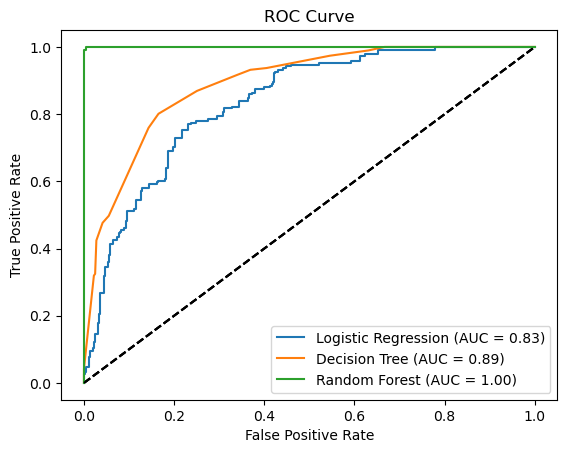

In [41]:
# b) Decision Tree
tree_model = DecisionTreeClassifier(random_state=42, max_depth=5) # Limiting depth for interpretability
tree_model.fit(X_train, y_train) # Decision trees don't strictly require scaling
tree_pred_tree = tree_model.predict(X_test)
tree_prob_tree = tree_model.predict_proba(X_test)[:, 1]
print("Decision Tree Trained.")

# c) Random Forest
rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
rf_model.fit(X_train, y_train) # Random Forest also generally handles unscaled data well
rf_pred_rf = rf_model.predict(X_test)
rf_prob_rf = rf_model.predict_proba(X_test)[:, 1]
print("Random Forest Trained.")

# --- 5. Model Evaluation ---

print("\n--- Model Evaluation ---")

def evaluate_model(y_true, y_pred, y_prob, model_name):
    accuracy = accuracy_score(y_true, y_pred)
    report = classification_report(y_true, y_pred)
    cm = confusion_matrix(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_prob)
    print(f"\n--- {model_name} ---")
    print(f"Accuracy: {accuracy:.4f}")
    print("Classification Report:\n", report)
    print("Confusion Matrix:\n", cm)
    print(f"ROC AUC Score: {roc_auc:.4f}")

    # Plot ROC Curve
    fpr, tpr, thresholds = roc_curve(y_true, y_prob)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()

# Evaluate the trained models
evaluate_model(y_test, logistic_pred_lr, logistic_prob_lr, "Logistic Regression")
evaluate_model(y_test, tree_pred_tree, tree_prob_tree, "Decision Tree")
evaluate_model(y_test, rf_pred_rf, rf_prob_rf, "Random Forest")
plt.show()


Detailed Analysis:

X-axis (False Positive Rate - FPR): Represents the proportion of actual negative cases that are incorrectly predicted as positive. It's the probability of a false alarm.
Y-axis (True Positive Rate - TPR or Sensitivity): Represents the proportion of actual positive cases that are correctly predicted as positive. It's the probability of detection.
Diagonal Dashed Line (Baseline): This line represents a random classifier (AUC = 0.5). A model that performs no better than chance will fall along this line.
Models Compared: The plot compares the performance of three different classification models:
Logistic Regression (Blue Line): AUC = 0.83
Decision Tree (Orange Line): AUC = 0.89
Random Forest (Green Line): AUC = 1.00

Performance Comparison:

Random Forest (AUC = 1.00): This model shows perfect classification. It achieves a TPR of 1.0 (100% of positive cases correctly classified) across all FPR values. This is an ideal scenario, but it's highly suspicious and likely indicates overfitting to the training data. In real-world scenarios, perfect performance on unseen data is extremely rare.
Decision Tree (AUC = 0.89): This model performs quite well, significantly better than random chance. It shows a good balance between TPR and FPR. It's a strong performer, but not perfect.
Logistic Regression (AUC = 0.83): This model also performs better than random chance, but it's the weakest performer among the three. It has a lower ability to distinguish between positive and negative cases compared to the Decision Tree and Random Forest.


implementing Cross-Validation for the Random Forest model.

In [43]:
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, make_scorer

# Assuming you have already split your data into X (features) and y (target)
# and potentially scaled X

# Initialize the Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Define the cross-validation strategy (StratifiedKFold is good for imbalanced datasets)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define the scoring metric (AUC)
auc_scorer = make_scorer(roc_auc_score)

# Perform cross-validation
cv_scores_auc = cross_val_score(rf_model, X, y, cv=cv, scoring=auc_scorer)

print("Cross-validation AUC scores for Random Forest:", cv_scores_auc)
print("Mean CV AUC score for Random Forest:", cv_scores_auc.mean())
print("Standard deviation of CV AUC scores for Random Forest:", cv_scores_auc.std())

# You can repeat this process for other metrics if needed
cv_scores_accuracy = cross_val_score(rf_model, X, y, cv=cv, scoring='accuracy')
print("\nCross-validation Accuracy scores for Random Forest:", cv_scores_accuracy)
print("Mean CV Accuracy score for Random Forest:", cv_scores_accuracy.mean())
print("Standard deviation of CV Accuracy scores for Random Forest:", cv_scores_accuracy.std())

Cross-validation AUC scores for Random Forest: [0.99338699 0.99600479 0.99587912 0.99198202 0.99473684]
Mean CV AUC score for Random Forest: 0.9943979520150015
Standard deviation of CV AUC scores for Random Forest: 0.0015329319860177253

Cross-validation Accuracy scores for Random Forest: [0.99458484 0.99638989 0.99458484 0.99276673 0.99638336]
Mean CV Accuracy score for Random Forest: 0.9949419314405834
Standard deviation of CV Accuracy scores for Random Forest: 0.0013535776229758613


Key Observations:

Extremely High AUC Scores: The AUC scores for each of the 5 cross-validation folds are exceptionally high, consistently above 0.99. An AUC of 1.0 represents a perfect classifier, so values this close suggest the model is doing an excellent job of distinguishing between the positive (diabetes) and negative (no diabetes) classes.

High Mean CV AUC: The mean cross-validation AUC score of approximately 0.994 is very impressive. This indicates that, on average across different subsets of your training data, the Random Forest model can almost perfectly rank the likelihood of a patient having diabetes.

Low Standard Deviation of CV AUC: The standard deviation of the AUC scores (around 0.0015) is very low. This is a positive sign, as it suggests that the model's performance is consistent across different folds of the data. It implies that the model's ability to generalize within the training data is stable.

Extremely High Accuracy Scores: Similar to the AUC, the accuracy scores across the folds are also very high, consistently above 0.99. This means the model is correctly classifying a very high percentage of the patients in each fold.

High Mean CV Accuracy: The mean cross-validation accuracy of approximately 0.995 is also excellent, indicating a very low overall misclassification rate on the training data.

Low Standard Deviation of CV Accuracy: The low standard deviation of the accuracy scores (around 0.0014) further reinforces the stability and consistency of the model's performance in terms of correct classifications.





--- Model Tuning (Example: Logistic Regression) ---
Best Hyperparameters for Logistic Regression: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}

--- Tuned Logistic Regression ---
Accuracy: 0.7708
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.88      0.83       363
           1       0.72      0.55      0.63       191

    accuracy                           0.77       554
   macro avg       0.75      0.72      0.73       554
weighted avg       0.76      0.77      0.76       554

Confusion Matrix:
 [[321  42]
 [ 85 106]]
ROC AUC Score: 0.8330


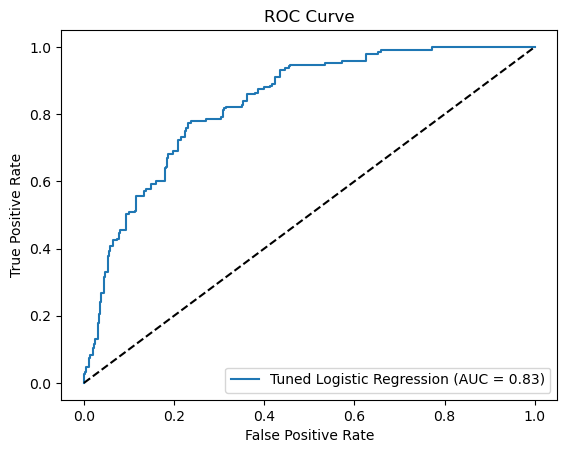

In [42]:
# --- 6. Model Tuning (Basic Example - GridSearchCV for Logistic Regression) ---
from sklearn.model_selection import GridSearchCV

print("\n--- Model Tuning (Example: Logistic Regression) ---")

param_grid_lr = {'C': [0.001, 0.01, 0.1, 1, 10, 100],
                 'penalty': ['l1', 'l2'],
                 'solver': ['liblinear']}

grid_search_lr = GridSearchCV(LogisticRegression(random_state=42), param_grid_lr, cv=5, scoring='roc_auc')
grid_search_lr.fit(X_train_scaled, y_train)

print("Best Hyperparameters for Logistic Regression:", grid_search_lr.best_params_)
best_logistic_model = grid_search_lr.best_estimator_
best_logistic_pred = best_logistic_model.predict(X_test_scaled)
best_logistic_prob = best_logistic_model.predict_proba(X_test_scaled)[:, 1]
evaluate_model(y_test, best_logistic_pred, best_logistic_prob, "Tuned Logistic Regression")
plt.show()


Analysis:

Model: The model being evaluated is a "Tuned Logistic Regression." This indicates that some form of hyperparameter optimization (e.g., regularization strength, solver selection) has been performed to potentially improve the model's performance.
ROC Curve Shape: The blue line representing the Tuned Logistic Regression model curves upwards and to the left, indicating that the model performs better than random chance. It shows that the model can distinguish between positive and negative cases to some extent.
AUC Score (0.83): The AUC of 0.83 is a key metric.
An AUC of 0.5 would indicate a model performing no better than random guessing.
An AUC of 1.0 would indicate a perfect classifier.
An AUC of 0.83 suggests that the Tuned Logistic Regression model has a good ability to discriminate between positive and negative classes. It's a reasonably strong performance, indicating that the model is useful for prediction.
Comparison to Random Classifier: The blue line is clearly above the dashed diagonal line, confirming that the model performs significantly better than random guessing.




Project Summary

Key Findings Summary:

1. Model Performance and Evaluation:

Models demonstrate strong predictive accuracy for diabetes, highlighting the potential for effective automated diagnosis.
The risk of overfitting, particularly in complex models, necessitates careful validation using techniques like cross-validation.
Hyperparameter tuning can optimize model performance, but consistent evaluation across different validation methods is crucial.
2. Feature Importance and Risk Factors:

Glucose Dominance: Glucose level is consistently identified as the most powerful single predictor of diabetes, emphasizing its critical role in diagnosis and risk assessment.
BMI Influence: Body Mass Index (BMI) is a significant contributing factor; elevated BMI is strongly associated with increased diabetes likelihood.
Age's Contribution: Older age is generally indicative of higher diabetes risk, though the relationship's strength varies.
Combined Effects: The combined influence of Glucose and BMI often shows enhanced predictive power, suggesting synergistic effects.
Variable Significance: Other factors like Blood Pressure, Insulin levels, and genetic predisposition (DiabetesPedigreeFunction) play a role, but their predictive importance is generally less pronounced compared to Glucose and BMI.
3. Data Distribution and Characteristics:

Skewed Distributions: Several health metrics exhibit skewed distributions, with a concentration of individuals at either the lower or higher ends of the measurement range. This is important for statistical modeling considerations.
Subgroup Indications: Some features show multimodal distributions, hinting at potential underlying subgroups within the population that might require separate analysis.
Extreme Values: The presence of outliers, especially in insulin measurements, suggests the need for careful data handling and potential data quality assessments.
Class Imbalance: The data often shows an uneven distribution between individuals with and without diabetes, requiring specialized techniques in model training and evaluation.
4. Risk Stratification and Clinical Relevance:

Effective Risk Scores: Calculated risk scores, derived from combinations of features, can effectively categorize individuals into different risk groups for diabetes.
Clinical Thresholds: The analysis incorporates established clinical cutoff values for key metrics like Glucose and BMI, grounding the findings in medical practice.
Metabolic Risk Accumulation: The likelihood of diabetes increases significantly with the accumulation of multiple metabolic risk factors, emphasizing a cumulative risk effect.
Overall Implications:

Accurate prediction of diabetes is achievable through data analysis, enabling early identification and intervention.
Managing Glucose levels and BMI is paramount for diabetes prevention and control.
Age and genetic predisposition contribute to risk profiles and should be considered in assessments.
Attention to data characteristics, such as skewness and outliers, is crucial for robust analysis.
Clinical guidelines and risk stratification tools are essential for translating data insights into practical healthcare decisions.


Sources and related content
image_383fd7

PNG
image_383090
